# Part 3: Plots and Analysis

This notebook is the third and final notebook for reproducing [Imig et al 2023](http://astronomy.nmsu.edu/jimig/Imig_MW_density.pdf). In this notebook, all of the figures and numbers presented as results in the paper are produced. The Selection Function calculated in Part 1, and the best-fitting density parameters from Part 2, are both needed to produce these plots.

Table of Contents:
- **3A: Introduction and Setup Plots**
    - Introductory and sample refinement plots. Figures X - Y in the paper.
- **3B: Density Profile Results**
    - The results of the density fits... Figures X - Y in the paper.
- **3C: Self-Portrait and Integrated Properties Results**
    - The results of the integrated... Figures X - Y in the paper.

In [1]:
import numpy as np
import astropy.io.fits as fits
import astropy.io.ascii as apascii
from astropy.table import Table
import pandas as pd

# Plotting
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import LogNorm
from matplotlib.transforms import ScaledTranslation
import matplotlib.image as mpimg
import matplotlib as mpl

from scipy.interpolate import interpn
from scipy.spatial import ConvexHull

import corner
import sys
import os


# Manga DAP for spectral measurements
from mangadap.par.absorptionindexdb import AbsorptionIndexDB
from mangadap.proc.spectralindices import AbsorptionLineIndices

#for coords
import astropy.units as u
import astropy.coordinates as coord
from astropy.coordinates import Galactocentric

# Sample Setup and helper functions
from mw_density import sample_selection, plotting_helpers, mcmc_functions
from mw_density.density_profiles import combined_exp_profile_nonsmoothed_linear, radial_broken_exp
sample_selection.set_env_variables()

# Selection Funciton
import apogee.select as apsel
import apogee.tools.read as apread
import dill as pickle



/Users/jimig/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
#Define Plotting Parameters
params = {'axes.labelsize': 36, 'xtick.labelsize': 36, 'ytick.labelsize': 36, 
          'text.usetex': False, 'lines.linewidth': 1,
          'axes.titlesize': 22, 'font.family': 'serif', 'font.size': 36}
plt.rcParams.update(params)

In [3]:
figure_directory = 'results/figures/'
param_results = 'results/density_params.fits'

# 3A: Set up and Introduction Plots 

In [4]:
age_bins, mh_bins = sample_selection.setup_maap_bins()
allstar = fits.open(sample_selection.get_allstar_filepath())[1].data
distmass = fits.open(sample_selection.get_distmass_filepath())[1].data
data_mask = sample_selection.get_data_mask(allstar, distmass)
low_alpha_mask, high_alpha_mask = sample_selection.get_alpha_masks(allstar[data_mask])

apogee_sample = fits.open('data/apogee_sample.fits')[1].data
logg_min_lim = np.min(apogee_sample['LOGG'])
logg_max_lim = np.max(apogee_sample['LOGG'])
N_stars = len(apogee_sample)
print(f'Number of Stars in Sample: {N_stars}')

Number of Stars in Sample: 203197


### Coordinates and parameters

In [5]:
data_xs = apogee_sample['GALACTIC_X']
data_ys = apogee_sample['GALACTIC_Y']
data_zs = apogee_sample['GALACTIC_Z']
data_rs = apogee_sample['GALACTIC_R']

ages = apogee_sample['AGE']
metals = apogee_sample['M_H']
alphas = apogee_sample['ALPHA_M']

In [6]:
print(coord.Galactocentric.z_sun)
print(coord.Galactocentric.galcen_distance)

None
None


# Figure 1: Sample Overview

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/652923950.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels(['','-10','-5','0',5,1

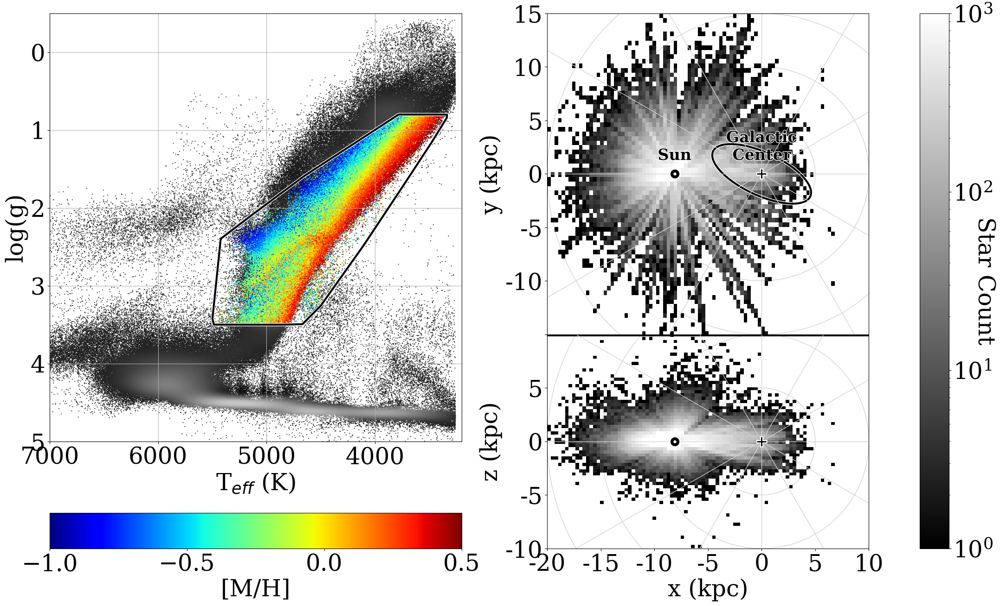

In [7]:
hull = ConvexHull(np.array([apogee_sample['TEFF'],apogee_sample['LOGG']]).T)
hull_x,hull_y = hull.points[hull.vertices].T

plt.figure(figsize=(25, 15))
ax_ratio = (15,13)

ax0 = plt.subplot2grid((15, 26), (0, 0), colspan=ax_ratio[1]-1,rowspan=ax_ratio[0]-3) #HR diagram
cax0 = plt.subplot2grid((15, 26), (ax_ratio[0]-1, 0), colspan=ax_ratio[1]-1,rowspan=1) #[M/H] colorbar


ax1 = plt.subplot2grid((15,26), (0, 13), colspan=ax_ratio[1]-1, rowspan=9) #face-on counts
plotting_helpers.plot_sun_and_GC(ax=ax1)

ax2 = plt.subplot2grid((15,26), (ax_ratio[0]-6, 13), colspan=ax_ratio[1]-1, rowspan=6) #edge-on counts
plotting_helpers.plot_sun_and_GC(ax=ax2,labels='False')

ax_c = plt.subplot2grid((15,26), (0, 25), colspan=1,rowspan=ax_ratio[0]) #Star count colorbar



for r in [5,10,15,20]:
    circgrid = plt.Circle((0, 0), r, facecolor='None',edgecolor='lightgray')
    ax1.add_patch(circgrid)
    circgrid = plt.Circle((0, 0), r, facecolor='None',edgecolor='lightgray')
    ax2.add_patch(circgrid)

im=ax1.hist2d(apogee_sample['GALACTIC_X'],apogee_sample['GALACTIC_Y'],cmap='gray',bins=100,norm=LogNorm(1,1e3))
cbar = plt.colorbar(im[3],cax=ax_c,label='N stars')
cbar.set_label(label='Star Count',rotation=-90)

ax2.hist2d(apogee_sample['GALACTIC_X'],apogee_sample['GALACTIC_Z'],cmap='gray',bins=100,norm=LogNorm(1,1e3))

ax1.set_ylabel('y (kpc)')
ax2.set_ylabel('z (kpc)')
ax2.set_xlabel('x (kpc)')

ax1.set_ylim(-15,15)
ax2.set_ylim(-5,5)
ax2.axhline(10,c='k',lw=5)
ax2.set_yticks([-10,-5,0,5,10])
ax2.set_yticklabels(['-10','-5',0,5,''])
ax1.set_yticklabels(['','-10','-5','0',5,10,15])
ax1.set_xticklabels('')
    
for ax in [ax1,ax2]:
    ax.set_xlim(-20,10)
    ax.set_xticks([-20,-15,-10,-5,0,5,10])
    ax2.set_xticklabels([-20,-15,-10,-5,0,5,10])
    #ax.grid()
    ax.set_aspect('equal')
    for m in np.arange(0,180,30):
        linx = np.linspace(-20,20,100)
        ax.plot(linx,np.tan(np.deg2rad(m))*linx,c='lightgray')


Gbar = mpl.patches.Ellipse([0,0], 10.0, 0.4*10.0, angle=-25,facecolor='None',edgecolor='w',lw=5)
ax1.add_patch(Gbar)
Gbar = mpl.patches.Ellipse([0,0], 10.0, 0.4*10.0, angle=-25,facecolor='None',edgecolor='k',lw=3)
ax1.add_patch(Gbar)
#ax1.set_title('Spatial Distribution')

#HR Diagram
#plt.scatter(allstar['TEFF'], allstar['LOGG'], s=1,marker='.',c='gray')

ax0.set_xlim(7000,3200)
ax0.set_ylim(5,-0.5)

alph_x = allstar['TEFF'][allstar['TEFF']>3000]
alph_y = allstar['LOGG'][allstar['TEFF']>3000]
data , x_e, y_e = np.histogram2d(alph_x, alph_y, bins = 50, density = True)
alph_z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ),
                 data , np.vstack([alph_x,alph_y]).T , method = "splinef2d", bounds_error = False)
idx = alph_z.argsort()
alph_x, alph_y, alph_z = alph_x[idx], alph_y[idx], alph_z[idx]
ax0.scatter(alph_x,alph_y,c=alph_z,s=1,marker='.',cmap='Greys_r')
im = ax0.scatter(apogee_sample['TEFF'],allstar['LOGG'][data_mask],
            s=2,marker='.',c=apogee_sample['M_H'],cmap='jet',vmin=-1.0,vmax=0.5)

plt.colorbar(im,cax=cax0,orientation='horizontal',label='[M/H]')

tmax = np.max(apogee_sample['TEFF'])
tmin = np.min(apogee_sample['TEFF'])
lmin = np.min(apogee_sample['LOGG'])
lmax = np.max(apogee_sample['LOGG'])
#ax0.plot([tmin,tmin,tmax,tmax,tmin],[lmax,lmin,lmin,lmax,lmax],c='k',lw=3)
ax0.plot(np.append(hull_x,hull_x[0]),np.append(hull_y,hull_y[0]),c='w',lw=5)
ax0.plot(np.append(hull_x,hull_x[0]),np.append(hull_y,hull_y[0]),c='k',lw=3)

ax0.grid()
ax0.set_ylabel('log(g)')
ax0.set_xlabel(r'T$_{eff}$ (K)')
#ax0.set_title('Kiel Diagram')

#plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.savefig(figure_directory + 'data_sample.png',bbox_inches='tight')

plt.show()


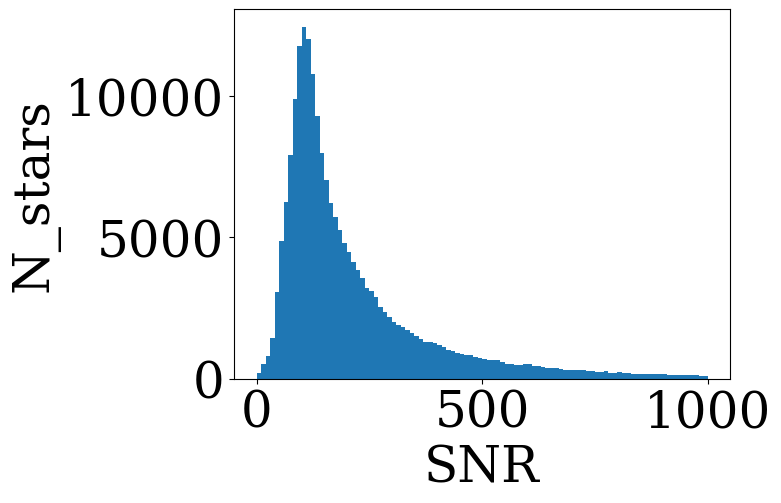

Min: 4.858326435089111
Median: 153.44985961914062
Max: 2829.608154296875
6049 stars (3%) stars with S/N < 50


In [8]:
# Signal to Noise
plt.hist(allstar['SNR'][data_mask],range=(0,1000),bins=100)
plt.xlabel('SNR')
plt.ylabel('N_stars')
plt.show()

print(f"Min: {np.min(allstar['SNR'][data_mask])}")
print(f"Median: {np.median(allstar['SNR'][data_mask])}")
print(f"Max: {np.max(allstar['SNR'][data_mask])}")

x = len(allstar['SNR'][data_mask][allstar['SNR'][data_mask]<50])
print(f"{x} stars ({round(100*x/N_stars)}%) stars with S/N < 50") 

# Figure 2: [M/H]-[$\alpha$/M] split

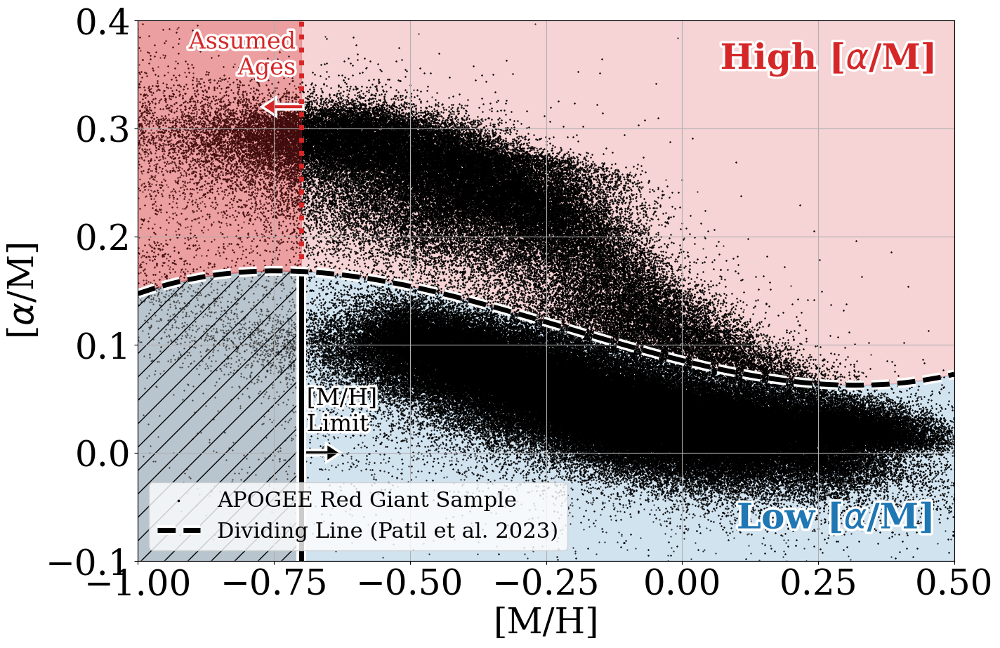

<Figure size 640x480 with 0 Axes>

In [9]:
plt.figure(figsize=(15,10))

f = np.linspace(-1,0.5)
halphaline = np.array([sample_selection.alpha_line_patil2023(i) for i in f])

plt.fill_between(f, np.ones(len(f))*-0.1, halphaline,color='tab:blue',alpha=0.2)
plt.fill_between(f, halphaline, np.ones(len(f))*4,color='tab:red',alpha=0.2)
#plt.fill_between(f, halphaline-0.025,halphaline+0.025,color='k',alpha=0.3)

tmp_m = (allstar['LOGG']<=logg_max_lim)&(allstar['LOGG']>=logg_min_lim)
tmp_m = tmp_m&(allstar['EXTRATARG'] == 0)
tmp_m = tmp_m&(allstar['ALPHA_M']>=-1.0)&(allstar['TEFF']<=5500)
tmp_m = tmp_m&((allstar['ASPCAPFLAG']&(2**23)) == 0) #STAR_BAD

plt.scatter(allstar['M_H'][tmp_m],allstar['ALPHA_M'][tmp_m],
            s=1,marker='.',c='k')

plt.scatter(allstar['M_H'][data_mask],allstar['ALPHA_M'][data_mask],
            s=1,marker='.',c='k')
plt.scatter([-10],[0],
            s=10,marker='.',c='k',label='APOGEE Red Giant Sample')
plt.xlim(-1.0,0.5)
plt.ylim(-0.1,0.4)

#plt.plot(f,halphaline+0.025,c='tab:red',lw=5)
#plt.plot(f,halphaline-0.025,c='tab:blue',lw=5)


#plt.colorbar()
plt.grid()
plt.xlabel('[M/H]',fontsize=36)
plt.ylabel(r'[$\alpha$/M]',fontsize=36)
txt1=plt.text(0.07,0.355, r'High [$\alpha$/M]',weight='bold',color='tab:red',fontsize=36)
txt1.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])
txt2=plt.text(0.1,-0.07, r'Low [$\alpha$/M]',weight='bold',color='tab:blue',fontsize=36)
txt2.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])

#metallicity limit
min_feh = np.min(allstar['M_H'][data_mask][low_alpha_mask])
plt.plot([min_feh, min_feh], [-0.1, sample_selection.alpha_line_patil2023(min_feh)],color='k',lw=5,
         path_effects=[PathEffects.withStroke(linewidth=10, foreground='w')])
plt.arrow(min_feh, 0, 0.05, 0, lw=7,color='w',head_width=0.01)
plt.arrow(min_feh, 0, 0.05, 0, lw=2,color='k',head_width=0.01)
txt1=plt.text(min_feh+0.01,0.02, '[M/H] \nLimit',color='k',fontsize=24)
txt1.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])

x = np.linspace(-1,min_feh,10)
plt.fill_between(x, np.ones(len(x))*-0.1,
                 sample_selection.alpha_line_patil2023(x),hatch='/',facecolor='gray', alpha=0.3)


# alpha age assumptions
plt.plot([min_feh, min_feh], [sample_selection.alpha_line_patil2023(min_feh),0.4], ':', color='tab:red',lw=5)
txt1=plt.text(min_feh-0.01,0.39, 'Assumed\nAges',color='tab:red',fontsize=24, ha='right',va='top')
txt1.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])
x = np.linspace(-1,min_feh,10)
plt.fill_between(x, sample_selection.alpha_line_patil2023(x), np.ones(len(x))*0.5, color='tab:red', alpha=0.3)
plt.arrow(min_feh, 0.32, -0.05, 0, lw=7,color='w',head_width=0.01)
plt.arrow(min_feh, 0.32, -0.05, 0, lw=2,color='tab:red',head_width=0.01)



plt.plot(f,halphaline,'--',c='k',lw=5,
         path_effects=[PathEffects.withStroke(linewidth=10, foreground='w')], label='Dividing Line (Patil et al. 2023)')


#plt.scatter(apogee_sample['M_H'][high_alpha_mask], apogee_sample['ALPHA_M'][high_alpha_mask],
#           c='tab:red')
#
#plt.scatter(apogee_sample['M_H'][low_alpha_mask], apogee_sample['ALPHA_M'][low_alpha_mask],
#           c='tab:blue')


#plt.axvspan(-1,min_feh,hatch='/',alpha=0.0)
plt.legend(loc='lower left',fontsize=22)
plt.savefig(figure_directory + 'alpha_cuts.png', bbox_inches='tight')
plt.show()
plt.clf()

# Figure 3: Stellar Population Bins Star Counts

In [10]:
ncount_distmass_HIGH=np.zeros((len(age_bins["center"]),len(mh_bins["center"])))
ncount_distmass_LOW=np.zeros((len(age_bins["center"]),len(mh_bins["center"])))

tot = len(age_bins["center"])*len(mh_bins["center"])

cnter=0
for i in range(len(age_bins["center"])):
    for j in range(len(mh_bins["center"])):
        bin_mask = (apogee_sample['AGE_BIN_I'] == i)&(apogee_sample['METAL_BIN_I'] == j)
        low_bmask = bin_mask&(apogee_sample['ALPHA_BIN']=='LOW')
        high_bmask = bin_mask&(apogee_sample['ALPHA_BIN']=='HIGH')
        ncount_distmass_LOW[i,j] = len(low_bmask[low_bmask])
        ncount_distmass_HIGH[i,j] = len(high_bmask[high_bmask])
        
        cnter+=1
        #print('{}/{}'.format(cnter,tot))

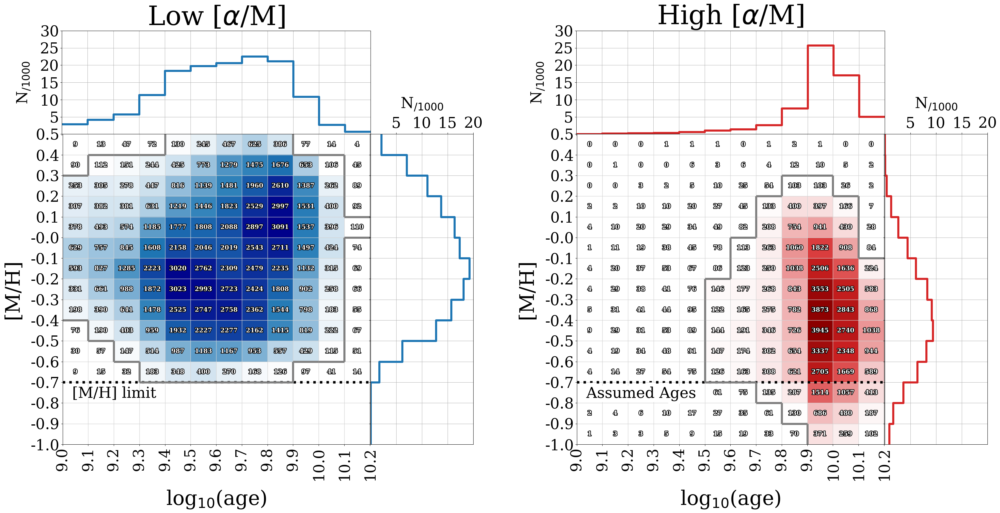

203197.0


In [11]:
plotting_helpers.bin_count_plot_histo(ncount_distmass_LOW,ncount_distmass_HIGH,
                                      savename = figure_directory + 'bincounts.png')

print(np.sum(ncount_distmass_LOW)+np.sum(ncount_distmass_HIGH))

# Selection Function Plots

In [12]:
# ===========================
# Define File Paths
# ===========================
# Effective Selection Function
effsel_name= 'data/selfuncs/effsel_allbins.npz'
# Raw Selection Function
rawsel = 'data/selfuncs/apogeeCombinedSF.dat'

# ===========================
# Load them in
# ===========================
effsel = np.load(effsel_name)['arr_0']

with open(rawsel, 'rb') as f:
    rawsel = pickle.load(f)

In [13]:
#EFFSEL COORDS
ndistmods, distances, distmods, minmax_distmods = sample_selection.distmod_bins()

effsel_glons = np.array([rawsel.glonGlat(x)[0][0] for x in rawsel._locations])
effsel_glats = np.array([rawsel.glonGlat(x)[1][0] for x in rawsel._locations])
distbins = distances*1000

effsel_lons = []
effsel_lats = []
effsel_dist = []

for loc_i in range(len(rawsel._locations)):
    for dist_i in range(len(distbins)):
        effsel_lons.append(effsel_glons[loc_i])
        effsel_lats.append(effsel_glats[loc_i])
        effsel_dist.append(distbins[dist_i])
        
effsel_lons = np.array(effsel_lons)
effsel_lats = np.array(effsel_lats)
effsel_dist = np.array(effsel_dist)

effsel_coords = coord.SkyCoord(l=effsel_lons * u.degree, 
                               b=effsel_lats * u.degree, 
                               distance=effsel_dist * u.pc, frame='galactic')

effsel_coords = effsel_coords.transform_to(coord.Galactocentric)

effsel_xs = effsel_coords.x/1000/u.pc
effsel_ys = effsel_coords.y/1000/u.pc
effsel_zs = effsel_coords.z/1000/u.pc
effsel_rs = np.sqrt((effsel_xs**2.0)+(effsel_ys**2.0))

In [14]:
mainsample_locations = set(allstar['LOCATION_ID'][allstar['EXTRATARG'] == 0])

In [15]:
#Make this one prettier!!!

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/4247606839.py:40: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax1.scatter([0],[0],marker='+',c='w',zorder=11,s=300,edgecolor='w',label='GC',lw=5,snap=False)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/4247606839.py:41: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax1.scatter([0],[0],marker='+',c='k',zorder=12,s=200,edgecolor='w',label='GC',lw=2,snap=False)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/4247606839.py:63: RuntimeWarning: divide by zero encountered in log10
  c=np.log10(plot_cs[idx]), vmin=-7,vmax=-1,

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: Us

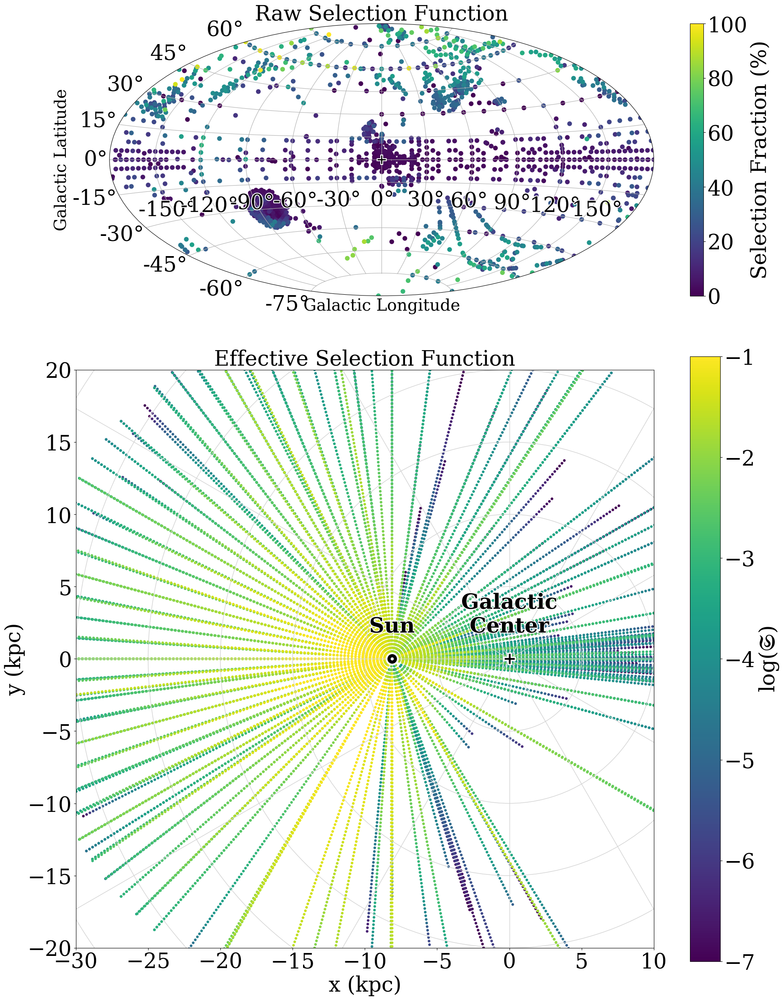

In [16]:
plt.figure(figsize=(20,25))
ax1 = plt.subplot2grid((3,1), (0,0),projection='aitoff',rowspan=1)
ax2 = plt.subplot2grid((3,1), (1,0),rowspan=2)

rawsel_colors = (rawsel._nspec_short/rawsel._nphot_short).T[0]*100

diskmask = []
for loc in rawsel._locations:
    diskmask.append(loc in mainsample_locations)
    #diskmask.append(True)
diskmask = np.array(diskmask)

idx = np.argsort(rawsel_colors)

diskmask=diskmask[idx]
lat = []
for f in effsel_glons[idx][diskmask]:
    if f <=180:
        lat.append(f)
    else:
        lat.append(f-360)

im=ax1.scatter(np.deg2rad(lat),np.deg2rad(effsel_glats[idx][diskmask]),
            c=rawsel_colors[idx][diskmask],vmin=0,vmax=100,cmap='viridis',
            s=50)

tick_values = np.deg2rad(np.arange(-150,180,30))
ax1.set_xticks(tick_values)
ax1.set_xticklabels(['' for i in tick_values])
for lon in np.arange(-150,180,30):
    tx = ax1.text(np.deg2rad(lon), np.deg2rad(-20), str(lon)+r'$\degree$',
                  color='k',ha='center',va='top',fontsize=36)
    tx.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])
    
cbar = plt.colorbar(im,ax=ax1,label='Selection Fraction (%)')#,orientation='horizontal')
ax1.set_title('Raw Selection Function', fontsize=36)
ax1.grid()
#plt.xlim(0,360)
#plt.ylim(-90,90)
ax1.scatter([0],[0],marker='+',c='w',zorder=11,s=300,edgecolor='w',label='GC',lw=5,snap=False)
ax1.scatter([0],[0],marker='+',c='k',zorder=12,s=200,edgecolor='w',label='GC',lw=2,snap=False)
 
ax1.set_xlabel('Galactic Longitude',fontsize=28)
ax1.set_ylabel('Galactic Latitude',fontsize=28)

ydeg = np.arange(-75,76,15)
ax1.set_yticks(np.deg2rad(ydeg))
ydeg_labels = [str(y)+r'$\degree$' for y in ydeg]
ydeg_labels[-1] = ''
ax1.set_yticklabels(ydeg_labels)


#================
#Eff
diskmap = (np.abs(effsel_lats) <= 5)
#diskmap = (np.abs(effsel_zs) <= 10)

plot_xs = effsel_xs[diskmap]
plot_ys = effsel_ys[diskmap]
plot_cs = effsel[75].flatten()[diskmap]
idx = np.argsort(plot_cs)
im=ax2.scatter(plot_xs[idx],plot_ys[idx],
            c=np.log10(plot_cs[idx]), vmin=-7,vmax=-1,
            s=50, #vmin=0,vmax=0.1,
            marker='.', cmap='viridis')

plt.colorbar(im,ax=ax2,label=r'log($\mathfrak{S}$)')
ax2.set_ylim(-20,20)
ax2.set_xlim(-30,10)
#ax2.grid()
for r in np.arange(0,50,5):
        radcircle = plt.Circle((0, 0), r, facecolor='None',edgecolor='lightgray')
        ax2.add_patch(radcircle)
        
for m in np.arange(0,180,30):
        linx = np.linspace(-50,50,100)
        ax2.plot(linx,np.tan(np.deg2rad(m))*linx,c='lightgray')
        
ax2.set_xlabel('x (kpc)')
ax2.set_ylabel('y (kpc)')
ax2.set_aspect('equal')
plotting_helpers.plot_sun_and_GC(ax=ax2,size=1.5)
ax2.set_title('Effective Selection Function', fontsize=36)


plt.tight_layout()
plt.savefig(figure_directory + 'selection_func.png', bbox_inches='tight')
plt.show()

## 3B: Density Profile Results

In [17]:
density_params = Table.read(param_results)

/Users/jimig/anaconda3/lib/python3.10/site-packages/astropy/units/core.py:2123: UnitsWarning: 'log10(yr)' did not parse as fits unit: At col 0, Unit 'log' not supported by the FITS standard.  If this is meant to be a custom unit, define it with 'u.def_unit'. To have it recognized inside a file reader or other code, enable it with 'u.add_enabled_units'. For details, see https://docs.astropy.org/en/latest/units/combining_and_defining.html
  warnings.warn(msg, UnitsWarning)



[-0.056863249428552455, 1.4652477225708347, 0.18529749974252774, 8.493877639088574, 0.016603891109888635, -1.723271425116509]
/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:683: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()



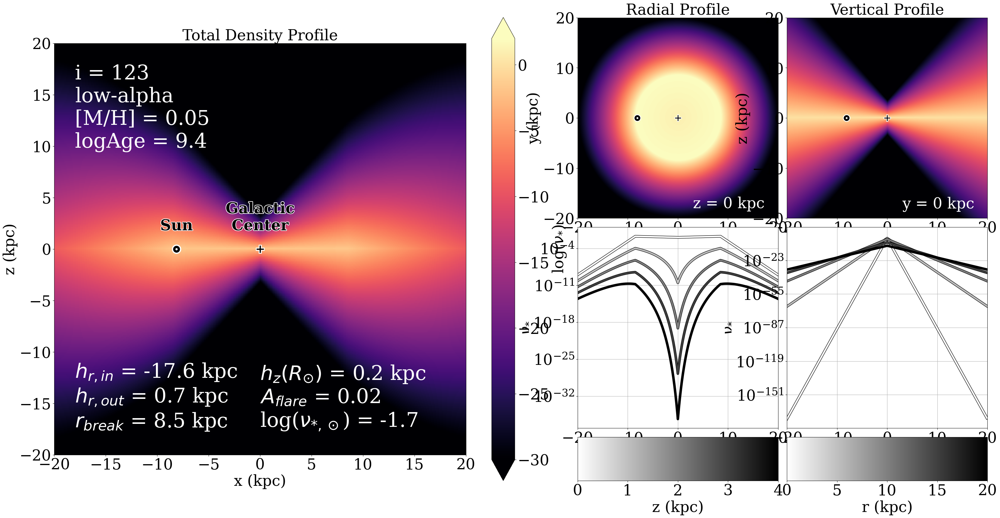

In [18]:
rand_i = 123
#print(density_params[rand_i])

ex_params = [1/density_params['HR_IN'][rand_i],
             1/density_params['HR_OUT'][rand_i],
             density_params['H_Z'][rand_i], 
             density_params['R_BREAK'][rand_i], 
             density_params['A_FLARE'][rand_i],
             density_params['NU_0'][rand_i]]

ex_params = [float(x) for x in ex_params]

bin_title = f"i = {rand_i}\n{density_params['ALPHA_M'][rand_i]}-alpha\n[M/H] = {density_params['M_H'][rand_i]}\nlogAge = {density_params['LOG_AGE'][rand_i]}"
print(ex_params)
plotting_helpers.plot_model_from_params_EX(combined_exp_profile_nonsmoothed_linear,
                          ex_params,savename = figure_directory + f'model_bin{rand_i}.png',
                          annotate = False,bin_title=bin_title)

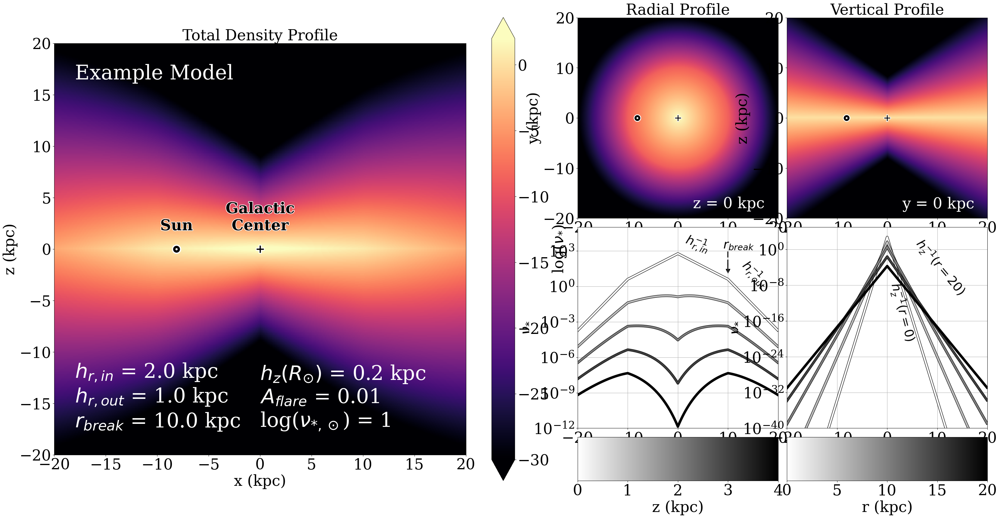

In [19]:
# Make prettier too!!!
ex_params = [0.5, 1.0, 0.2, 10.0, 0.01, 1]
plotting_helpers.plot_model_from_params_EX(combined_exp_profile_nonsmoothed_linear,
                          ex_params,savename = figure_directory + 'model_examp.png')

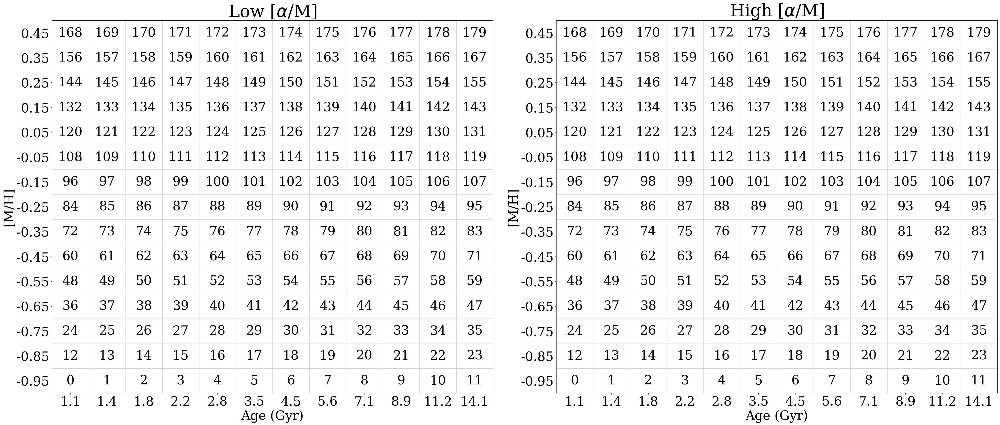

In [20]:
#bin number Legend (for ref/inspection)
for i in range(1):
    plt.figure(figsize=(40,20))
    #ax1c = plt.subplot2grid((6, 2), (0, 0), colspan=2) #cax
    ax1a = plt.subplot2grid((6, 2), (1, 0), rowspan=5) #high alph
    ax1b = plt.subplot2grid((6, 2), (1, 1), rowspan=5) #low alph
    
    ax1a.set_title(r'Low [$\alpha$/M]',fontsize=48)
    ax1b.set_title(r'High [$\alpha$/M]',fontsize=48)
    #ax1c.set_title(labels[i],fontsize=48)

    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins['center'])))
        ax.set_yticks(np.arange(len(mh_bins['center'])))
        ax.set_xticklabels([round(a,1) for a in age_bins['center']])
        ax.set_yticklabels([round(a,2) for a in mh_bins['center']])
        ax.set_ylim(-0.5,len(mh_bins['max'])-0.5)
        ax.set_xlim(-0.5,len(age_bins['max'])-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i in range(len(age_bins['center'])):
            ax.axvline(i-0.5,c='lightgray')
            ax.axhline(i-0.5,c='lightgray')
            
        bc=0
        for i_f,f in enumerate(mh_bins['center']):
            for i_a,a in enumerate(age_bins['center']):
                ax.text(i_a,i_f,bc,fontsize=36,horizontalalignment='center', verticalalignment='center')
                bc+=1
    plt.tight_layout()
    plt.show()

In [21]:
table_to_matrix_index_low = []
table_to_matrix_index_high = []

for a in age_bins['center']:
    for f in mh_bins['center']:
        i = np.where((density_params['ALPHA_M']=='low')&
                 (density_params['M_H']==np.round(f,2))&
                 (density_params['AGE']==np.round(a,2)))[0][0]
        table_to_matrix_index_low.append(i)
        j = np.where((density_params['ALPHA_M']=='high')&
                 (density_params['M_H']==np.round(f,2))&
                 (density_params['AGE']==np.round(a,2)))[0][0]
        table_to_matrix_index_high.append(j)
        
table_to_matrix_index_low = np.array(table_to_matrix_index_low)
table_to_matrix_index_high = np.array(table_to_matrix_index_high)
        

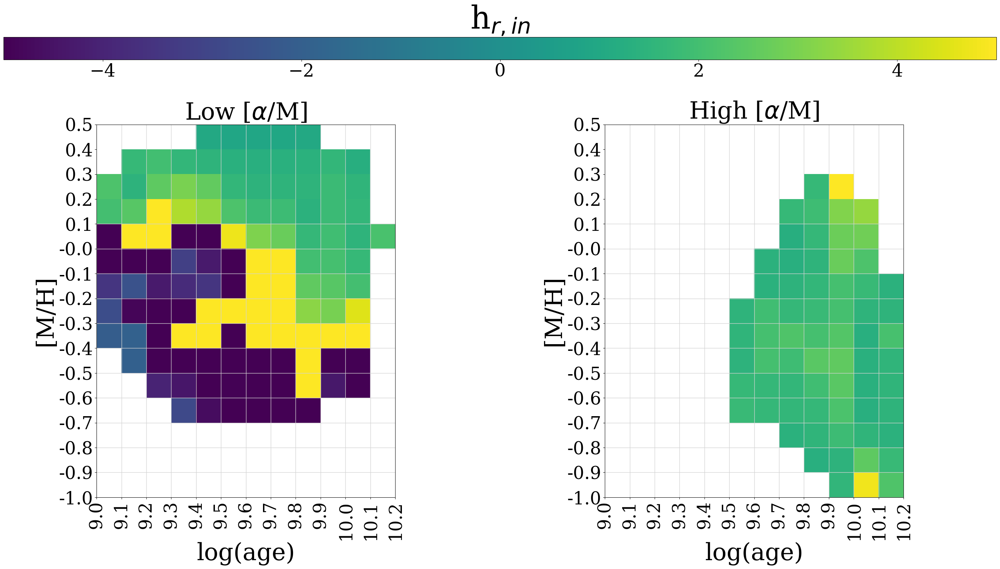

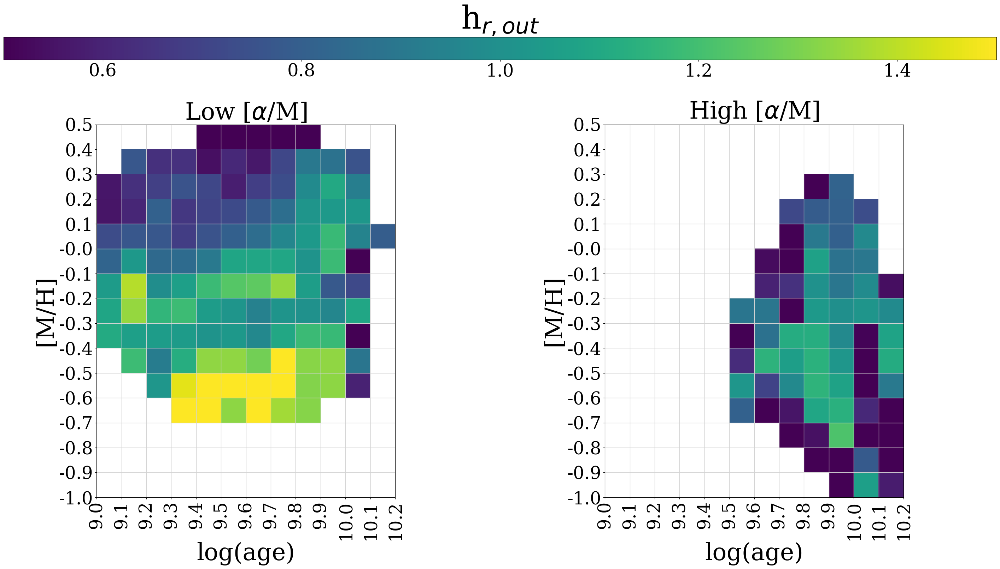

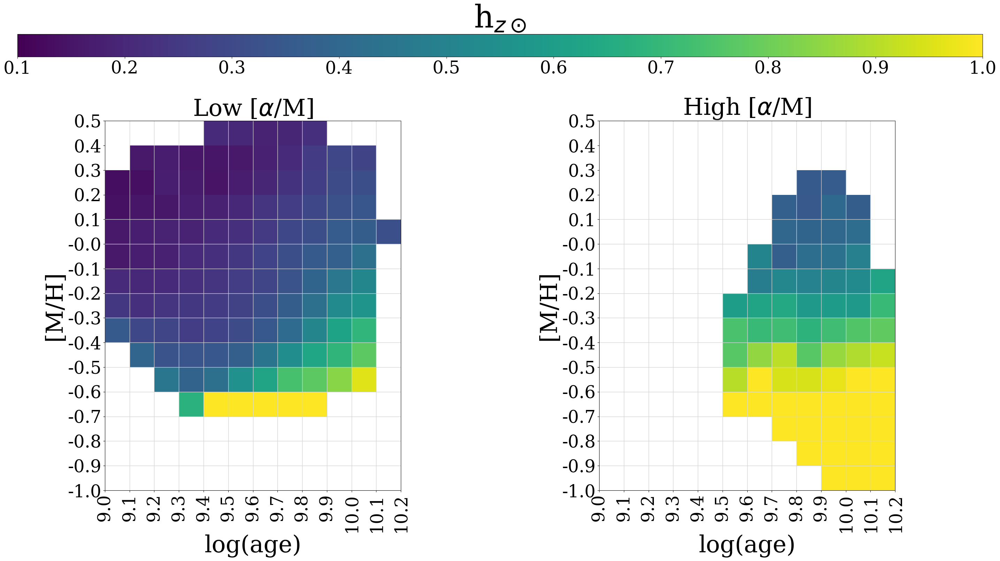

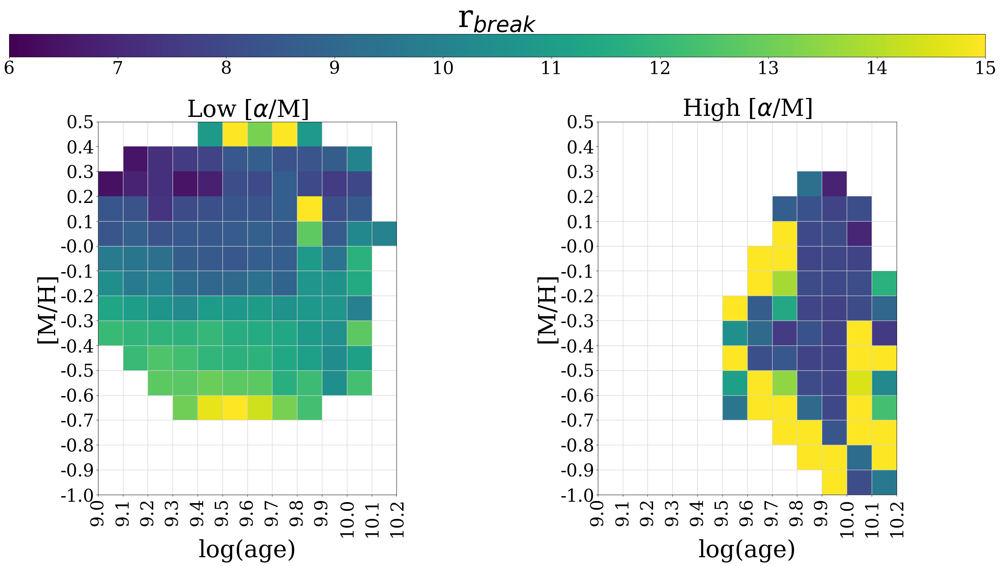

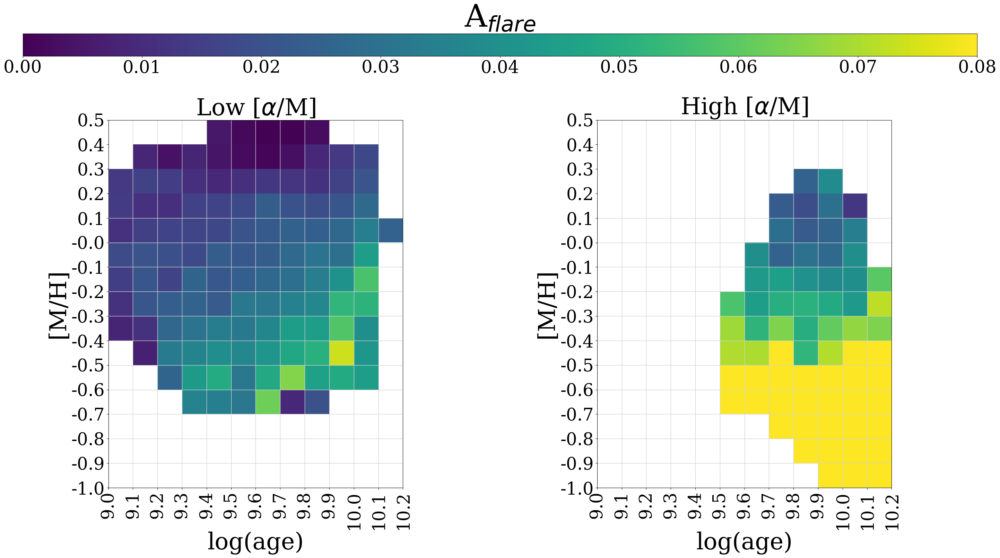

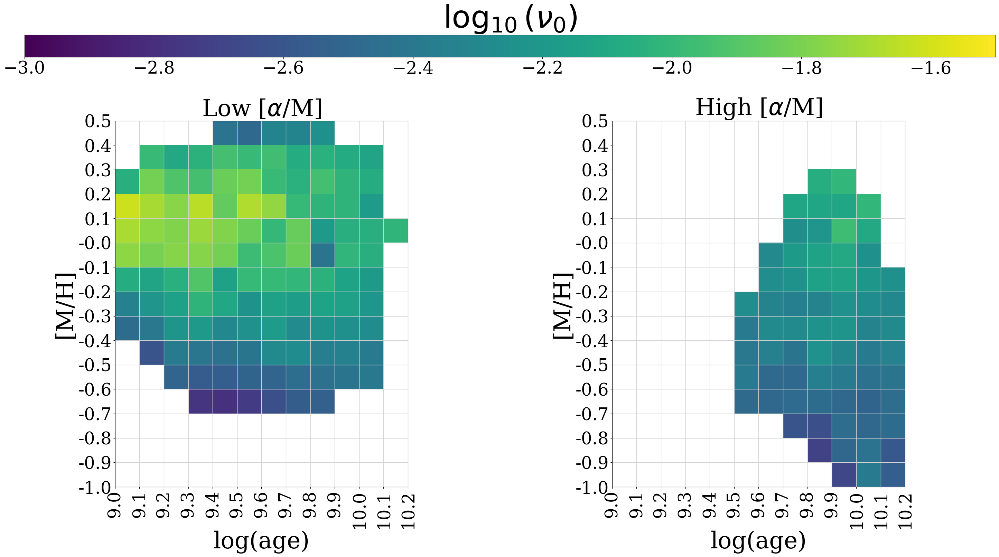

In [22]:
#max results
column_names = [r'HR_IN', r'HR_OUT',r'H_Z', r'R_BREAK',r'A_FLARE',r'NU_0']
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z\odot}$', r'r$_{break}$',r'A$_{flare}$',r'$\log_{10}(\nu_0)$']
lims = [[-5,5],[0.5,1.5],[0.1,1.0],[6,15],[0,0.08],[-3,-1.5]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]

for i in range(6):
    param_array_low = density_params[column_names[i]][table_to_matrix_index_low]
    param_array_low = np.array(param_array_low.reshape((len(age_bins['center']),len(mh_bins['center'])))).T
    param_array_high = density_params[column_names[i]][table_to_matrix_index_high]
    param_array_high = np.array(param_array_high.reshape((len(age_bins['center']),len(mh_bins['center'])))).T
    
    ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()
    ax1c.set_title(labels[i],fontsize=64)
    if i in [0,1]:
        im1=ax1a.imshow(param_array_low,origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
        im2=ax1b.imshow(param_array_high,origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])
        
    else:
        im1=ax1a.imshow(param_array_low,origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
        im2=ax1b.imshow(param_array_high,origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])

    plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    
    plt.tight_layout()
    
    plt.savefig(figure_directory + 'param{}.png'.format(i),bbox_inches='tight')
    plt.show()

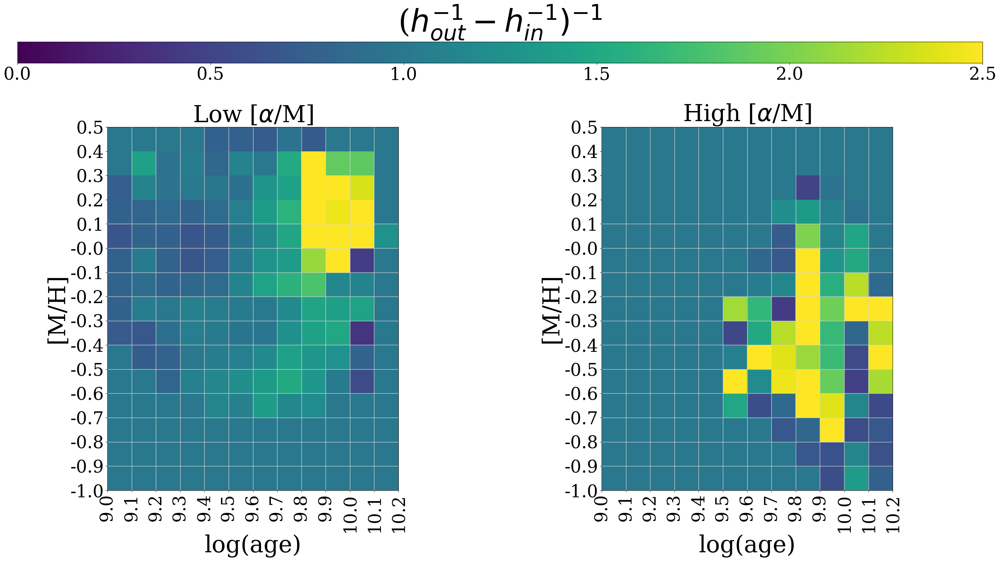

In [23]:
#peakiness plot

tmi = table_to_matrix_index_low
param_array_low = (1.0/density_params['HR_OUT'][tmi]) - (1.0/density_params['HR_IN'][tmi])
param_array_low = 1.0/np.array(param_array_low.reshape((len(age_bins['center']),len(mh_bins['center'])))).T
tmi = table_to_matrix_index_high
param_array_high = (1.0/density_params['HR_OUT'][tmi]) - (1.0/density_params['HR_IN'][tmi])
param_array_high = 1.0/np.array(param_array_high.reshape((len(age_bins['center']),len(mh_bins['center'])))).T
    
    
peakiness = [param_array_low,param_array_high]
ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()


im1=ax1a.imshow(peakiness[0],origin='lower',
              vmin=0,vmax=2.5)
im2=ax1b.imshow(peakiness[1],origin='lower',
               vmin=0,vmax=2.5)

ax1c.set_title(r'($h_{out}^{-1} - h_{in}^{-1})^{-1}$',fontsize=64)

cbar=plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    
plt.tight_layout()
plt.savefig(figure_directory + 'paramPeak.png', bbox_inches = 'tight')
plt.show()

#big number = no change / single exponential
#small number = big diff / sharp peak


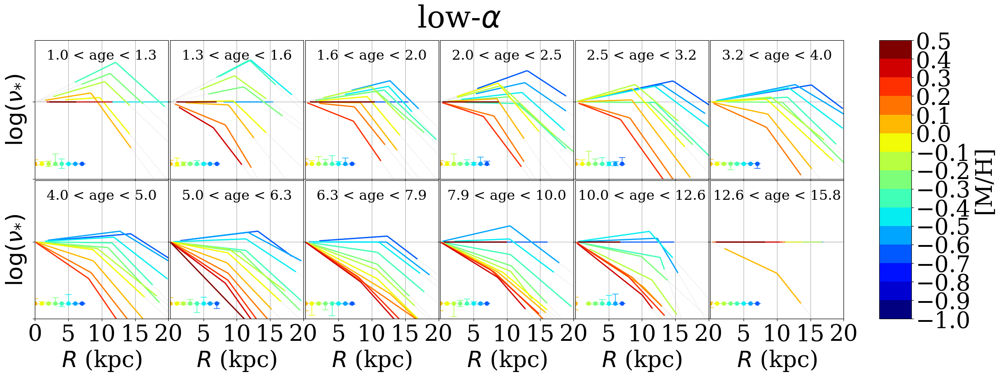

In [24]:
plt.figure(figsize=(25,8))
r_plots = np.linspace(0,20,100)
metal_colors = mpl.cm.jet(np.linspace(0,0.999,len(mh_bins['center'])))

ratio = 4
subplots = []
for i in range(len(age_bins['center'])):
    if i < 6:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(0,ratio*i),colspan=ratio,rowspan=1))
    elif i < 12:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(1,ratio*(i-6)),colspan=ratio,rowspan=1))
    
cax = plt.subplot2grid((2,6*ratio+2), (0, 6*ratio+1),rowspan=2)


for i_a in range(len(age_bins['center'])):
    ax = subplots[i_a]
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        low_Rs = np.abs(data_rs[data_binmask&(apogee_sample['ALPHA_BIN']=='LOW')])
        
        table_i = (density_params['ALPHA_M']=='low')&(
            density_params['M_H']==round(mh_bins['center'][i_f],2))&(
        density_params['AGE']==round(age_bins['center'][i_a],2))
        table_i = np.where(table_i)[0][0]
        #print(table_i)
        
        if len(low_Rs)>0:
            h1 = density_params['HR_IN'][table_i]
            h2 = density_params['HR_OUT'][table_i]
            rp = density_params['R_BREAK'][table_i]
            profile = radial_broken_exp(1.0/h1,1.0/h2,rp,r_plots)
            #p0 = radial_broken_exp(h1,h2,rp,[8.3])#profile[0]
            p0 = profile[0]
            profile = np.log10((profile/p0))
            mask = (r_plots >= np.min(low_Rs))&(r_plots <= np.max(low_Rs))
            #if (np.max(profile) <= 1.0e4)&(np.min(profile)>= 1e-10):
            if (np.max(profile) <= 4)&(np.min(profile)>= -10):
                ax.plot(r_plots,profile,c='lightgray',linestyle=':')
                ax.plot(r_plots[mask],profile[mask],c=metal_colors[i_f],lw=2)
                uph1 = density_params['HR_IN_ERR'][table_i][0]
                dnh1 = density_params['HR_IN_ERR'][table_i][1]
                uph2 = density_params['HR_OUT_ERR'][table_i][0]
                dnh2 = density_params['HR_OUT_ERR'][table_i][1]
                uprp = density_params['R_BREAK_ERR'][table_i][0]
                dnrp = density_params['R_BREAK_ERR'][table_i][1]
                upprofile = radial_broken_exp(1.0/(h1+uph1),1.0/(h2+uph2),rp+uprp,r_plots)
                dnprofile = radial_broken_exp(1.0/(h1-dnh1),1.0/(h2-dnh2),rp-dnrp,r_plots)
                upprofile = np.log10(upprofile/upprofile[0])
                dnprofile = np.log10(dnprofile/dnprofile[0])
                er_i = 10
                
                uper = np.abs(upprofile[er_i]-profile[er_i])
                dner = np.abs(profile[er_i]-dnprofile[er_i])
                yerr= [[dner],[uper]]                    
                ax.errorbar(10-i_f,-4,yerr=yerr/np.sqrt(2),
                            color=metal_colors[i_f],capsize=5,marker='o')
                #ax.fill_between(r_plots,dnprofile,upprofile, color=metal_colors[i_f],alpha=0.2)
                
                
    ax.text(10,np.log10(1000),'{} < age < {}'.format(round(age_bins['min'][i_a],1),round(age_bins['max'][i_a],1)),
           ha='center',va='center',fontsize=22)
    #ax.set_yscale('log')
    
    if i_a%6 == 0:
        ax.set_ylabel(r'$\log(\nu_{*})$')
    if i_a >= 6:
        ax.set_xlabel(r'$R$ (kpc)')

    ax.set_yticklabels([])
    ax.set_xlim(0,20)
    #ax.set_ylim(1e-5,1e3)
    ax.set_ylim(-5,4)
    if i_a == 6:
        ax.set_xticks(np.arange(0,21,5))

    else:
        ax.set_xticks(np.arange(5,21,5))
    ax.grid()

    if i_a < 6:
        ax.set_xticklabels([])       


im=ax.scatter(np.ones(len(mh_bins['center']))*-1,np.ones(len(mh_bins['center']))*-1,c=mh_bins['center'],cmap='jet')
#plt.colorbar(im,cax=cax,label='[M/H]')
plt.colorbar(im,cax=cax,label='[M/H]',spacing='proportional',ticks=np.append(mh_bins['min'],[mh_bins['max'][-1]]),
             boundaries=np.append(mh_bins['min'],[mh_bins['max'][-1]]))

plt.subplots_adjust(hspace=0.01,wspace=0.05)
plt.suptitle(r'low-$\alpha$',fontsize=48)
plt.savefig(figure_directory + 'radial_profiles_square_LOW.png',bbox_inches='tight')
plt.show()

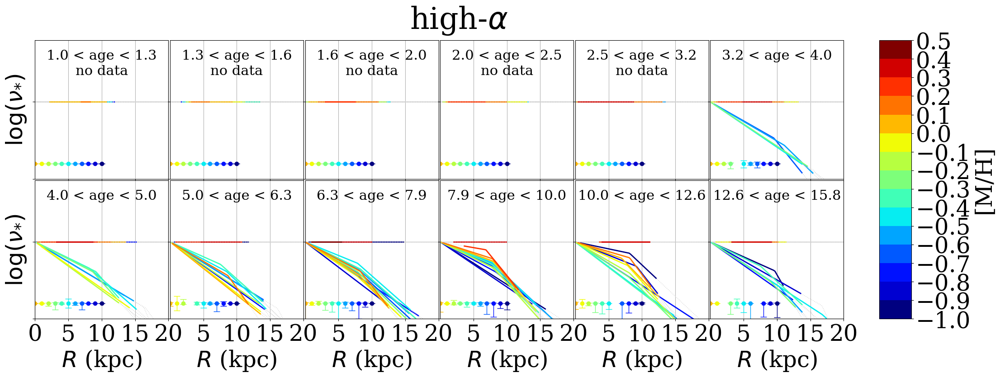

In [25]:
plt.figure(figsize=(25,8))
r_plots = np.linspace(0,20,100)
metal_colors = mpl.cm.jet(np.linspace(0,0.999,len(mh_bins['center'])))

ratio = 4
subplots = []
for i in range(len(age_bins['center'])):
    if i < 6:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(0,ratio*i),colspan=ratio,rowspan=1))
    elif i < 12:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(1,ratio*(i-6)),colspan=ratio,rowspan=1))
    
cax = plt.subplot2grid((2,6*ratio+2), (0, 6*ratio+1),rowspan=2)


for i_a in range(len(age_bins['center'])):
    ax = subplots[i_a]
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        low_Rs = np.abs(data_rs[data_binmask&(apogee_sample['ALPHA_BIN']=='HIGH')])
        
        table_i = (density_params['ALPHA_M']=='high')&(
            density_params['M_H']==round(mh_bins['center'][i_f],2))&(
        density_params['AGE']==round(age_bins['center'][i_a],2))
        table_i = np.where(table_i)[0][0]
        #print(table_i)
        
        if len(low_Rs)>0:
            h1 = density_params['HR_IN'][table_i]
            h2 = density_params['HR_OUT'][table_i]
            rp = density_params['R_BREAK'][table_i]
            profile = radial_broken_exp(1.0/h1,1.0/h2,rp,r_plots)
            #p0 = radial_broken_exp(h1,h2,rp,[8.3])#profile[0]
            p0 = profile[0]
            profile = np.log10((profile/p0))
            mask = (r_plots >= np.min(low_Rs))&(r_plots <= np.max(low_Rs))
            #if (np.max(profile) <= 1.0e4)&(np.min(profile)>= 1e-10):
            if (np.max(profile) <= 4)&(np.min(profile)>= -10):
                ax.plot(r_plots,profile,c='lightgray',linestyle=':')
                ax.plot(r_plots[mask],profile[mask],c=metal_colors[i_f],lw=2)
                uph1 = density_params['HR_IN_ERR'][table_i][0]
                dnh1 = density_params['HR_IN_ERR'][table_i][1]
                uph2 = density_params['HR_OUT_ERR'][table_i][0]
                dnh2 = density_params['HR_OUT_ERR'][table_i][1]
                uprp = density_params['R_BREAK_ERR'][table_i][0]
                dnrp = density_params['R_BREAK_ERR'][table_i][1]
                upprofile = radial_broken_exp(1.0/(h1+uph1),1.0/(h2+uph2),rp+uprp,r_plots)
                dnprofile = radial_broken_exp(1.0/(h1-dnh1),1.0/(h2-dnh2),rp-dnrp,r_plots)
                upprofile = np.log10(upprofile/upprofile[0])
                dnprofile = np.log10(dnprofile/dnprofile[0])
                er_i = 10
                
                uper = np.abs(upprofile[er_i]-profile[er_i])
                dner = np.abs(profile[er_i]-dnprofile[er_i])
                yerr= [[dner],[uper]]                    
                ax.errorbar(10-i_f,-4,yerr=yerr/np.sqrt(2),
                            color=metal_colors[i_f],capsize=5,marker='o')
                #ax.fill_between(r_plots,dnprofile,upprofile, color=metal_colors[i_f],alpha=0.2)
                
                
    ax.text(10,np.log10(1000),'{} < age < {}'.format(round(age_bins['min'][i_a],1),round(age_bins['max'][i_a],1)),
           ha='center',va='center',fontsize=22)
    #ax.set_yscale('log')
    
    if i_a%6 == 0:
        ax.set_ylabel(r'$\log(\nu_{*})$')
    if i_a >= 6:
        ax.set_xlabel(r'$R$ (kpc)')

    ax.set_yticklabels([])
    ax.set_xlim(0,20)
    #ax.set_ylim(1e-5,1e3)
    ax.set_ylim(-5,4)
    if i_a == 6:
        ax.set_xticks(np.arange(0,21,5))

    else:
        ax.set_xticks(np.arange(5,21,5))
    ax.grid()

    if i_a < 6:
        ax.set_xticklabels([])   
    if i_a <5:
        ax.text(10,np.log10(100),'no data',
           ha='center',va='center',fontsize=22)


im=ax.scatter(np.ones(len(mh_bins['center']))*-1,np.ones(len(mh_bins['center']))*-1,c=mh_bins['center'],cmap='jet')
#plt.colorbar(im,cax=cax,label='[M/H]')
plt.colorbar(im,cax=cax,label='[M/H]',spacing='proportional',ticks=np.append(mh_bins['min'],[mh_bins['max'][-1]]),
             boundaries=np.append(mh_bins['min'],[mh_bins['max'][-1]]))

plt.subplots_adjust(hspace=0.01,wspace=0.05)
plt.suptitle(r'high-$\alpha$',fontsize=48)
plt.savefig(figure_directory + 'radial_profiles_square_HIGH.png',bbox_inches='tight')
plt.show()

/Users/jimig/anaconda3/lib/python3.10/site-packages/matplotlib/cbook.py:1762: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)

/Users/jimig/anaconda3/lib/python3.10/site-packages/numpy/ma/core.py:3387: UserWarning: Warning: converting a masked element to nan.
  _data[indx] = dval

/Users/jimig/anaconda3/lib/python3.10/site-packages/matplotlib/cbook.py:1398: UserWarning: Warning: converting a masked element to nan.
  return np.asarray(x, float)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/3006174984.py:63: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['',0.5,1,1.5])

/Users/jimig/anaconda3/lib/python3.10/site-packages/matplotlib/cbook.py:1762: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)

/Users/jimig/anaconda3/lib/python3.10/site-packages/numpy/ma/core.py:3387: UserWarning: Warning: co

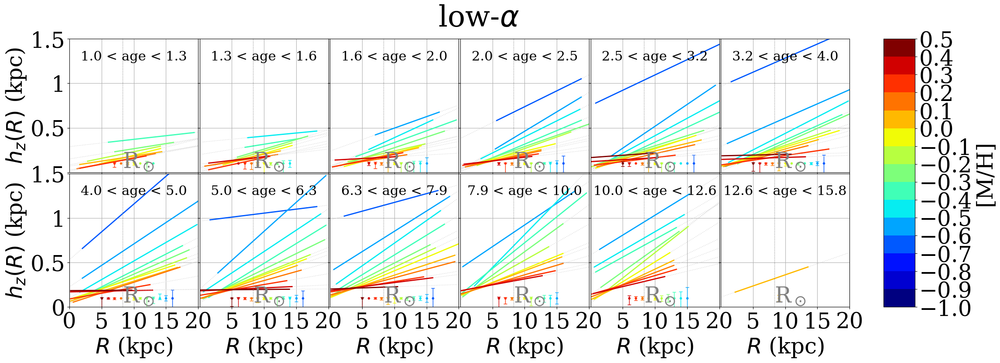

In [26]:
plt.figure(figsize=(25,8))
r_plots = np.linspace(0,20,100)
metal_colors = mpl.cm.jet(np.linspace(0,0.999,len(mh_bins['center'])))

ratio = 4
subplots = []
for i in range(len(age_bins['center'])):
    if i < 6:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(0,ratio*i),colspan=ratio,rowspan=1))
    elif i < 12:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(1,ratio*(i-6)),colspan=ratio,rowspan=1))
    
cax = plt.subplot2grid((2,6*ratio+2), (0, 6*ratio+1),rowspan=2)


for i_a in range(len(age_bins['center'])):
    ax = subplots[i_a]
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        low_Rs = np.abs(data_rs[data_binmask&(apogee_sample['ALPHA_BIN']=='LOW')])
        
        table_i = (density_params['ALPHA_M']=='low')&(
            density_params['M_H']==round(mh_bins['center'][i_f],2))&(
        density_params['AGE']==round(age_bins['center'][i_a],2))
        table_i = np.where(table_i)[0][0]
        #print(table_i)
        
        if len(low_Rs)>0:
            hz = density_params['H_Z'][table_i]
            af = density_params['A_FLARE'][table_i]
            
            temp_rs = np.linspace(0,20,100)
            zprof = af*(temp_rs-8.3)+hz
            mask = (temp_rs >= np.min(low_Rs))&(temp_rs <= np.max(low_Rs))
            ax.plot(temp_rs,zprof,c='lightgray',linestyle=':')
            ax.plot(temp_rs[mask],zprof[mask],c=metal_colors[i_f],lw=2)

            
            up1 = density_params['H_Z_ERR'][table_i][1]
            dn1 = density_params['H_Z_ERR'][table_i][0]
            up2 = density_params['A_FLARE_ERR'][table_i][1]
            dn2 = density_params['A_FLARE_ERR'][table_i][0]
            yerr= [[dn1+dn2],[up1+up2]]  
            if hz<=1.5:
                ax.errorbar(19-i_f,0.1,yerr=yerr,
                            color=metal_colors[i_f],capsize=3,marker='.')
                #ax.fill_between(r_plots,dnprofile,upprofile, color=metal_colors[i_f],alpha=0.2)
                
                
    ax.text(10,1.3,'{} < age < {}'.format(round(age_bins['min'][i_a],1),round(age_bins['max'][i_a],1)),
           ha='center',va='center',fontsize=22)
    #ax.set_yscale('log')
    
    if i_a%6 == 0:
        ax.set_ylabel(r'$h_{z}(R)$ (kpc)')
    if i_a >= 6:
        ax.set_xlabel(r'$R$ (kpc)')

    if (i_a != 6)&(i_a != 0):
        ax.set_yticklabels([])
    if i_a == 0:
        ax.set_yticklabels(['',0.5,1,1.5])
    if i_a == 6:
        ax.set_yticklabels([0,0.5,1,1.5])
        
    ax.set_xlim(0,20)
    #ax.set_ylim(1e-5,1e3)
    ax.set_ylim(0,1.5)
    ax.axvline(8.3,linestyle=':',c='gray')
    ax.text(8.3,0.05,'R$_\odot$',color='gray')
    if i_a == 6:
        ax.set_xticks(np.arange(0,21,5))

    else:
        ax.set_xticks(np.arange(5,21,5))
    ax.grid()

    if i_a < 6:
        ax.set_xticklabels([])       


im=ax.scatter(np.ones(len(mh_bins['center']))*-1,np.ones(len(mh_bins['center']))*-1,c=mh_bins['center'],cmap='jet')
#plt.colorbar(im,cax=cax,label='[M/H]')
plt.colorbar(im,cax=cax,label='[M/H]',spacing='proportional',ticks=np.append(mh_bins['min'],[mh_bins['max'][-1]]),
             boundaries=np.append(mh_bins['min'],[mh_bins['max'][-1]]))

plt.subplots_adjust(hspace=0.01,wspace=0.05)
plt.suptitle(r'low-$\alpha$',fontsize=48)
plt.savefig(figure_directory + 'vertical_profs_low.png',bbox_inches='tight')
plt.show()

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/3374632628.py:63: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['',0.5,1,1.5])

/Users/jimig/anaconda3/lib/python3.10/site-packages/matplotlib/cbook.py:1762: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)

/Users/jimig/anaconda3/lib/python3.10/site-packages/numpy/ma/core.py:3387: UserWarning: Warning: converting a masked element to nan.
  _data[indx] = dval

/Users/jimig/anaconda3/lib/python3.10/site-packages/matplotlib/cbook.py:1398: UserWarning: Warning: converting a masked element to nan.
  return np.asarray(x, float)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/3374632628.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([0,0.5,1,1.5])

/Users/jimig/ana

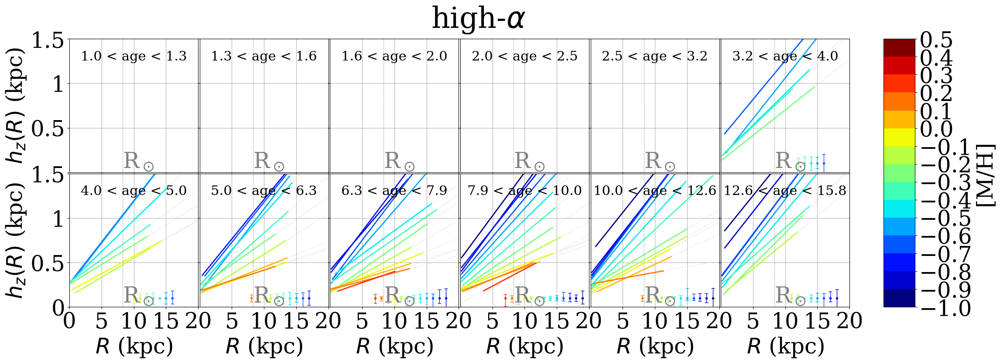

In [27]:
plt.figure(figsize=(25,8))
r_plots = np.linspace(0,20,100)
metal_colors = mpl.cm.jet(np.linspace(0,0.999,len(mh_bins['center'])))

ratio = 4
subplots = []
for i in range(len(age_bins['center'])):
    if i < 6:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(0,ratio*i),colspan=ratio,rowspan=1))
    elif i < 12:
        subplots.append(plt.subplot2grid((2,6*ratio+2),(1,ratio*(i-6)),colspan=ratio,rowspan=1))
    
cax = plt.subplot2grid((2,6*ratio+2), (0, 6*ratio+1),rowspan=2)


for i_a in range(len(age_bins['center'])):
    ax = subplots[i_a]
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        low_Rs = np.abs(data_rs[data_binmask&(apogee_sample['ALPHA_BIN']=='HIGH')])
        
        table_i = (density_params['ALPHA_M']=='high')&(
            density_params['M_H']==round(mh_bins['center'][i_f],2))&(
        density_params['AGE']==round(age_bins['center'][i_a],2))
        table_i = np.where(table_i)[0][0]
        #print(table_i)
        
        if len(low_Rs)>0:
            hz = density_params['H_Z'][table_i]
            af = density_params['A_FLARE'][table_i]
            
            temp_rs = np.linspace(0,20,100)
            zprof = af*(temp_rs-8.3)+hz
            mask = (temp_rs >= np.min(low_Rs))&(temp_rs <= np.max(low_Rs))
            ax.plot(temp_rs,zprof,c='lightgray',linestyle=':')
            ax.plot(temp_rs[mask],zprof[mask],c=metal_colors[i_f],lw=2)

            
            up1 = density_params['H_Z_ERR'][table_i][1]
            dn1 = density_params['H_Z_ERR'][table_i][0]
            up2 = density_params['A_FLARE_ERR'][table_i][1]
            dn2 = density_params['A_FLARE_ERR'][table_i][0]
            yerr= [[dn1+dn2],[up1+up2]]  
            if hz<=1.5:
                ax.errorbar(19-i_f,0.1,yerr=yerr,
                            color=metal_colors[i_f],capsize=3,marker='.')
                #ax.fill_between(r_plots,dnprofile,upprofile, color=metal_colors[i_f],alpha=0.2)
                
                
    ax.text(10,1.3,'{} < age < {}'.format(round(age_bins['min'][i_a],1),round(age_bins['max'][i_a],1)),
           ha='center',va='center',fontsize=22)
    #ax.set_yscale('log')
    
    if i_a%6 == 0:
        ax.set_ylabel(r'$h_{z}(R)$ (kpc)')
    if i_a >= 6:
        ax.set_xlabel(r'$R$ (kpc)')

    if (i_a != 6)&(i_a != 0):
        ax.set_yticklabels([])
    if i_a == 0:
        ax.set_yticklabels(['',0.5,1,1.5])
    if i_a == 6:
        ax.set_yticklabels([0,0.5,1,1.5])
        
    ax.set_xlim(0,20)
    #ax.set_ylim(1e-5,1e3)
    ax.set_ylim(0,1.5)
    ax.axvline(8.3,linestyle=':',c='gray')
    ax.text(8.3,0.05,'R$_\odot$',color='gray')
    if i_a == 6:
        ax.set_xticks(np.arange(0,21,5))

    else:
        ax.set_xticks(np.arange(5,21,5))
    ax.grid()

    if i_a < 6:
        ax.set_xticklabels([])       


im=ax.scatter(np.ones(len(mh_bins['center']))*-1,np.ones(len(mh_bins['center']))*-1,c=mh_bins['center'],cmap='jet')
#plt.colorbar(im,cax=cax,label='[M/H]')
plt.colorbar(im,cax=cax,label='[M/H]',spacing='proportional',ticks=np.append(mh_bins['min'],[mh_bins['max'][-1]]),
             boundaries=np.append(mh_bins['min'],[mh_bins['max'][-1]]))

plt.subplots_adjust(hspace=0.01,wspace=0.05)
plt.suptitle(r'high-$\alpha$',fontsize=48)
plt.savefig(figure_directory + 'vertical_profs_high.png',bbox_inches='tight')
plt.show()

# Number Density --> Mass Parameters

In [28]:
JHK_iso = pd.read_csv('data/isochrones/parsec.dat', delim_whitespace=True, comment='#')

#TODO: move these functions to somewhere central (sample selection?)
def add_deltaM_column(iso):
    '''Adds a deltaM column to the isochrones'''
    deltaM = []
    for i in range(len(iso['MH'])):
        if (np.array(iso['MH'])[i-1]==np.array(iso['MH'])[i])&(np.array(iso['logAge'])[i-1]==np.array(iso['logAge'])[i])==True:
            deltaM.append(np.array(iso['int_IMF'])[i]-np.array(iso['int_IMF'])[i-1])
        else:
            deltaM.append(np.array(iso['int_IMF'])[i+1]-np.array(iso['int_IMF'])[i])
            
    return np.array(deltaM)

all_deltaMs = add_deltaM_column(JHK_iso)

def isochrones_mask_for_bin(min_age, max_age, min_feh, max_feh, return_mask=False):
    #Mask Isochrone points for desired bin, and logg cuts
    #if min_age == 0:
    #    min_age=np.min(10.0**JHK_iso(logAge)) #For linear bins, no longer relevant
    m = (JHK_iso['label']<9)&(JHK_iso['label']>0)#&(JHK_iso['logTe']<=np.log10(8000)) #generic isochrone quality cuts
    m = m&(JHK_iso['MH']>=min_feh)&(JHK_iso['MH']<=max_feh)
    m = m&(JHK_iso['logAge']<=np.log10(max_age*1.0e9))
    m = m&(JHK_iso['logAge']>=np.log10(min_age*1.0e9))
    #m = m&(JHK_iso['logg']<=logg_max_lim)&(JHK_iso['logg']>=logg_min_lim) #logg cuts
    if return_mask:
        return m
    else:
        return JHK_iso[m]

iso_DMS = add_deltaM_column(JHK_iso)

/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_69976/837114820.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  JHK_iso = pd.read_csv('data/isochrones/parsec.dat', delim_whitespace=True, comment='#')



In [29]:
i=1000
print(all_deltaMs[i])
print(JHK_iso['int_IMF'][i]-JHK_iso['int_IMF'][i-1])

2.5355400000037775e-05
2.5355400000037775e-05


In [30]:
m = (JHK_iso['logg']>=logg_min_lim)&(JHK_iso['logg']<=logg_max_lim)&(JHK_iso['MH']==0.05)
np.nanmedian(all_deltaMs[m])

1.1804300000139989e-05

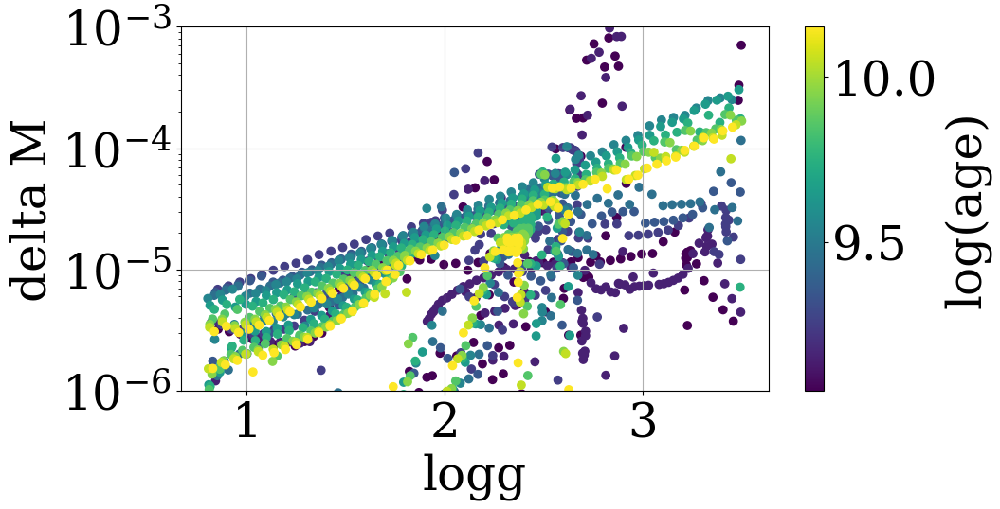

In [31]:
plt.figure(figsize=(10,5))
plt.scatter(JHK_iso['logg'][m], all_deltaMs[m],c=JHK_iso['logAge'][m])
plt.colorbar(label='log(age)')
plt.ylim(1e-6,1e-3)
plt.yscale('log')
plt.xlabel('logg')
plt.grid()
plt.ylabel('delta M')

plt.show()

In [32]:
np.nanmean(all_deltaMs[m])

2.9660038700563185e-05

In [33]:
#Number ratio 
mass_ratio = np.zeros((len(mh_bins['center']),len(age_bins['center'])))

for i_f in range(len(mh_bins['center'])):
    for i_a in range(len(age_bins['center'])):
        iso_mask = isochrones_mask_for_bin(age_bins['min'][i_a],age_bins['max'][i_a],
                        mh_bins['min'][i_f],mh_bins['max'][i_f], return_mask=True)
        
        logg_mask = iso_mask&(JHK_iso['logg']<=logg_max_lim)&(JHK_iso['logg']>=logg_min_lim)
        #logg_mask = logg_mask&(JHK_iso['logTe']<=np.log10(8000))
        mass_ratio[i_f][i_a] = np.sum(iso_DMS[logg_mask])/np.sum(iso_DMS[iso_mask])
        
mass_ratio = 1.0/mass_ratio

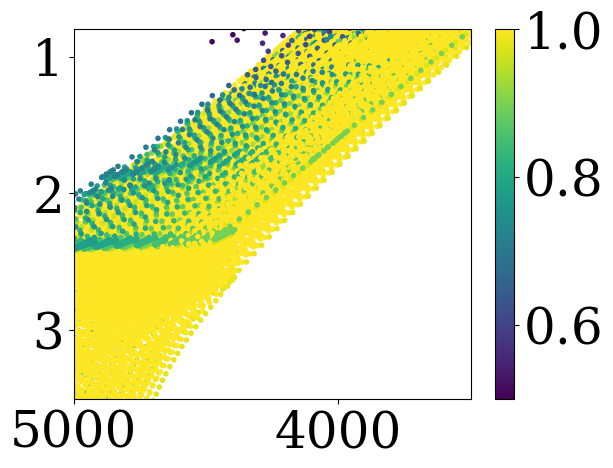

In [34]:
age_colors = mpl.cm.plasma(np.linspace(0,0.999,len(age_bins['center'])))

for i_f in range(len(mh_bins['center'])):
    for i_a in range(len(age_bins['center'])):
        iso_mask = isochrones_mask_for_bin(age_bins['min'][i_a],age_bins['max'][i_a],
                        mh_bins['min'][i_f],mh_bins['max'][i_f], return_mask=True)
        plt.scatter(10**JHK_iso['logTe'][iso_mask],
                    JHK_iso['logg'][iso_mask],c=JHK_iso['Mass'][iso_mask],
                    marker='.',vmin=0.5,vmax=1)
        
plt.colorbar()
plt.xlim(5000,3500)
plt.ylim(logg_max_lim,logg_min_lim)
plt.show()

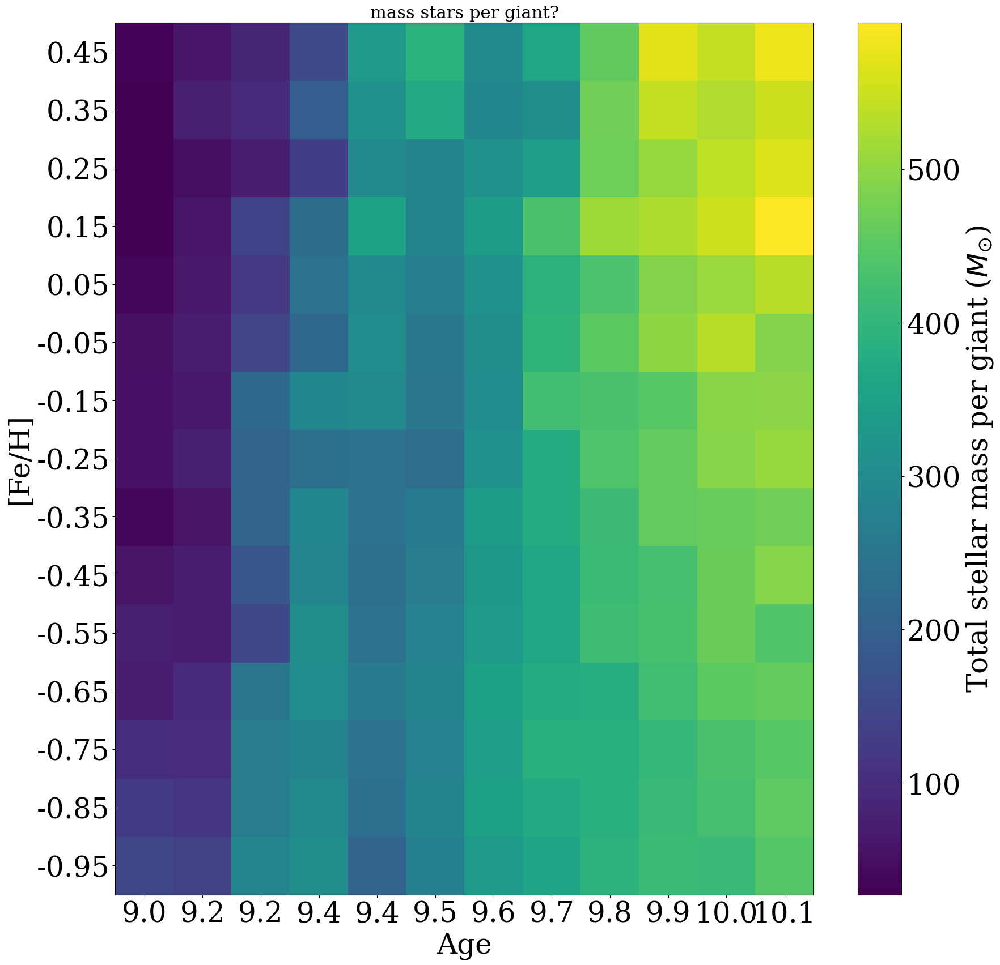

In [35]:
plt.figure(figsize=(20,20))
plt.imshow(mass_ratio)
plt.xticks(np.arange(len(age_bins['center'])),[round(a,1) for a in np.log10(age_bins['center']*1e9)])
plt.yticks(np.arange(len(mh_bins['center'])),[round(a,2) for a in mh_bins['center']])
plt.ylim(-0.5,len(mh_bins['center'])-0.5)
plt.xlim(-0.5,len(age_bins['max'])-0.5)
plt.title('mass stars per giant?')
plt.ylabel('[Fe/H]')
plt.xlabel('Age')
plt.colorbar(label=r'Total stellar mass per giant ($M_{\odot}$)')
plt.show()

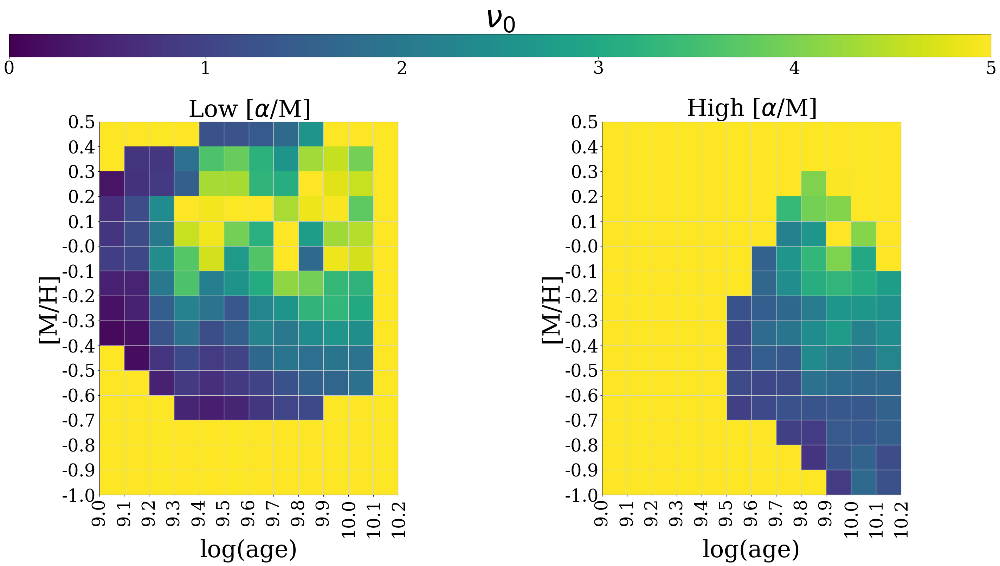

In [36]:
#peakiness plot

tmi = table_to_matrix_index_low
param_array_low = (10**density_params['NU_0'][table_to_matrix_index_low])
param_array_high = (10**density_params['NU_0'][table_to_matrix_index_high])
param_array_low = param_array_low.reshape((len(age_bins['center']),len(mh_bins['center']))).T*mass_ratio
param_array_high = param_array_high.reshape((len(age_bins['center']),len(mh_bins['center']))).T*mass_ratio

rho_0 = np.array([param_array_low,param_array_high])

ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()

im1=ax1a.imshow(rho_0[0],origin='lower',
              vmin=0,vmax=5)
im2=ax1b.imshow(rho_0[1],origin='lower',
               vmin=0,vmax=5)

ax1c.set_title(r'$\nu_0$',fontsize=64)

cbar=plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    
plt.tight_layout()
#plt.savefig(figure_directory + 'param_rho.png', bbox_inches = 'tight')
plt.show()

#big number = no change / single exponential
#small number = big diff / sharp peak


In [37]:
min_rs = []
max_rs = []

for i_a in range(len(age_bins['center'])):
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        data_binmask = data_binmask&(apogee_sample['ALPHA_BIN']=='LOW')
        if len(data_binmask[data_binmask])>0:
            min_rs.append(np.nanmin(data_rs[data_binmask]))
            max_rs.append(np.nanmax(data_rs[data_binmask]))
        else:
            min_rs.append(np.nan)
            max_rs.append(np.nan)
        
for i_a in range(len(age_bins['center'])):
    for i_f in range(len(mh_bins['center'])):
        data_binmask = (apogee_sample['METAL_BIN_I'] == i_f) #feh min
        data_binmask = data_binmask&(apogee_sample['AGE_BIN_I'] == i_a)
        data_binmask = data_binmask&(apogee_sample['ALPHA_BIN']=='HIGH')
        if len(data_binmask[data_binmask])>0:
            min_rs.append(np.nanmin(data_rs[data_binmask]))
            max_rs.append(np.nanmax(data_rs[data_binmask]))
        else:
            min_rs.append(np.nan)
            max_rs.append(np.nan)
            
        

In [38]:
#"TOTAL mass (not just p0)"
total_mass = np.ones((2,len(age_bins['center']),len(mh_bins['center'])))*np.nan

r_samp = np.linspace(1e-6,30,200)
z_samp = np.linspace(1e-6,30,200)

cntr=0
for i_alpha in [0,1]:
    for i_f in range(len(mh_bins['center'])):
        for i_a in range(len(age_bins['center'])):
                d = density_params[cntr]
                cntr+=1
                r_prof = np.zeros(len(r_samp))
                test_params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                
                if np.isfinite(test_params[0]):
                    tot_mass_r = []
                    for r in r_samp:
                        #for y in y_samp:
                        
                        m = combined_exp_profile_nonsmoothed_linear(test_params,
                                                                            r*np.ones(len(z_samp)),
                                                                                      z_samp)
                        if np.isfinite(np.nansum(m)):
                            #tot_mass = tot_mass+np.nansum(m)
                            tot_mass_r.append(np.trapz(m, x=z_samp))

                    #if np.isfinite(tot_mass):
                    total_mass[i_alpha,i_a,i_f] = np.trapz(tot_mass_r, x=r_samp)
            


<Figure size 3000x1700 with 0 Axes>

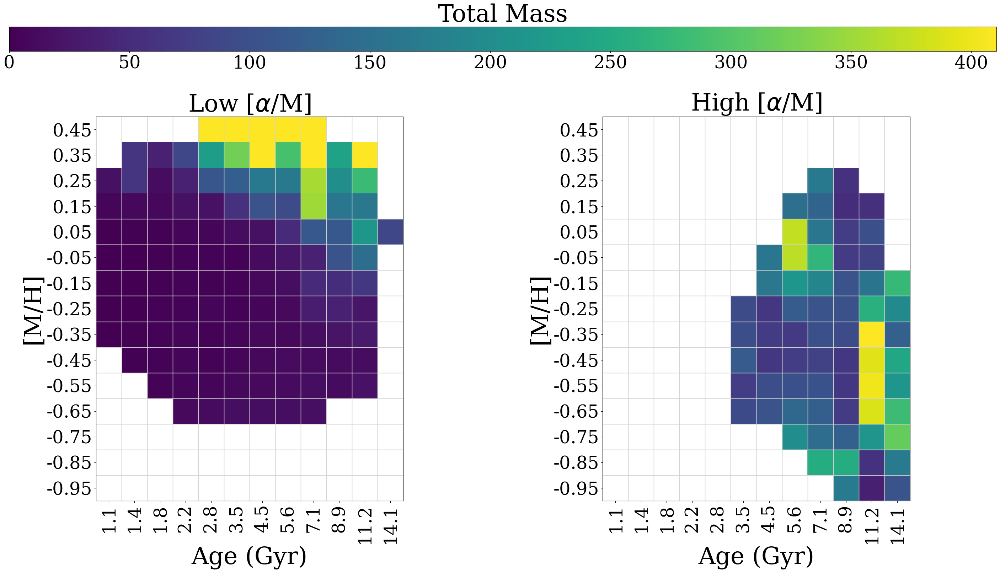

Low: 13827.745303213462
High: 10673.983220563488
Total: 24501.72852377695



In [39]:
plt.figure(figsize=(30,17))
ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()

maxi=np.nanpercentile((total_mass[1].T*mass_ratio).flatten(),99)
im1=ax1a.imshow(total_mass[0].T*mass_ratio,origin='upper',
              vmin=0, vmax=maxi)
im2=ax1b.imshow(total_mass[1].T*mass_ratio,origin='upper',
               vmin=0, vmax=maxi)


ax1c.set_title('Total Mass',fontsize=48)

for ax in [ax1a,ax1b]:
    ax.set_xticks(np.arange(len(age_bins['center'])))
    ax.set_yticks(np.arange(len(mh_bins['center'])))
    ax.set_xticklabels([round(a,1) for a in age_bins['center']])
    ax.set_yticklabels([round(a,2) for a in mh_bins['center']])
    ax.set_ylim(-0.5,len(mh_bins['max'])-0.5)
    ax.set_xlim(-0.5,len(age_bins['max'])-0.5)
    ax.set_xlabel('Age (Gyr)')
    ax.set_ylabel('[M/H]')

    for i in range(len(age_bins['center'])):
        ax.axvline(i-0.5,c='lightgray')
        ax.axhline(i-0.5,c='lightgray')
        

plt.colorbar(im1,cax=ax1c,orientation='horizontal')

plt.tight_layout()
plt.savefig(figure_directory + 'total_mass.png')
plt.show()

low_mass = total_mass[0].T*mass_ratio
high_mass = total_mass[1].T*mass_ratio
print(f"Low: {np.nansum(low_mass)}\nHigh: {np.nansum(high_mass)}\nTotal: {np.nansum(low_mass)+np.nansum(high_mass)}\n")


13827.74530321346
10673.983220563488


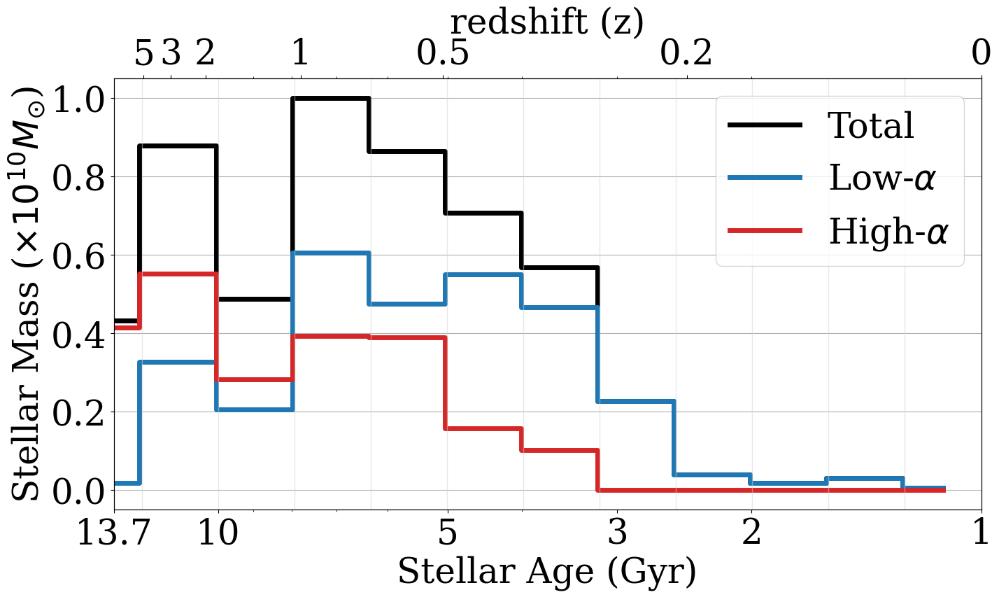

In [40]:
low_sfh=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high_sfh=np.nansum(total_mass[1]*mass_ratio.T,axis=1)

print(np.nansum(low_sfh))
print(np.nansum(high_sfh))
tot_sfh = low_sfh+high_sfh
mw_mass = 5.26e10

low_sfh = low_sfh/np.sum(tot_sfh)*mw_mass/1e10
high_sfh = high_sfh/np.sum(tot_sfh)*mw_mass/1e10
tot_sfh = tot_sfh/np.sum(tot_sfh)*mw_mass/1e10

fig,ax = plt.subplots(figsize=(16,8))
ax.plot(age_bins['center'], tot_sfh, c='k',label=r'Total',drawstyle='steps-mid',lw=5)
ax.plot(age_bins['center'], low_sfh, c='tab:blue',label=r'Low-$\alpha$',drawstyle='steps-mid',lw=5)
ax.plot(age_bins['center'], high_sfh, c='tab:red',label=r'High-$\alpha$',drawstyle='steps-mid',lw=5)
ax.legend(loc='upper right')

for x in age_bins['min']:
    ax.axvline(x,c='lightgray',alpha=0.5)
    
ax.grid(axis='y')

ax.set_xscale('log')
ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())
ax.set_xlim(13.7,age_bins['min'][0])
#ax.set_xticks(age_bins_min)
#ax.set_xticklabels([round(a, 1) for a in age_bins_min])

ax.set_xticks([1,2,3,5,10,13.7])
ax.set_xticklabels([1,2,3,5,10,13.7])

#plt.title('Mass Assembly/SFH?')
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel(r'Stellar Mass ($\times 10^{10} M_{\odot}$)')


#z_age=np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
#z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
z_age=13.7-np.array([13.7-age_bins['min'][0], 11.270, 8.628, 5.903, 3.316, 2.171,1.186])
z = [0,0.2,0.5,1,2,3,5]

cax2 = ax.twiny()
cax2.set_xscale('log')
cax2.set_xlabel(r'redshift (z)')
cax2.set_xticks(z_age)
cax2.set_xticklabels(z)
cax2.set_xlim(13.7,age_bins['min'][0])

plt.savefig(figure_directory + 'sfh.png',bbox_inches='tight')
plt.show()


In [41]:
# Write Table for LateX

In [42]:
print(r'$\alpha$-group & [M/H] & $\log_{10}(\textrm{age})$ & $h_{R,\textrm{in}}$ & $h_{R,\textrm{out}}$ & $R_{\text{break}}$ & $h_{Z\odot}$ & $A_{\text{flare}}$ & $\log(\nu_{\odot})$\\
         \hline \hline')

labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'$\nu_0$']

full_string = r'$\alpha$-group & [M/H] & $\log_{10}(\textrm{age})$ & $h_{R,\textrm{in}}$ & $h_{R,\textrm{out}}$ & $R_{\text{break}}$ & $h_{Z\odot}$ & $A_{\text{flare}}$ & $\log(\nu_{\odot})$\\\hline \hline'
full_string+= '\n'


for d in density_params:
    popstring = f"{d['ALPHA_M']}-$\alpha$ & ${d['M_H']}$ & ${d['LOG_AGE']}$ &"
    for p in ['HR_IN', 'HR_OUT', 'H_Z', 'R_BREAK','A_FLARE', 'NU_0']:
            p = 'HR_IN'
            hr = d[p]
            lw = d[p + '_ERR'][0]
            uw = d[p + '_ERR'][1]

            if np.isnan(hr):
                popstring += ' --- &'
            else:
                popstring += '${}'.format(round(hr,2))
                popstring += r'^{+' + str(round(np.abs(uw),2)) + r'}_{-' + str(round(np.abs(lw),2)) + r'}$&'
        
    if not np.isnan(hr):
        full_string += popstring +'\n'
       
with open("params_table.txt", "w") as text_file:
    text_file.write(full_string)

SyntaxError: unterminated string literal (detected at line 1) (4273327173.py, line 1)

## 3C: Self-Portrait and Integrated Properties Results

In [ ]:
low=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high=np.nansum(total_mass[1]*mass_ratio.T,axis=1)
tot=low+high

low_sfh = np.nansum(low_mass, axis=0)
high_sfh = np.nansum(high_mass, axis=0)

print(np.nansum(low_sfh))
print(np.nansum(high_sfh))
tot_sfh = low_sfh+high_sfh
mw_mass = 5.26e10

low_sfh = low_sfh/np.sum(tot_sfh)*mw_mass/1e10
high_sfh = high_sfh/np.sum(tot_sfh)*mw_mass/1e10
tot_sfh = tot_sfh/np.sum(tot_sfh)*mw_mass/1e10

fig,ax = plt.subplots(figsize=(16,8))
ax.plot(age_bins['center'], tot_sfh, c='k',label=r'Total',drawstyle='steps-mid',lw=5)
ax.plot(age_bins['center'], low_sfh, c='tab:blue',label=r'Low-$\alpha$',drawstyle='steps-mid',lw=5)
ax.plot(age_bins['center'], high_sfh, c='tab:red',label=r'High-$\alpha$',drawstyle='steps-mid',lw=5)
ax.legend(loc='upper right')

for x in age_bins['min']:
    ax.axvline(x,c='lightgray',alpha=0.5)
    
ax.grid(axis='y')

ax.set_xscale('log')
ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())
ax.set_xlim(13.7,age_bins['min'][0])
#ax.set_xticks(age_bins_min)
#ax.set_xticklabels([round(a, 1) for a in age_bins_min])

ax.set_xticks([1,2,3,5,10,13.7])
ax.set_xticklabels([1,2,3,5,10,13.7])

#plt.title('Mass Assembly/SFH?')
plt.xlabel('Stellar Age (Gyr)')
plt.ylabel(r'Stellar Mass ($\times 10^{10} M_{\odot}$)')


#z_age=np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
#z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
z_age=13.7-np.array([13.7-age_bins['min'][0], 11.270, 8.628, 5.903, 3.316, 2.171,1.186])
z = [0,0.2,0.5,1,2,3,5]

cax2 = ax.twiny()
cax2.set_xscale('log')
cax2.set_xlabel(r'redshift (z)')
cax2.set_xticks(z_age)
cax2.set_xticklabels(z)
cax2.set_xlim(13.7,age_bins['min'][0])

plt.savefig(figure_directory + 'sfh.png',bbox_inches='tight')
plt.show()


In [ ]:
mastar_ssps = fits.open('data/ssps/MaStar_SSP_v0.2.fits')
ssp_ages = mastar_ssps[1].data.T[0][0][0]
ssp_fehs = mastar_ssps[1].data.T[1].T[0].T[0]
ssp_slopes = mastar_ssps[1].data.T[2].T[0][0]
mastar_wls = mastar_ssps[2].data[0]

print(ssp_ages)
print(ssp_fehs)
print(ssp_slopes)

In [ ]:
plt.figure(figsize=(15,10))
age_i = 0
feh_i=7
slope_i = 2

age_colors = mpl.cm.plasma(np.linspace(0,0.999,len(ssp_ages)))
feh_colors = mpl.cm.jet(np.linspace(0,0.999,len(ssp_fehs)))

plt.subplot(211)
for age_i in np.arange(len(ssp_ages)):
    plt.plot(mastar_wls,mastar_ssps[4].data[age_i][feh_i][slope_i],c=age_colors[age_i])
    
plt.title('[Fe/H] = {}'.format(ssp_fehs[feh_i]))
plt.scatter(ssp_ages,ssp_ages,c=ssp_ages,cmap='plasma',s=0)
plt.xlim(np.min(mastar_wls),np.max(mastar_wls))
plt.colorbar(label='Age')

plt.subplot(212)

age_i=15
for feh_i in np.arange(len(ssp_fehs)):
    plt.plot(mastar_wls,mastar_ssps[4].data[age_i][feh_i][slope_i],c=feh_colors[feh_i])
    
plt.title('Age = {} Gyr'.format(ssp_ages[age_i]))
plt.scatter(ssp_fehs,ssp_fehs,c=ssp_fehs,cmap='jet',s=0)
plt.xlim(np.min(mastar_wls),np.max(mastar_wls))
plt.colorbar(label='[Fe/H]')

plt.tight_layout()
plt.show()    

In [ ]:
def interp_ssps(target_age,target_feh):
    feh_i_2 = np.where(ssp_fehs>=target_feh)[0][0]
    feh_i_1 = feh_i_2-1
    feh1 = ssp_fehs[feh_i_1]
    feh2 = ssp_fehs[feh_i_2]
    age_i_2 = np.where(ssp_ages>=target_age)[0][0]
    age_i_1 = age_i_2-1
    age1 = ssp_ages[age_i_1]
    age2 = ssp_ages[age_i_2]

    spec1a = mastar_ssps[4].data[age_i_1][feh_i_1][slope_i]
    spec1b = mastar_ssps[4].data[age_i_2][feh_i_1][slope_i]

    spec2a = mastar_ssps[4].data[age_i_1][feh_i_2][slope_i]
    spec2b = mastar_ssps[4].data[age_i_2][feh_i_2][slope_i]

    target_spec = []

    for i in range(len(mastar_wls)):
        p1 = np.interp(target_feh,[feh1,feh2],[spec1a[i],spec2a[i]])
        p2 = np.interp(target_feh,[feh1,feh2],[spec1b[i],spec2b[i]])
        target_spec.append(np.interp(target_age,[age1,age2],[p1,p2]))
    
    return np.array(target_spec)

In [ ]:
ssp_grid = np.zeros((len(age_bins['center']),len(mh_bins['center']),len(mastar_wls)))
ssp_max = np.zeros((len(age_bins['center']),len(mh_bins['center'])))*np.nan

for i_a,age in enumerate(age_bins['center']):
    for i_f,feh in enumerate(mh_bins['center']):
        target_age = age
        target_feh = np.round(feh,2)
        if (target_age>=np.min(ssp_ages))&(target_age<=np.max(ssp_ages)):
            if (target_feh>=np.min(ssp_fehs))&(target_feh<=np.max(ssp_fehs)):
                ssp = interp_ssps(target_age,target_feh)
                ssp_grid[i_a,i_f]=ssp
                ssp_max[i_a][i_f]=np.sum(ssp)
                

In [ ]:
#interpolate to get missing top row!
age_colors= mpl.cm.plasma(np.linspace(0,0.999,len(age_bins['center'])))
plt.figure(figsize=(10,10))
for i in range(len(age_bins['center'])):
    x=mh_bins['center']
    y=ssp_max[i]
    plt.scatter(x,y,c=age_colors[i],s=100)
    
    test_xs = np.linspace(np.min(mh_bins['center']),np.max(mh_bins['center']),100)
    pf = np.polyfit(x[:-1],y[:-1],3)
    test_ys = test_xs**3*pf[0]+test_xs**2*pf[1]+test_xs*pf[2]+pf[3]
    plt.plot(test_xs,test_ys,c=age_colors[i])
    x1 = mh_bins['center'][-1]
    y1 = x1**3*pf[0]+x1**2*pf[1]+x1*pf[2]+pf[3]
    plt.scatter(x1,y1,marker='x',s=200,c=age_colors[i])
    ssp_max[i][-1] = y1


In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(ssp_max.T)
plt.xticks(np.arange(len(age_bins['center'])),[round(a,1) for a in age_bins['center']])
plt.yticks(np.arange(len(mh_bins['center'])),[round(a,2) for a in mh_bins['center']])
plt.ylim(-0.5,len(mh_bins['max'])-0.5)
plt.xlim(-0.5,len(age_bins['max'])-0.5)
plt.title('mastar ssp light per mass')
plt.ylabel('[Fe/H]')
plt.xlabel('Age')
plt.colorbar(label=r'sum(flux) of SSP')
plt.show()




In [ ]:
# At Z=0
r_samp = np.linspace(0.5,15,500)

r_profs = np.zeros((len(age_bins['center']),len(mh_bins['center']),2,len(r_samp)))

cntr=0
for i_alpha in [0,1]:
    for i_f in range(len(mh_bins['center'])):
        for i_a in range(len(age_bins['center'])):
                d = density_params[cntr]
                cntr+=1
                r_prof = np.zeros(len(r_samp))
                test_params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                if np.isfinite(test_params[0]):
                    m = combined_exp_profile_nonsmoothed_linear(test_params,r_samp,
                                                                1e-6*np.ones(len(r_samp)))
                    if np.isfinite(np.nansum(m)):
                        r_prof+=m
                            
                r_profs[i_a][i_f][i_alpha] = r_prof
                

#=================================                
plt.figure(figsize=(10,20))

low_r_prof = np.zeros(len(r_samp))
high_r_prof = np.zeros(len(r_samp))
tot_r_prof = np.zeros(len(r_samp))
for i_a in range(len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'])):
            tot_r_prof+=(r_profs[i_a][i_f][0]+r_profs[i_a][i_f][1])
            low_r_prof+=r_profs[i_a][i_f][0]
            high_r_prof+=r_profs[i_a][i_f][1]
      
    
plt.subplot(211)
massprof = np.copy(tot_r_prof)
#plt.title('Mass Weighted')
plt.xlabel('R (kpc)')
plt.ylabel('Mass Weighted \n ' + r'Density Profile (M$_\odot$ kpc$^{-3}$)')
plt.yscale('log')
plt.xticks(np.arange(0,16,2.5),['' for x in range(len(np.arange(0,16,2.5)))])

prof_colors=['tab:blue','tab:red','k']

scale=np.sum(tot_r_prof)

strngi = [r'low-$\alpha$    ',r'high-$\alpha$   ','Total     ']
for i,prof in enumerate([low_r_prof,high_r_prof,tot_r_prof]):
    pf = np.polyfit(r_samp,np.log(prof),1)
    plt.plot(r_samp,np.e**(pf[0]*r_samp+pf[1]),
             linestyle=':',
             c=prof_colors[i],label=strngi[i]+r'$R_d$ = ' + '{} kpc'.format(round(-1/pf[0],2)))
    plt.plot(r_samp,prof,c=prof_colors[i])
    tmp = prof
    scale = prof[0]
    
i=210
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i]-0.5,tmp[i]*2,'Sag-Car arm',ha='center',va='bottom',rotation=-10)

i=405
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i],tmp[i]*2,'Perseus arm',ha='center',va='bottom',rotation=-10)

plt.axvline(8.3,c='k')
plt.text(8.3,tmp[0],'R$_{\odot}$',ha='left',va='top')

    
plt.legend()
plt.xlim(0,15)
plt.grid()
    

#======================

plt.subplot(212)
#plt.title('Light Weighted')
plt.xlabel('R (kpc)')
plt.ylabel('Light Weighted \n ' + r'Density Profile (M$_\odot$ kpc$^{-3}$)')
plt.yscale('log')
plt.grid()


low_r_prof = np.zeros(len(r_samp))
high_r_prof = np.zeros(len(r_samp))
tot_r_prof = np.zeros(len(r_samp))
for i_a in range(len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'])):
            tot_r_prof+=(r_profs[i_a][i_f][0]+r_profs[i_a][i_f][1])*ssp_max[i_a][i_f]
            low_r_prof+=r_profs[i_a][i_f][0]*ssp_max[i_a][i_f]
            high_r_prof+=r_profs[i_a][i_f][1]*ssp_max[i_a][i_f]

low_r_prof = low_r_prof/tot_r_prof[0]*scale
high_r_prof = high_r_prof/tot_r_prof[0]*scale
tot_r_prof = tot_r_prof/tot_r_prof[0]*scale

strngi = [r'low-$\alpha$    ',r'high-$\alpha$   ','Total     ']
for i,prof in enumerate([low_r_prof,high_r_prof,tot_r_prof]):
    pf = np.polyfit(r_samp,np.log(prof),1)
    plt.plot(r_samp,np.e**(pf[0]*r_samp+pf[1]),
             linestyle=':',
             c=prof_colors[i],label=strngi[i]+r'$R_d$ = ' + '{} kpc'.format(round(-1/pf[0],2)))
    plt.plot(r_samp,prof,c=prof_colors[i])
    tmp = prof
    
i=210
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i]-0.5,tmp[i]*2,'Sag-Car arm',ha='center',va='bottom',rotation=-10)

i=405
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i],tmp[i]*2,'Perseus arm',ha='center',va='bottom',rotation=-10)

plt.axvline(8.3,c='k')
plt.text(8.3,tmp[0],'R$_{\odot}$',ha='left',va='top')

plt.xlim(0,15)
plt.legend()
plt.subplots_adjust(hspace=0)
plt.savefig(figure_directory+'massprof.png',bbox_inches='tight')
plt.show()

In [ ]:
# Int over Z = 5
r_samp = np.linspace(1e-6,15,500)
z_samp = np.linspace(1e-6,5,500)

r_profs = np.zeros((len(age_bins['center']),len(mh_bins['center']),2,len(r_samp)))

cntr=0
for i_alpha in [0,1]:
    for i_f in range(len(mh_bins['center'])):
        for i_a in range(len(age_bins['center'])):
                d = density_params[cntr]
                cntr+=1
                r_prof = np.zeros(len(r_samp))
                test_params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                
                if np.isfinite(test_params[0]):
                    for ir,r in enumerate(r_samp):
                        m = combined_exp_profile_nonsmoothed_linear(test_params,
                                                                    r*np.ones(len(r_samp)),
                                                                    z_samp)
                        if np.isfinite(np.nansum(m)):
                            r_prof[ir] = np.trapz(m,x=z_samp)
                            
                r_profs[i_a][i_f][i_alpha] = r_prof
                

#=================================                
plt.figure(figsize=(10,20))

low_r_prof = np.zeros(len(r_samp))
high_r_prof = np.zeros(len(r_samp))
tot_r_prof = np.zeros(len(r_samp))
for i_a in range(len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'])):
            tot_r_prof+=(r_profs[i_a][i_f][0]+r_profs[i_a][i_f][1])
            low_r_prof+=r_profs[i_a][i_f][0]
            high_r_prof+=r_profs[i_a][i_f][1]
      
    
plt.subplot(211)
massprof = np.copy(tot_r_prof)
#plt.title('Mass Weighted')
plt.xlabel('R (kpc)')
plt.ylabel('Mass Weighted \n ' + r'Density Profile (M$_\odot$ kpc$^{-3}$)')
plt.yscale('log')
plt.xticks(np.arange(0,16,2.5),['' for x in range(len(np.arange(0,16,2.5)))])

prof_colors=['tab:blue','tab:red','k']

scale=np.sum(tot_r_prof)

strngi = [r'low-$\alpha$    ',r'high-$\alpha$   ','Total     ']
for i,prof in enumerate([low_r_prof,high_r_prof,tot_r_prof]):
    pf = np.polyfit(r_samp,np.log(prof),1)
    plt.plot(r_samp,np.e**(pf[0]*r_samp+pf[1]),
             linestyle=':',
             c=prof_colors[i],label=strngi[i]+r'$R_d$ = ' + '{} kpc'.format(round(-1/pf[0],2)))
    plt.plot(r_samp,prof,c=prof_colors[i])
    tmp = prof
    scale = prof[0]
    
#i=210
#plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
#plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
#plt.text(r_samp[i]-0.5,tmp[i]*2,'Sag-Car arm',ha='center',va='bottom',rotation=-10)

#i=405
#plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
#plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
#plt.text(r_samp[i],tmp[i]*2,'Perseus arm',ha='center',va='bottom',rotation=-10)

plt.axvline(8.3,c='k')
plt.text(8.3,tmp[0],'R$_{\odot}$',ha='left',va='top')
plt.text(14.5,tmp[0],r'$|Z|\leq 5$ kpc',ha='right',va='top',fontsize=30)

    
plt.legend()
plt.xlim(0,15)
plt.grid()
    

#======================

plt.subplot(212)
#plt.title('Light Weighted')
plt.text(14.5,tmp[0],r'$|Z|\leq 5$ kpc',ha='right',va='top',fontsize=30)
plt.xlabel('R (kpc)')
plt.ylabel('Light Weighted \n ' + r'Density Profile (M$_\odot$ kpc$^{-2}$)')
plt.yscale('log')
plt.grid()


low_r_prof = np.zeros(len(r_samp))
high_r_prof = np.zeros(len(r_samp))
tot_r_prof = np.zeros(len(r_samp))
for i_a in range(len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'])):
            tot_r_prof+=(r_profs[i_a][i_f][0]+r_profs[i_a][i_f][1])*ssp_max[i_a][i_f]
            low_r_prof+=r_profs[i_a][i_f][0]*ssp_max[i_a][i_f]
            high_r_prof+=r_profs[i_a][i_f][1]*ssp_max[i_a][i_f]

low_r_prof = low_r_prof/tot_r_prof[0]*scale
high_r_prof = high_r_prof/tot_r_prof[0]*scale
tot_r_prof = tot_r_prof/tot_r_prof[0]*scale

strngi = [r'low-$\alpha$    ',r'high-$\alpha$   ','Total     ']
for i,prof in enumerate([low_r_prof,high_r_prof,tot_r_prof]):
    pf = np.polyfit(r_samp,np.log(prof),1)
    plt.plot(r_samp,np.e**(pf[0]*r_samp+pf[1]),
             linestyle=':',
             c=prof_colors[i],label=strngi[i]+r'$R_d$ = ' + '{} kpc'.format(round(-1/pf[0],2)))
    plt.plot(r_samp,prof,c=prof_colors[i])
    tmp = prof
    
i=210
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i]-0.5,tmp[i]*2,'Sag-Car arm',ha='center',va='bottom',rotation=-10)

i=405
plt.scatter(r_samp[i],tmp[i]*1.3,marker='v',s=200,c='k')
plt.scatter(r_samp[i],tmp[i]*1.9,marker='|',s=500,c='k')
plt.text(r_samp[i],tmp[i]*2,'Norma-Outer arm',ha='center',va='bottom',rotation=-10)

plt.axvline(8.3,c='k')
plt.text(8.3,tmp[0],'R$_{\odot}$',ha='left',va='top')

plt.xlim(0,15)
plt.legend()

plt.subplots_adjust(hspace=0)
plt.savefig(figure_directory + 'massprof_int.png',bbox_inches='tight')
plt.show()

In [ ]:
ispec_low = np.zeros(len(mastar_wls))
ispec_high = np.zeros(len(mastar_wls))

for i_a in range(len(age_bins['center'])):
    for i_f in range(len(mh_bins['center'])):
        m = total_mass[0][i_a][i_f]
        if np.isfinite(m)&(m<100):
            ispec_low+=total_mass[0][i_a][i_f]*ssp_grid[i_a][i_f]
        
        m = total_mass[1][i_a][i_f]
        if np.isfinite(m)&(m<100):
            ispec_high+=total_mass[1][i_a][i_f]*ssp_grid[i_a][i_f]


In [ ]:
total_spec = ispec_high+ispec_low
plt.figure(figsize=(20,7))
plt.plot(mastar_wls,ispec_low,c='tab:blue',label=r'Low-$\alpha$')
plt.plot(mastar_wls,ispec_high,c='tab:red',label=r'High-$\alpha$')
plt.plot(mastar_wls,total_spec,c='k',label='Total')

fiedler_sed_wls = np.array([3540, 4750, 6220, 7630, 9050])
#log (nu V)
fiedler_sed_orig = np.array([36.01, 36.44, 36.62, 36.66, 36.70])
fiedler_sed = 10**(fiedler_sed_orig)/fiedler_sed_wls
fiedler_sed = fiedler_sed/np.max(fiedler_sed)
fiedler_sed = fiedler_sed*np.interp(6200,mastar_wls,total_spec)
print(fiedler_sed)
fiedler_err = np.array([0.06,0.02,0.02,0.01,0.02])
fiedler_err = (10**(fiedler_sed_orig+fiedler_err))/fiedler_sed_wls
fiedler_err = fiedler_err-(10**(fiedler_sed_orig))/fiedler_sed_wls

#for i in range(len(fiedler_sed)):
#    plt.errorbar(fiedler_sed_wls[i],fiedler_sed[i],yerr=fiedler_err[i],c='w',
#                 lw=6,zorder=10)
#    plt.errorbar(fiedler_sed_wls[i],fiedler_sed[i],yerr=fiedler_err[i],c='limegreen',
#                 lw=3,zorder=11,capsize=5)
    
#plt.scatter(fiedler_sed_wls,fiedler_sed,facecolor='limegreen',
#            edgecolor='w',marker='o',zorder=14,s=200,label='Fielder et al. 2021')

plt.grid()
plt.xlabel(r'Wavelength ($\AA$)')
plt.ylabel('Flux')


#test_mwaspec = np.loadtxt('ssps/mwa_spectra/manga_spec_8444_12703')
#s=test_mwaspec.T[1]
#plt.plot(test_mwaspec.T[0],s/np.median(s)*0.8*np.max(ispec_high),c='orange',label='MWA spectrum')
#plt.plot(test_mwaspec.T[0],test_mwaspec.T[2])
#plt.ylim(0,0.2e33)


plt.legend(ncol=3,loc='lower right')
plt.savefig(figure_directory+'MW_ispec.png',bbox_inches='tight')
plt.show()

In [ ]:
manga = fits.open('data/manga_mwas/drpall-v3_1_1.fits')
manga_dap = fits.open('data/manga_mwas/dapall-v3_1_1-3.1.0.fits')

#mwa_list = np.loadtxt('ssps/mwa_spectra/mwa_list.dat',dtype='str')
mwa_list = np.loadtxt('data/manga_mwas/mwa_spectra/mwa_b20_table.dat',dtype='str')

mwa_manga_ids = []
mwa_manga_ids_DAP = []
for m in mwa_list.T[0]:
    mwa_manga_ids.append(np.where(manga[1].data['MANGAID']==m)[0][0])
    mwa_manga_ids_DAP.append(np.where(manga_dap[1].data['MANGAID']==m)[0][0])
 
#mwa_manga_ids

In [ ]:
mwa_specs = []
for i,m in enumerate(mwa_list):
    spec = 'data/manga_mwas/mwa_spectra/mwa_binned_spec/manga_binned_spec_{}_{}'.format(m[1],m[2])
    spec = np.loadtxt(spec)
    redshift = manga[1].data['z'][mwa_manga_ids[i]]
    new_wls = spec.T[0]/(1+redshift)
    scale2 = spec.T[1][np.where(new_wls>5500)[0][0]]
    color_i = i/len(mwa_list)
    tmpspec = np.interp(mastar_wls,new_wls,spec.T[1]/scale2)
    for it in range(len(tmpspec)):
        if mastar_wls[it] <= np.min(new_wls):
            tmpspec[it] = np.nan
        if mastar_wls[it] >= np.max(new_wls):
            tmpspec[it] = np.nan

    mwa_specs.append(tmpspec)
    
mwa_specs = np.array(mwa_specs)

In [ ]:
plt.figure(figsize=(25,10))

plt.plot(mastar_wls,np.nanpercentile(mwa_specs,50,axis=0),c='dimgray', zorder=2,
         label='Milky Way Analogs (Boardman et al. 2020)')
sig1=34
sig2 = 95.0/2
int_points = 15
plt.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig2,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig2,axis=0)[::int_points],color='lightgrey',
                 lw=0,zorder=0)
plt.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig1,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig1,axis=0)[::int_points],color='darkgray',
                 lw=0,zorder=1)
    
scale1 = total_spec[np.where(mastar_wls>5500)[0][0]] #5500 Angst  
plt.plot(mastar_wls,total_spec/scale1,c='k',label='Total MW Spectrum (z=0)',zorder=10)

for i in range(len(fiedler_sed)):
    tx=plt.text(fiedler_sed_wls[i],fiedler_sed[i]/scale1,['  u','  g','  r','  i','  z'][i],
             color='deepskyblue', ha='left',va='center',zorder=12)
    tx.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])


tx = plt.errorbar(fiedler_sed_wls,fiedler_sed/scale1,yerr=fiedler_err/scale1/10,
             zorder=11,marker='o',color='deepskyblue',markersize=10, ls='none',
             label='Milky Way SED (Fielder et al. 2021)',lw=3)
tx[0].set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])



plt.grid()
plt.xlabel(r'Rest Wavelength ($\AA$)')
plt.ylabel(r'Flux / f($\lambda = 5500 \AA$)')
plt.legend(ncol=1,loc='lower right')
plt.ylim(0,1.5)
plt.savefig(figure_directory + 'MW_ispec_comparison.png',bbox_inches='tight')
plt.show()


In [ ]:
#Reddening law from Allen (1976)
#http://www.bo.astro.it/~micol/Hyperz/old_public_v1/hyperz_manual1/node10.html#tab_all_prev
allen_red1 = np.array([1000,1110,1250,1430,1670,2000,2220,2500,2850,3330,3650,4000,4400,5000,5530,6700,9000,10000])#,20000,100000]
allen_red2 = np.array([4.2,3.7,3.3,3,2.7,2.8,2.9,2.3,1.97,1.69,1.58,1.45,1.32,1.13,1,0.74,0.46,0.38])#,0.11,0]

plt.figure(figsize=(10,5))
plt.plot(allen_red1,allen_red2,label = 'Allen (1976)')

#Alternate from
#https://ui.adsabs.harvard.edu/abs/2019ApJ...886..108F/abstract
fitzpatrick = apascii.read('data/ssps/fitzpatrick_ext_curve.txt')
fitz_red1 = np.append(fitzpatrick['col1'],fitzpatrick['col5'])#1/um
fitz_red1 = (1.0/fitz_red1)*(1e-6)/(1e-10) #Angstroms
fitz_red2 = np.append(fitzpatrick['col2'],fitzpatrick['col6'])
fitz_red2 = (np.copy(fitz_red2)/3.1)+1
#Have to sort or interp fails??
fitz_red2=fitz_red2[np.argsort(fitz_red1)]
fitz_red1=fitz_red1[np.argsort(fitz_red1)]

plt.plot(fitz_red1,fitz_red2,label = 'Fitzpatrick (2019)')
plt.axvline(fitz_red1[np.where(fitz_red2==np.max(fitz_red2[fitz_red1>2000]))[0][0]])
plt.legend()
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$k(\lambda)$')
plt.axvspan(np.min(mastar_wls),np.max(mastar_wls),color='lightgray',alpha=0.5)
plt.show()



allen_redfrac = np.interp(mastar_wls,allen_red1,allen_red2) #Allen 1976
fitz_redfrac = np.interp(mastar_wls,fitz_red1,fitz_red2) #Fitzpatrick 2019

#red_frac = 10.0**(-0.4*allen_redfrac)
red_frac = 10.0**(-0.4*fitz_redfrac)
#red_frac = 10.0**(-0.4*np.mean(np.array([allen_redfrac,fitz_redfrac]),axis=0)) #average??



In [ ]:
plt.figure(figsize=(25,10))

plt.plot(mastar_wls,np.nanpercentile(mwa_specs,50,axis=0),c='dimgray', zorder=2)#,
         #label='Milky Way Analogs (Boardman et al. 2020)')
sig1 = 34
sig2 = 95.0/2
int_points = 15
plt.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig2,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig2,axis=0)[::int_points],color='lightgrey',
                 lw=0,zorder=0)
plt.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig1,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig1,axis=0)[::int_points],color='darkgray',
                 lw=0,zorder=1,label='Milky Way Analogs (Boardman et al. 2020)')

    
total_red_spec = 3.1*red_frac*total_spec*0.5 + total_spec*0.5
scale1 = total_red_spec[np.where(mastar_wls>5500)[0][0]] #5500 Angst  
#plt.plot(mastar_wls,(red_frac*total_spec)/scale1,c='k',label='Total MW Spectrum (z=0)',zorder=10)
plt.plot(mastar_wls,total_red_spec/scale1,c='k',label='Total MW Spectrum (z=0)',zorder=10)

scale1=scale1*0.8
for i in range(len(fiedler_sed)):
    tx=plt.text(fiedler_sed_wls[i],fiedler_sed[i]/scale1,['  u','  g','  r','  i','  z'][i],
             color='deepskyblue', ha='left',va='center',zorder=12)
    tx.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])


tx = plt.errorbar(fiedler_sed_wls,fiedler_sed/scale1,yerr=fiedler_err/scale1/20,
             zorder=11,marker='o',color='w',markersize=10, ls='none',lw=7)
tx = plt.errorbar(fiedler_sed_wls,fiedler_sed/scale1,yerr=fiedler_err/scale1/20,
             zorder=12,marker='o',color='deepskyblue',markersize=10, ls='none',
             label='Milky Way SED (Fielder et al. 2021)',lw=3)
tx[0].set_path_effects([PathEffects.withStroke(linewidth=7, foreground='w')])


plt.grid()
plt.xlabel(r'Rest Wavelength ($\AA$)')
plt.ylabel(r'Flux / f($\lambda = 5500 \AA$)')
plt.legend(ncol=1,loc='lower right')
plt.ylim(0,1.5)
plt.savefig(figure_directory + 'MW_ispec_comparison_redd.png',bbox_inches='tight')
plt.show()


In [ ]:
#WITH RESIDS
plt.figure(figsize=(25,15))

ax1 = plt.subplot2grid((5,1), (0, 0), colspan=1,rowspan=3) 
ax2 = plt.subplot2grid((5,1), (3, 0), colspan=1,rowspan=2) 


ax1.plot(mastar_wls,np.nanpercentile(mwa_specs,50,axis=0),c='dimgray', zorder=2)#,
         #label='Milky Way Analogs (Boardman et al. 2020)')
sig1 = 34
sig2 = 95.0/2
int_points = 15
ax1.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig2,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig2,axis=0)[::int_points],color='lightgrey',
                 lw=0,zorder=0)
ax1.fill_between(mastar_wls[::int_points],np.nanpercentile(mwa_specs,50-sig1,axis=0)[::int_points],
                 np.nanpercentile(mwa_specs,50+sig1,axis=0)[::int_points],color='darkgray',
                 lw=0,zorder=1,label='Milky Way Analogs (Boardman et al. 2020)')

    
total_red_spec = 3.1*red_frac*total_spec*0.5 + total_spec*0.5
scale1 = total_red_spec[np.where(mastar_wls>5500)[0][0]] #5500 Angst  
#plt.plot(mastar_wls,(red_frac*total_spec)/scale1,c='k',label='Total MW Spectrum (z=0)',zorder=10)
ax1.plot(mastar_wls,total_red_spec/scale1,c='k',label='Total MW Spectrum (z=0)',zorder=10)

scale1=scale1*0.8
for i in range(len(fiedler_sed)):
    tx=ax1.text(fiedler_sed_wls[i],fiedler_sed[i]/scale1,['  u','  g','  r','  i','  z'][i],
             color='deepskyblue', ha='left',va='center',zorder=12)
    tx.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])


tx = ax1.errorbar(fiedler_sed_wls,fiedler_sed/scale1,yerr=fiedler_err/scale1,
             zorder=11,marker='o',color='w',markersize=10, ls='none',lw=7)
tx = ax1.errorbar(fiedler_sed_wls,fiedler_sed/scale1,yerr=fiedler_err/scale1,
             zorder=12,marker='o',color='deepskyblue',markersize=10, ls='none',
             label='Milky Way SED (Fielder et al. 2021)',lw=3)
tx[0].set_path_effects([PathEffects.withStroke(linewidth=7, foreground='w')])


ax1.grid()
ax1.set_xticklabels([''])
ax1.set_ylabel(r'Flux / f($\lambda = 5500 \AA$)')
ax1.legend(ncol=1,loc='lower right')
ax1.set_ylim(0,1.5)
ax1.set_xlim(3500,10000)



mwa_avg = np.nanpercentile(mwa_specs,50,axis=0)
mwa_p1a = np.nanpercentile(mwa_specs,50+sig1,axis=0)
mwa_p1b = np.nanpercentile(mwa_specs,50-sig1,axis=0)
mwa_p2a = np.nanpercentile(mwa_specs,50+sig2,axis=0)
mwa_p2b = np.nanpercentile(mwa_specs,50-sig2,axis=0)

mw_spec = total_red_spec/total_red_spec[1815]

resids = mwa_avg - mw_spec

ax2.fill_between(mastar_wls[::int_points],mwa_p2a[::int_points]-mw_spec[::int_points],
                 mwa_p2b[::int_points]-mw_spec[::int_points],color='lightgrey')
ax2.fill_between(mastar_wls[::int_points],mwa_p1a[::int_points]-mw_spec[::int_points],
                 mwa_p1b[::int_points]-mw_spec[::int_points],color='darkgray')
ax2.set_ylim(-0.7,0.7)

ax2.plot(mastar_wls,resids,c='dimgray',zorder=10)
ax2.axhline(0.0,c='k')
ax2.grid()
ax2.set_xlim(3500,10000)
ax2.set_xlabel(r'Rest Wavelength ($\AA$)')
ax2.set_ylabel('Residuals')
ax2.text(3550, -0.6,'Residuals $= f_{MWA} - f_{MW}$')

plt.subplots_adjust(hspace=0.01)
plt.savefig(figure_directory + 'MW_ispec_comparison_redd.png',bbox_inches='tight')
plt.show()


In [ ]:
all_chi2s = []
for i,m in enumerate(mwa_list):
    spec = 'data/manga_mwas/mwa_spectra/mwa_binned_spec/manga_binned_spec_{}_{}'.format(m[1],m[2])
    spec = np.loadtxt(spec)
    redshift = manga[1].data['z'][mwa_manga_ids[i]]
    
    fig, ax1 = plt.subplots(figsize=(20,7))
    # These are in unitless percentages of the figure size. (0,0 is bottom left)
    left, bottom, width, height = [0.13, 0.5, 0.15, 0.35]
    ax2 = fig.add_axes([left, bottom, width, height])
    ax2.set_xticklabels([''])
    ax2.set_yticklabels([''])
    try:
        img = mpimg.imread('data/manga_mwas/mwa_spectra/imgs/{}.png'.format(m[0]))
        imgplot = ax2.imshow(img)
    except:
        pass

    
    #plt.figure(figsize=(20,7))
    #plt.plot(mastar_wls,ispec_low,c='tab:blue',label=r'Low-$\alpha$')
    #plt.plot(mastar_wls,ispec_high,c='tab:red',label=r'High-$\alpha$')
    new_wls = spec.T[0]/(1+redshift)
    scale2 = spec.T[1][np.where(new_wls>5500)[0][0]]
    ax1.plot(new_wls,spec.T[1]/scale2,c='gray',label='MaNGA galaxy ' + m[0])
    #scale3 = spec.T[2][np.where(new_wls>5500)[0][0]]
    #plt.plot(new_wls,spec.T[2]/scale3,c='b',label='Outer Spectrum')
    #plt.title(m[0])
    scale1 = (red_frac*total_spec)[np.where(mastar_wls>5500)[0][0]] #5500 Angst  
    ax1.plot(mastar_wls,total_spec*red_frac/scale1,c='k',label='Total MW Spectrum')

    rwls = np.interp(fiedler_sed_wls,mastar_wls,red_frac)
    for i in range(len(fiedler_sed)):
        tx=ax1.text(fiedler_sed_wls[i],fiedler_sed[i]*rwls[i]/scale1,['  u','  g','  r','  i','  z'][i],
                 color='deepskyblue', ha='left',va='center',zorder=12)
        tx.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])


    tx = ax1.errorbar(fiedler_sed_wls,fiedler_sed*rwls/scale1,yerr=fiedler_err*rwls/scale1,
                 zorder=11,marker='o',color='deepskyblue',markersize=10, ls='none',
                 label='Milky Way SED (Fielder et al. 2021)',lw=3)
    tx[0].set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])
    
    
    wlmask_spec = (new_wls >= np.min(mastar_wls))
    wlmask_mw = (mastar_wls <= np.max(new_wls))
    mwaspecy = (spec.T[1]/scale2)[wlmask_spec]
    mwspecy = (total_spec*red_frac/scale1)[wlmask_mw]
    if len(mwspecy) != len(mwaspecy):
        mwspecy = mwspecy[:len(mwaspecy)]
    chi2 = np.abs(mwaspecy-mwspecy)
    chi2 = chi2/len(mwspecy)
    all_chi2s.append(np.sum(chi2))
    print(np.sum(chi2))

    
    ax1.grid()
    ax1.set_xlabel(r'Rest Wavelength ($\AA$)')
    ax1.set_ylabel(r'Flux / f($\lambda = 5500$)')
    ax1.legend(ncol=2,loc='lower right')
    ax1.set_ylim(0,1.5)
    plt.show()


In [ ]:
plt.figure(figsize=(19,30))
all_chi2s=np.array(all_chi2s)
sorted_chi2 = np.copy(all_chi2s)[np.argsort(all_chi2s)]
for i in range(6): #best 4 matches
    bestone = np.where(all_chi2s==sorted_chi2[i])[0][0]
    print(mwa_list[bestone])
    plt.subplot(3,2,i+1)
    plt.xticks([],[])
    plt.yticks([],[])
    img = mpimg.imread('data/manga_mwas/mwa_spectra/imgs/{}.png'.format(mwa_list[bestone][0]))
    imgplot = plt.imshow(img)
    #print(manga[1].data['MANGAID'][mwa_manga_ids[bestone]])
    print(mwa_list[bestone])
    plt.text(len(img)/2,20,' MaNGA Galaxy {}'.format(mwa_list[bestone][0]),color='w',va='top',ha='center',fontsize=36)
    
    mwammass = float(mwa_list[bestone][5])
    mwammass_sig = float(mwa_list[bestone][6])

    #properties_string = '$M_{*} = $'+ str(round(mwammass/(1e10),2)) + r'$ \times 10^{10} M_{\odot}$' + '\n'
    properties_string = r'$\log M_{*} =$'+ str(round(mwammass,2)) + '$\pm$' + str(round(mwammass_sig,2)) + '\n'
    properties_string += '$R_{d} = $' + mwa_list[bestone][10]
    properties_string += '$\pm$' + mwa_list[bestone][11] + ' kpc' + '\n'
    g = manga[1].data['NSA_SERSIC_ABSMAG'].T[3][mwa_manga_ids[bestone]]
    r = manga[1].data['NSA_SERSIC_ABSMAG'].T[4][mwa_manga_ids[bestone]]
    properties_string += '$(g-r)_0 = $' + str(round((g-r),2))
    

    plt.text(20,len(img)-10, properties_string, color='w',va='bottom',ha='left',fontsize=30)
    

    
plt.subplots_adjust(hspace=0.01,wspace=0.05)
plt.savefig(figure_directory + 'best_analogs.png',bbox_inches='tight')
plt.show()

In [ ]:
#mass/sfh
low=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high=np.nansum(total_mass[1]*mass_ratio.T,axis=1)
tot=low+high

low = low/np.sum(tot)
high = high/np.sum(tot)
tot = tot/np.sum(tot)

mw_gr = np.zeros(len(age_bins['center']))
mw_mass_time = np.zeros(len(age_bins['center']))
present_mass = 5.5e10

age_specs = []
age_specs_low = []
age_specs_high = []

for i_a in range(len(age_bins['center'])):
    print(i_a)
    now_age = age_bins['center'][i_a]
    mass_frac = np.sum(tot[age_bins['center']>=age_bins['center'][i_a]])#need sum > age
    mw_mass_time[i_a] = present_mass*mass_frac
    age_spec = np.zeros(len(mastar_wls))
    age_spec_low = np.zeros(len(mastar_wls))
    age_spec_high = np.zeros(len(mastar_wls))
    for i_a2 in range(i_a,len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'][:-1])):
            #print(range(i_a,len(age_bins_center))
            #print(m1,m2)
            m1 = total_mass[0][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            m2 = total_mass[1][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            current_age = age_bins['center'][i_a2] - age_bins['min'][i_a]
            #else: 
            #    m1 = total_mass[0][i_a2][i_f]
            #    m2 = total_mass[1][i_a2][i_f]
            #    current_age = age_bins_center[i_a2]
                
            roundf = round(mh_bins['center'][i_f],2)
            ssp = interp_ssps(current_age,roundf)
            if np.isfinite(m1):
                age_spec += m1*ssp
                age_spec_low += m1*ssp
            if np.isfinite(m2):
                age_spec += m2*ssp  
                age_spec_high += m2*ssp
    age_specs.append(age_spec)
    age_specs_low.append(age_spec_low)
    age_specs_high.append(age_spec_high)


In [ ]:
total_spec = ispec_high+ispec_low
plt.figure(figsize=(20,7))

ax = plt.subplot2grid((1,21), (0, 0), colspan=18,rowspan=1) #face-on
cax = plt.subplot2grid((1,21), (0, 20), colspan=1,rowspan=1)
    
#ax.plot(mastar_wls,ispec_low,c='tab:blue',label=r'Low-$\alpha$')
#ax.plot(mastar_wls,ispec_high,c='tab:red',label=r'High-$\alpha$')
#ax.plot(mastar_wls,total_spec,c='k',label='Total Spectrum z = 0 ')

for i_a in range(len(age_bins['center'])):
    ax.plot(mastar_wls,age_specs[i_a],c=age_colors[i_a],zorder=i_a)

    
im = ax.scatter(mastar_wls[0]*np.ones(len(age_bins['center'])),
                 age_specs[0][0]*np.ones(len(age_bins['center'])),
                c=age_bins['center'],cmap='plasma',marker='.', vmin=0,vmax=13.7-1.186,
                s=0,edgecolor='k',zorder=0)


cb = plt.colorbar(im,cax=cax,label='Lookback Time (Gyr) $\longrightarrow$')

ax.grid()
ax.set_xlabel(r'Wavelength ($\AA$)')
ax.set_ylabel('Flux')

z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
z = [0,0.2,0.5,1,2,3,5]
cax2 = cb.ax.twinx()
cax2.set_ylabel(r'redshift (z) $\longrightarrow$')
cax2.set_yticks(z_age)
cax2.set_yticklabels(z)
cax2.yaxis.set_label_position("left")
cax2.yaxis.tick_left()
cb.ax.yaxis.tick_right()
cb.ax.yaxis.set_label_position("right")

#plt.legend(ncol=3,loc='lower right')
plt.savefig(figure_directory + 'MW_ispec_time.png',bbox_inches='tight')
plt.show()

# Spectral Idex Measurements using the DAP

In [ ]:
absdb = AbsorptionIndexDB.from_key('EXTINDX')
measured_indx =AbsorptionLineIndices(mastar_wls,total_spec,
                    bluebands = absdb.data['blueside'], 
                    redbands = absdb.data['redside'], 
                    mainbands = absdb.data['primary'],
                    units = absdb.data['units'])

In [ ]:
for i in range(0,len(measured_indx.index)):
    tablestring = f"{absdb['name'][i]} & "
    tablestring += f"{round(absdb['primary'][i][0],1)}-{round(absdb['primary'][i][1],1)}"
    uniti  = absdb['units'][i]
    if uniti == 'ang': ust = r'$\AA$'
    else: ust = 'mag'
    tablestring += f" & {ust}"
    
    tablestring += f" & {round(measured_indx.index[i],2)}"


    tablestring += " \\\\"
    print(tablestring)

In [ ]:
tmj = pd.read_csv('data/ssps/tmj.dat', delim_whitespace=True, comment='#')

In [ ]:
def plot_tmj_model():
    for f in np.array([i for i in set(tmj['[Z/H]'])]):
        if f <= 0.5:
            tmj_mask = np.where((tmj['age']==10)&(tmj['[Z/H]']==f))
            x = np.array(tmj['Mgb'])[tmj_mask]
            y = (np.array(tmj['Fe5270'])[tmj_mask] + np.array(tmj['Fe5335'])[tmj_mask])/2
            plt.plot(x[np.argsort(x)],y[np.argsort(x)],c='k',zorder=1)
            plt.text(x[0],y[0],f'{f}',ha='right', va='bottom',fontsize=20,rotation=-45)
    
    #plt.plot(x[np.argsort(x)],y[np.argsort(x)],c='k',zorder=1,label = '10 Gyr (TMJ)')
        
    for a in np.array([i for i in set(tmj['[alpha/Fe]'])]):
        tmj_mask = np.where((tmj['age']==10)&(tmj['[alpha/Fe]']==a)&(tmj['[Z/H]']<=0.5))
        x = np.array(tmj['Mgb'])[tmj_mask]
        y = (np.array(tmj['Fe5270'])[tmj_mask] + np.array(tmj['Fe5335'])[tmj_mask])/2
        plt.plot(x[np.argsort(x)],y[np.argsort(x)],c='k',zorder=1)
        plt.text(x[-1],y[-1],f'{a}',ha='left', va='bottom',fontsize=20)
        
    # younger one
    for f in np.array([i for i in set(tmj['[Z/H]'])]):
        if f <= 0.5:
            tmj_mask = np.where((tmj['age']==2)&(tmj['[Z/H]']==f))
            x = np.array(tmj['Mgb'])[tmj_mask]
            y = (np.array(tmj['Fe5270'])[tmj_mask] + np.array(tmj['Fe5335'])[tmj_mask])/2
            plt.plot(x[np.argsort(x)],y[np.argsort(x)],'--',c='k',zorder=1)
        
    #plt.plot(x[np.argsort(x)],y[np.argsort(x)],':',c='k',zorder=1,label = '2 Gyr (TMJ)')

    for a in np.array([i for i in set(tmj['[alpha/Fe]'])]):
        tmj_mask = np.where((tmj['age']==2)&(tmj['[alpha/Fe]']==a)&(tmj['[Z/H]']<=0.5))
        x = np.array(tmj['Mgb'])[tmj_mask]
        y = (np.array(tmj['Fe5270'])[tmj_mask] + np.array(tmj['Fe5335'])[tmj_mask])/2
        plt.plot(x[np.argsort(x)],y[np.argsort(x)],'--',c='k',zorder=1)
    


In [ ]:
mgb_i = np.where(absdb['name']=='Mgb')[0]
fe5270_i = np.where(absdb['name']=='Fe5270')[0]
fe5335_i = np.where(absdb['name']=='Fe5335')[0]


mw_mgb = measured_indx.index[mgb_i]
mw_fe = [(measured_indx.index[fe5270_i]+measured_indx.index[fe5335_i])/2]

index_mgb = np.array([manga_dap[1].data['SPECINDEX_1RE'][i][mgb_i] for i in range(len(manga_dap[1].data))])
index_fe5270 = np.array([manga_dap[1].data['SPECINDEX_1RE'][i][fe5270_i] for i in range(len(manga_dap[1].data))])
index_fe5335 = np.array([manga_dap[1].data['SPECINDEX_1RE'][i][fe5335_i] for i in range(len(manga_dap[1].data))])


plt.figure(figsize=(12,10))
plt.scatter(index_mgb, (index_fe5270+index_fe5335)/2,
            marker='.',s=1,color='gray',
            label = 'All MaNGA Galaxies')


#mwamwa_mass = np.log10(manga[1].data['NSA_SERSIC_MASS'][mwa_manga_ids])
mwamwa_mass = mwa_list.T[5]
plt.scatter(index_mgb[mwa_manga_ids_DAP], ((index_fe5270+index_fe5335)/2)[mwa_manga_ids_DAP],
            marker='o',s=100,c=[float(m) for m in mwamwa_mass], cmap='viridis', vmin=10.4, vmax=11.1,
            label = 'MWA Sample (Boardman et al. 2020)',zorder=3)

plt.scatter(mw_mgb,mw_fe,
            marker='*',s=1000, edgecolor='k',lw=2,
            c=[np.log10(mw_mass)], cmap='viridis', vmin=10.4,vmax=11.1,
           label = 'Milky Way (Imig et al. 2023)',zorder=10)

plot_tmj_model()

plt.xlim(0,6)
plt.ylim(0,4.5)
plt.colorbar(label='log($M_*$)')

plt.ylabel('<Fe> ($\AA$)')
plt.xlabel('Mgb ($\AA$)')
plt.grid()
plt.legend(fontsize=20,loc='lower right')

plt.text(1.5,3.2,'[Z/H]',rotation=45,ha='center',va='center')
plt.text(5,3.75,r'[$\alpha$/Fe]',rotation=-45,ha='center',va='center')

plt.savefig(figure_directory + 'indices.png',bbox_inches='tight')
plt.show()

# Calculate Colors from Spectrum

In [ ]:
sloan_colors = []
plt.figure(figsize=(10,5))
sloan_curves = fits.open('data/sloan_filters/filter_curves.fits')
for i,s in enumerate(['u','g','r','i','z']):
    plt.plot(sloan_curves[i+1].data['wavelength'],sloan_curves[i+1].data['resbig'],label=s)
    #filter_curve = np.interp(mastar_wls,sloan_curves[i+1].data['wavelength'],sloan_curves[i+1].data['respt'])
    filter_curve = sloan_curves[i+1].data['resbig']
    filter_spec = np.interp(sloan_curves[i+1].data['wavelength'],mastar_wls,total_spec*red_frac)
    sloan_colors.append(np.nansum(filter_curve*filter_spec*sloan_curves[i+1].data['wavelength']))
    
plt.grid()
plt.axvline(np.min(mastar_wls))
plt.legend()
plt.show()

print(sloan_colors)

In [ ]:
#3631 Jy: this is constant in NU not wl
f_nu = 3631*np.ones(len(mastar_wls))

f_AB = 3631*np.ones(len(mastar_wls))*((3e8)/(mastar_wls*1e-10))

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.plot(mastar_wls,f_AB)
plt.xlabel('wavelength')
plt.subplot(122)
plt.plot((3e8)/(mastar_wls*1e-10),f_nu)
plt.xlabel('nu')
plt.show()

REF_colors=[]
for i,s in enumerate(['u','g','r','i','z']):
    filter_curve = sloan_curves[i+1].data['resbig']
    filter_spec = np.interp(sloan_curves[i+1].data['wavelength'],mastar_wls, f_AB)
    REF_colors.append(np.nansum(filter_curve*filter_spec*sloan_curves[i+1].data['wavelength']))
    

In [ ]:
#https://www.astronomy.ohio-state.edu/martini.10/usefuldata.html
#https://www.sdss.org/dr12/algorithms/ugrizvegasun/
vega_g = -0.08
vega_r = 0.25+vega_g
vega_u = 1.02+vega_g

ref_u = -2.5*np.log10(REF_colors[0])
ref_g = -2.5*np.log10(REF_colors[1])
ref_r = -2.5*np.log10(REF_colors[2])

mw_u = -2.5*np.log10(sloan_colors[0]) - ref_u
mw_g= -2.5*np.log10(sloan_colors[1]) - ref_g
mw_r = -2.5*np.log10(sloan_colors[2]) - ref_r

print(mw_g-mw_r)
print(mw_u-mw_r)

#mw_u = -2.5*np.log10(sloan_colors[0])# - ref_u
#mw_g= -2.5*np.log10(sloan_colors[1])# - ref_g
#mw_r = -2.5*np.log10(sloan_colors[2])# - ref_r


In [ ]:
m_gs = []
o_gs = []

m_rs = []
o_rs = []

for i,m in enumerate(mwa_list):
    spec = 'data/manga_mwas/mwa_spectra/mwa_binned_spec/manga_binned_spec_{}_{}'.format(m[1],m[2])
    spec = np.loadtxt(spec)
    g = manga[1].data['NSA_SERSIC_ABSMAG'].T[3][mwa_manga_ids[i]]
    r = manga[1].data['NSA_SERSIC_ABSMAG'].T[4][mwa_manga_ids[i]]
    #print('Observed: {}'.format(g-r))
    o_gs.append(g)
    o_rs.append(r)
    
    redshift = manga[1].data['z'][mwa_manga_ids[i]]
    new_wls = spec.T[0]/(1+redshift)

    sloan_colors_tmp = []
    for i,s in enumerate(['u','g','r','i','z']):
        filter_curve = sloan_curves[i+1].data['resbig']
        filter_spec = np.interp(sloan_curves[i+1].data['wavelength'],new_wls,spec.T[1])
        sloan_colors_tmp.append(np.nansum(filter_curve*filter_spec*sloan_curves[i+1].data['wavelength']))
        #sloan_colors_tmp.append(np.trapz(filter_curve*filter_spec,x=sloan_curves[i+1].data['wavelength']))

        
    tmp_g= -2.5*np.log10(sloan_colors_tmp[1])# - ref_g
    tmp_r = -2.5*np.log10(sloan_colors_tmp[2])# - ref_r
    m_gs.append(tmp_g)
    m_rs.append(tmp_r)
    
    
    plt.scatter(g-r,tmp_g-tmp_r,c=redshift,vmin=0,vmax=0.08)
    #print(redshift)
    
    
    #print('Measured: {}'.format(tmp_g-tmp_r))
    #print('='*50)
plt.colorbar(label='redshift')
plt.plot([0,1],[0,1],c='gray')
plt.xlabel('NSA_SERSIC_ABSMAG (g-r)')
plt.ylabel('measured from spectrum')
plt.fill_between([0,1],[0,1],[1,1],color='red',alpha=0.1)
plt.fill_between([0,1],[0,0],[0,1],color='cyan',alpha=0.1)
plt.xlim(0.3,1)
plt.ylim(0.3,1)

plt.show()



In [ ]:
#LOWER G-R ESTIMATE
#mass/sfh
low=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high=np.nansum(total_mass[1]*mass_ratio.T,axis=1)
tot=low+high

low = low/np.sum(tot)
high = high/np.sum(tot)
tot = tot/np.sum(tot)

mw_gr_lower = np.zeros(len(age_bins['center']))
mw_mass_time = np.zeros(len(age_bins['center']))
present_mass = 5.26e10

for i_a in range(len(age_bins['center'])):
    print(i_a)
    now_age = age_bins['center'][i_a]
    mass_frac = np.sum(tot[age_bins['center']>=age_bins['center'][i_a]])#need sum > age
    mw_mass_time[i_a] = present_mass*mass_frac
    age_spec = np.zeros(len(mastar_wls))
    age_spec_low = np.zeros(len(mastar_wls))
    age_spec_high = np.zeros(len(mastar_wls))
    for i_a2 in range(i_a,len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'][:-1])):
            #print(range(i_a,len(age_bins_center))
            #print(m1,m2)
            m1 = total_mass[0][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            m2 = total_mass[1][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            current_age = age_bins['max'][i_a2] - age_bins['min'][i_a]
            #else: 
            #    m1 = total_mass[0][i_a2][i_f]
            #    m2 = total_mass[1][i_a2][i_f]
            #    current_age = age_bins_center[i_a2]
                
            roundf = round(mh_bins['center'][i_f],2)
            ssp = interp_ssps(current_age,roundf)
            if np.isfinite(m1):
                age_spec += m1*ssp
                age_spec_low += m1*ssp
            if np.isfinite(m2):
                age_spec += m2*ssp  
                age_spec_high += m2*ssp
            
    g_curve = sloan_curves[2].data['resbig']
    g_wls = sloan_curves[2].data['wavelength']
    
    r_curve = sloan_curves[3].data['resbig']
    r_wls = sloan_curves[3].data['wavelength']
    
    filter_spec_g = np.interp(g_wls,mastar_wls,age_spec*red_frac)
    mw_g = -2.5*np.log10(np.nansum(g_curve*filter_spec_g*g_wls)) - ref_g
    
    filter_spec_r = np.interp(r_wls,mastar_wls,age_spec*red_frac)
    mw_r = -2.5*np.log10(np.nansum(r_curve*filter_spec_r*r_wls)) - ref_r
    #print(mw_g)
    #print(mw_r)
    if np.isfinite(mw_g-mw_r):
        mw_gr_lower[i_a] = mw_g-mw_r
    print(mw_gr_lower[i_a])
    
    

In [ ]:
#UPPER G-R ESTIMATE
#mass/sfh
low=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high=np.nansum(total_mass[1]*mass_ratio.T,axis=1)
tot=low+high

low = low/np.sum(tot)
high = high/np.sum(tot)
tot = tot/np.sum(tot)

mw_gr_upper = np.zeros(len(age_bins['center']))
mw_mass_time = np.zeros(len(age_bins['center']))
present_mass = 5.26e10

for i_a in range(len(age_bins['center'])):
    print(i_a)
    now_age = age_bins['center'][i_a]
    mass_frac = np.sum(tot[age_bins['center']>=age_bins['center'][i_a]])#need sum > age
    mw_mass_time[i_a] = present_mass*mass_frac
    age_spec = np.zeros(len(mastar_wls))
    age_spec_low = np.zeros(len(mastar_wls))
    age_spec_high = np.zeros(len(mastar_wls))
    for i_a2 in range(i_a,len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'][:-1])):
            #print(range(i_a,len(age_bins_center))
            #print(m1,m2)
            m1 = total_mass[0][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            m2 = total_mass[1][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            current_age = age_bins['min'][i_a2] - age_bins['min'][i_a]
            #else: 
            #    m1 = total_mass[0][i_a2][i_f]
            #    m2 = total_mass[1][i_a2][i_f]
            #    current_age = age_bins_center[i_a2]
                
            roundf = round(mh_bins['center'][i_f],2)
            ssp = interp_ssps(current_age,roundf)
            if np.isfinite(m1):
                age_spec += m1*ssp
                age_spec_low += m1*ssp
            if np.isfinite(m2):
                age_spec += m2*ssp  
                age_spec_high += m2*ssp
            
    g_curve = sloan_curves[2].data['resbig']
    g_wls = sloan_curves[2].data['wavelength']
    
    r_curve = sloan_curves[3].data['resbig']
    r_wls = sloan_curves[3].data['wavelength']
    
    filter_spec_g = np.interp(g_wls,mastar_wls,age_spec*red_frac)
    mw_g = -2.5*np.log10(np.nansum(g_curve*filter_spec_g*g_wls)) - ref_g
    
    filter_spec_r = np.interp(r_wls,mastar_wls,age_spec*red_frac)
    mw_r = -2.5*np.log10(np.nansum(r_curve*filter_spec_r*r_wls)) - ref_r
    #print(mw_g)
    #print(mw_r)
    if np.isfinite(mw_g-mw_r):
        mw_gr_upper[i_a] = mw_g-mw_r
    print(mw_gr_upper[i_a])
    
    

In [ ]:
#ACTUAL G-R MEASURE
low=np.nansum(total_mass[0]*mass_ratio.T,axis=1)
high=np.nansum(total_mass[1]*mass_ratio.T,axis=1)
tot=low+high

low = low/np.sum(tot)
high = high/np.sum(tot)
tot = tot/np.sum(tot)

mw_gr = np.zeros(len(age_bins['center']))
mw_mass_time = np.zeros(len(age_bins['center']))
present_mass = 5.26e10

for i_a in range(len(age_bins['center'])):
    print(i_a)
    now_age = age_bins['center'][i_a]
    mass_frac = np.sum(tot[age_bins['center']>=age_bins['center'][i_a]])#need sum > age
    mw_mass_time[i_a] = present_mass*mass_frac
    age_spec = np.zeros(len(mastar_wls))
    age_spec_low = np.zeros(len(mastar_wls))
    age_spec_high = np.zeros(len(mastar_wls))
    for i_a2 in range(i_a,len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'][:-1])):
            #print(range(i_a,len(age_bins_center))
            #print(m1,m2)
            m1 = total_mass[0][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            m2 = total_mass[1][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            current_age = age_bins['center'][i_a2] - age_bins['min'][i_a]
            #else: 
            #    m1 = total_mass[0][i_a2][i_f]
            #    m2 = total_mass[1][i_a2][i_f]
            #    current_age = age_bins_center[i_a2]
                
            roundf = round(mh_bins['center'][i_f],2)
            ssp = interp_ssps(current_age,roundf)
            if np.isfinite(m1):
                age_spec += m1*ssp
                age_spec_low += m1*ssp
            if np.isfinite(m2):
                age_spec += m2*ssp  
                age_spec_high += m2*ssp
            
    g_curve = sloan_curves[2].data['resbig']
    g_wls = sloan_curves[2].data['wavelength']
    
    r_curve = sloan_curves[3].data['resbig']
    r_wls = sloan_curves[3].data['wavelength']
    
    filter_spec_g = np.interp(g_wls,mastar_wls,age_spec*red_frac)
    mw_g = -2.5*np.log10(np.nansum(g_curve*filter_spec_g*g_wls)) - ref_g
    
    filter_spec_r = np.interp(r_wls,mastar_wls,age_spec*red_frac)
    mw_r = -2.5*np.log10(np.nansum(r_curve*filter_spec_r*r_wls)) - ref_r
    #print(mw_g)
    #print(mw_r)
    if np.isfinite(mw_g-mw_r):
        mw_gr[i_a] = mw_g-mw_r
    print(mw_gr[i_a])
    
    

In [ ]:
z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
z = [0,0.2,0.5,1,2,3,5]


print(r'log(age) & redshift (z) & $(g-r)$ & $M_{*} (\times 10^{10} M_{\odot}$) \\')
print(r'\hline \hline')

for i_a in range(len(age_bins['center'])):
    one = str(round(np.log10(age_bins['center'][i_a]*1e9),1))
    if i_a == 0:
        two = str(0.0)
    else:
        two = str(round(np.interp(age_bins['center'][i_a],z_age,z),2))
    three = str(round(mw_gr[i_a],2))
    threeA = str(round(mw_gr_lower[i_a]-mw_gr[i_a],2))
    threeB = str(round(np.abs(mw_gr_upper[i_a]-mw_gr[i_a]),2))
    if i_a == len(age_bins['center'])-1:
        threeB = str(0.10)
    four = str(round(mw_mass_time[i_a]/1.0e10,2))
    uc = str(round(0.9*mw_mass_time[i_a]/mw_mass_time[0],2))
    print(one + '& ' + two + '& ' + three +  r'$^{+' + threeB + r'}_{-' + threeA + r'}$ &' + four + '$\pm ' + uc + r'$\\')

In [ ]:

for f_i in range(len(age_bins['center'])+1):
    plt.figure(figsize=(12,10))
    ax = plt.subplot2grid((10,13), (0, 0), colspan=10,rowspan=10) #face-on
    cax = plt.subplot2grid((10,13), (0, 12), colspan=1,rowspan=10)
    mw_mass = 5.26e10
    

    g = manga[1].data['NSA_SERSIC_ABSMAG'].T[3]
    r = manga[1].data['NSA_SERSIC_ABSMAG'].T[4]
    mass = np.log10(manga[1].data['NSA_SERSIC_MASS'])

    #FIELDER
    ax.errorbar([5.48e10],[0.668],xerr=np.array([[0.94e10],[1.18e10]]),
                yerr=np.array([[0.05],[0.05]]),c='k',zorder=12,capsize=5,
                marker = 's', markerfacecolor='deepskyblue',markersize=15,
                 label='Milky Way (Fielder et al. 2021)')

    #LICQUIA
    ax.errorbar([6.08e10],[0.682],xerr=np.array([[1.14e10],[1.14e10]]),
                yerr=np.array([[0.056],[0.066]]),c='k',zorder=12,
                marker = 's', markerfacecolor='cyan',markersize=15,capsize=5,
                label='Milky Way (Licquia et al. 2015)')

    
    #ME Z=0
    #ax.scatter(mw_mass_time[0],0.7236352760844227,
    #ax.scatter(mw_mass_time[0],0.6446011974141186,
    ax.scatter(mw_mass_time[0],mw_gr[0],
                c=age_colors[0],marker='*',
                s=1000,edgecolor='k',label='Milky Way (Imig et al. 2023)',zorder=11)    
    
    #MY ERRORBAR
    #ax.errorbar([5.5e8],[0.81],xerr=np.array([[0],[0]]),
    #            yerr=np.array([[0.04],[0.04]]),c='k',zorder=12,
    #            marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    #ax.text(5.5e8,0.89,'Typical\nUncertainty',fontsize=12,ha='center',va='top')
    #MY ERRORBAR
    for iii in range(f_i):
        err1 = mw_gr_lower[iii] - mw_gr[iii]
        err2 = mw_gr_upper[iii] - mw_gr[iii]
        xerr = 0.9*mw_mass_time[i_a]/mw_mass_time[0]*(1e10)
        if iii == len(age_bins['center'])-1:
            err2 = 0.1
        ax.errorbar(mw_mass_time[iii],mw_gr[iii],xerr=np.array([[0],[0]]),
                    yerr=np.abs(np.array([[err1],[err2]])),c='k',zorder=8,
                    marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    
    #ALL MANGA
    ax.scatter(10**mass,g-r,marker='.',c='gray',s=10,label='All MaNGA Galaxies',zorder=5)
    
    #BOARDMAN
    ax.scatter(10**mass[mwa_manga_ids],g[mwa_manga_ids]-r[mwa_manga_ids],
           marker='.',c='k',
           s=50,label='MW Analogs (Boardman et al. 2020)',zorder=6)
    
    #err = [[mw_gr[0]-0.629645483315997],[0.655209671158488-mw_gr[0]]]
    #ax.errorbar([5.5e10],[mw_gr[0]],xerr=np.array([[0.94e10],[1.18e10]]),
    #            yerr=np.array(err),c='k',zorder=10)


    im=ax.scatter(mw_mass_time[:f_i],mw_gr[:f_i],
                c=age_bins['center'][:f_i],cmap='plasma',marker='*', vmin=0,vmax=13.7-1.186,
                s=1000,edgecolor='k',zorder=11)
            

    cb = plt.colorbar(im,cax=cax,label='Stellar Age / Lookback Time (Gyr) $\longrightarrow$')


    #plt.scatter(10**boss[1].data['LOGMASS'],boss_gr,c='k',marker='.',s=10) #BOSS
    ax.set_xscale('log')
    ax.set_xlim(10**8.5,10**11.5)
    ax.set_ylim(0.2,0.9)
    ax.set_ylabel(r'(g-r)$_{0}$')
    ax.set_xlabel(r'Stellar Mass (M$_\odot$)')
    ax.grid()
    ax.legend(fontsize=18)




    x, y = 10**9.5, 0.425
    ell_offset = ScaledTranslation(x, y, ax.transScale)
    ell_tform = ell_offset + ax.transLimits + ax.transAxes
    bc = mpl.patches.Ellipse(xy=(0, 0), width=2.3, height=0.4,angle=2,
                         facecolor="deepskyblue", lw=1, alpha=0.5,
                         zorder=1, transform=ell_tform,label='Blue Cloud')

    ax.add_patch(bc)

    x, y = 10**10.2, 0.77
    ell_offset = ScaledTranslation(x, y, ax.transScale)
    ell_tform = ell_offset + ax.transLimits + ax.transAxes
    rs = mpl.patches.Ellipse(xy=(0, 0), width=2.5, height=0.15, angle=3,
                             facecolor="palevioletred", lw=1, alpha=0.5,
                             zorder=1, transform=ell_tform,label='Red Sequence')

    ax.add_patch(rs)


    #GREEN VALLEY (𝑔 − 𝑟) = 0.6 + 0.06(M∗ − 10) and 0(𝑔 − 𝑟) =(0.6 + 0.06(M∗ − 10)) + 0.1 (Mendel et al. 2013).

    mass_samp = np.linspace(10**7,10**12,100)
    line1 = 0.6+0.06*(np.log10(mass_samp)-10)
    line2 = 0.6+0.06*(np.log10(mass_samp)-10)+0.1
    ax.fill_between(mass_samp,line1,line2,color='green',alpha=0.5,zorder=0,label='Green Valley')

    t1=ax.text(1e10, 0.75, 'Red Sequence',color='firebrick',
             ha='center',va='bottom',rotation=17,zorder=10)
    t2=ax.text(1e9, 0.5, 'Blue Cloud',color='mediumblue',
                ha='left',va='bottom',zorder=10)
    t3=ax.text(1e9, 0.6, 'Green Valley',color='darkgreen',
                ha='left',va='center',rotation=12,zorder=10)

    for t in [t1,t2,t3]:
        t.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])


    #handles, labels = plt.gca().get_legend_handles_labels()
    #by_label = dict(zip(labels, handles))
    #plt.legend()

    #plt.plot(line1, line2,c='k',lw=5)

    z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
    z = [0,0.2,0.5,1,2,3,5]
    #cb.ax.set_yticks(z_age)
    #cb.ax.set_yticklabels(z)

    cax2 = cb.ax.twinx()
    cax2.set_ylabel(r'redshift (z) $\longrightarrow$')
    cax2.set_yticks(z_age)
    cax2.set_yticklabels(z)
    cax2.yaxis.set_label_position("left")
    cax2.yaxis.tick_left()
    cb.ax.yaxis.tick_right()
    cb.ax.yaxis.set_label_position("right")
    #cb.ax.set_yticks(np.arange(2,13.7,2))

    #plt.savefig('/Users/julieimig/Desktop/HEAP_figs/galaxy_cmd_M_f{}.png'.format(f_i),bbox_inches='tight')
    plt.savefig(figure_directory + 'galaxy_cmd_M_f{}.png'.format(f_i),bbox_inches='tight')

    plt.show()

In [ ]:
for f_i in [len(age_bins['center'])]:
    fig = plt.figure(figsize=(12,10))
    ax = plt.subplot2grid((10,13), (0, 0), colspan=10,rowspan=10) #face-on
    cax = plt.subplot2grid((10,13), (0, 12), colspan=1,rowspan=10)
    mw_mass = 5.26e10
    

    g = manga[1].data['NSA_SERSIC_ABSMAG'].T[3]
    r = manga[1].data['NSA_SERSIC_ABSMAG'].T[4]
    mass = np.log10(manga[1].data['NSA_SERSIC_MASS'])

    
    #ME Z=0
    #ax.scatter(mw_mass_time[0],0.7236352760844227,
    #ax.scatter(mw_mass_time[0],0.6446011974141186,
    #ax.scatter(mw_mass_time[0],0.6953956946326372,
    ax.scatter(mw_mass_time[0],mw_gr[0],
                c=age_colors[0],marker='*',
                s=1000,edgecolor='k',label='Milky Way (Imig et al. 2023)',zorder=11)    
    
    #MY ERRORBAR
    #ax.errorbar([5.5e8],[0.81],xerr=np.array([[0],[0]]),
    #            yerr=np.array([[0.04],[0.04]]),c='k',zorder=12,
    #            marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    #ax.text(5.5e8,0.89,'Typical\nUncertainty',fontsize=12,ha='center',va='top')
    #MY ERRORBAR
    for iii in range(f_i):
        err1 = mw_gr_lower[iii] - mw_gr[iii]
        err2 = mw_gr_upper[iii] - mw_gr[iii]
        xerr = 0.9*mw_mass_time[i_a]/mw_mass_time[0]*(1e10)
        if iii == len(age_bins['center'])-1:
            err2 = 0.1
        ax.errorbar(mw_mass_time[iii],mw_gr[iii],xerr=np.array([[0],[0]]),
                    yerr=np.abs(np.array([[err1],[err2]])),c='k',zorder=8,
                    marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    
    #ALL MANGA
    ax.scatter(10**mass,g-r,marker='.',c='gray',s=10,label='All MaNGA Galaxies',zorder=5)
    
    #BOARDMAN
    ax.scatter(10**mass[mwa_manga_ids],g[mwa_manga_ids]-r[mwa_manga_ids],
           marker='.',c='k',
           s=50,label='MW Analogs (Boardman et al. 2020)',zorder=6)
    
    #FIELDER
    ax.errorbar([5.48e10],[0.668],xerr=np.array([[0.94e10],[1.18e10]]),
                yerr=np.array([[0.05],[0.05]]),c='k',zorder=12,capsize=5,
                marker = 's', markerfacecolor='deepskyblue',markersize=15,
                 label='Milky Way (Fielder et al. 2021)')

    #LICQUIA
    ax.errorbar([6.08e10],[0.682],xerr=np.array([[1.14e10],[1.14e10]]),
                yerr=np.array([[0.056],[0.066]]),c='k',zorder=12,
                marker = 's', markerfacecolor='cyan',markersize=15,capsize=5,
                label='Milky Way (Licquia et al. 2015)')
    
    #err = [[mw_gr[0]-0.629645483315997],[0.655209671158488-mw_gr[0]]]
    #ax.errorbar([5.5e10],[mw_gr[0]],xerr=np.array([[0.94e10],[1.18e10]]),
    #            yerr=np.array(err),c='k',zorder=10)


    im=ax.scatter(mw_mass_time[:f_i],mw_gr[:f_i],
                c=age_bins['center'][:f_i],cmap='plasma',marker='*', vmin=0,vmax=13.7-1.186,
                s=1000,edgecolor='k',zorder=11)
            

    cb = plt.colorbar(im,cax=cax,label='Stellar Age / Lookback Time (Gyr) $\longrightarrow$')


    #plt.scatter(10**boss[1].data['LOGMASS'],boss_gr,c='k',marker='.',s=10) #BOSS
    ax.set_xscale('log')
    ax.set_xlim(10**8.5,10**11.5)
    ax.set_ylim(0.2,0.9)
    ax.set_ylabel(r'(g-r)$_{0}$')
    ax.set_xlabel(r'Stellar Mass (M$_\odot$)')
    ax.grid()
    ax.legend(fontsize=18,loc='lower left')




    x, y = 10**9.5, 0.425
    ell_offset = ScaledTranslation(x, y, ax.transScale)
    ell_tform = ell_offset + ax.transLimits + ax.transAxes
    bc = mpl.patches.Ellipse(xy=(0, 0), width=2.3, height=0.4,angle=2,
                         facecolor="deepskyblue", lw=1, alpha=0.5,
                         zorder=1, transform=ell_tform,label='Blue Cloud')

    ax.add_patch(bc)

    x, y = 10**10.2, 0.77
    ell_offset = ScaledTranslation(x, y, ax.transScale)
    ell_tform = ell_offset + ax.transLimits + ax.transAxes
    rs = mpl.patches.Ellipse(xy=(0, 0), width=2.5, height=0.15, angle=3,
                             facecolor="palevioletred", lw=1, alpha=0.5,
                             zorder=1, transform=ell_tform,label='Red Sequence')

    ax.add_patch(rs)


    #GREEN VALLEY (𝑔 − 𝑟) = 0.6 + 0.06(M∗ − 10) and 0(𝑔 − 𝑟) =(0.6 + 0.06(M∗ − 10)) + 0.1 (Mendel et al. 2013).

    mass_samp = np.linspace(10**7,10**12,100)
    line1 = 0.6+0.06*(np.log10(mass_samp)-10)
    line2 = 0.6+0.06*(np.log10(mass_samp)-10)+0.1
    ax.fill_between(mass_samp,line1,line2,color='green',alpha=0.5,zorder=0,label='Green Valley')

    t1=ax.text(1e10, 0.75, 'Red Sequence',color='firebrick',
             ha='center',va='bottom',rotation=17,zorder=10)
    t2=ax.text(1e9, 0.5, 'Blue Cloud',color='mediumblue',
                ha='left',va='bottom',zorder=10)
    t3=ax.text(1e9, 0.6, 'Green Valley',color='darkgreen',
                ha='left',va='center',rotation=12,zorder=10)

    for t in [t1,t2,t3]:
        t.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])


    #handles, labels = plt.gca().get_legend_handles_labels()
    #by_label = dict(zip(labels, handles))
    #plt.legend()

    #plt.plot(line1, line2,c='k',lw=5)

    z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
    z = [0,0.2,0.5,1,2,3,5]
    #cb.ax.set_yticks(z_age)
    #cb.ax.set_yticklabels(z)

    cax2 = cb.ax.twinx()
    cax2.set_ylabel(r'redshift (z) $\longrightarrow$')
    cax2.set_yticks(z_age)
    cax2.set_yticklabels(z)
    cax2.yaxis.set_label_position("left")
    cax2.yaxis.tick_left()
    cb.ax.yaxis.tick_right()
    cb.ax.yaxis.set_label_position("right")
    #cb.ax.set_yticks(np.arange(2,13.7,2))
    


    #plt.savefig('/Users/julieimig/Desktop/HEAP_figs/galaxy_cmd_M_f{}.png'.format(f_i),bbox_inches='tight')
    plt.savefig(figure_directory + 'galaxy_cmd_NOINSET.png',bbox_inches='tight')    

    plt.show()

In [ ]:
from matplotlib.transforms import ScaledTranslation

for f_i in [len(age_bins['center'])]:
    fig = plt.figure(figsize=(12,10))
    ax = plt.subplot2grid((10,13), (0, 0), colspan=10,rowspan=10) #face-on
    cax = plt.subplot2grid((10,13), (0, 12), colspan=1,rowspan=10)
    mw_mass = 5.26e10    

    g = manga[1].data['NSA_SERSIC_ABSMAG'].T[3]
    r = manga[1].data['NSA_SERSIC_ABSMAG'].T[4]
    mass = np.log10(manga[1].data['NSA_SERSIC_MASS'])

    
    #ME Z=0
    #ax.scatter(mw_mass_time[0],0.7236352760844227,
    #ax.scatter(mw_mass_time[0],0.6446011974141186,
    #ax.scatter(mw_mass_time[0],0.6953956946326372,
    ax.scatter(mw_mass_time[0],mw_gr[0],
                c=age_colors[0],marker='*',
                s=1000,edgecolor='k',label='Milky Way (Imig et al. 2023)',zorder=11)    
    
    #MY ERRORBAR
    #ax.errorbar([5.5e8],[0.81],xerr=np.array([[0],[0]]),
    #            yerr=np.array([[0.04],[0.04]]),c='k',zorder=12,
    #            marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    #ax.text(5.5e8,0.89,'Typical\nUncertainty',fontsize=12,ha='center',va='top')
    #MY ERRORBAR
    for iii in range(f_i):
        err1 = mw_gr_lower[iii] - mw_gr[iii]
        err2 = mw_gr_upper[iii] - mw_gr[iii]
        xerr = 0.9*mw_mass_time[i_a]/mw_mass_time[0]*(1e10)
        if iii == len(age_bins['center'])-1:
            err2 = 0.1
        ax.errorbar(mw_mass_time[iii],mw_gr[iii],xerr=np.array([[0],[0]]),
                    yerr=np.abs(np.array([[err1],[err2]])),c='k',zorder=8,
                    marker = '*', markerfacecolor='w',markersize=30,capsize=5)
    
    #ALL MANGA
    ax.scatter(10**mass,g-r,marker='.',c='gray',s=10,label='All MaNGA Galaxies',zorder=5)
    
    #BOARDMAN
    ax.scatter(10**mass[mwa_manga_ids],g[mwa_manga_ids]-r[mwa_manga_ids],
           marker='.',c='k',
           s=50,label='MW Analogs (Boardman et al. 2020)',zorder=6)
    
    #FIELDER
    ax.errorbar([5.48e10],[0.668],xerr=np.array([[0.94e10],[1.18e10]]),
                yerr=np.array([[0.05],[0.05]]),c='k',zorder=12,capsize=5,
                marker = 's', markerfacecolor='deepskyblue',markersize=15,
                 label='Milky Way (Fielder et al. 2021)')

    #LICQUIA
    ax.errorbar([6.08e10],[0.682],xerr=np.array([[1.14e10],[1.14e10]]),
                yerr=np.array([[0.056],[0.066]]),c='k',zorder=12,
                marker = 's', markerfacecolor='cyan',markersize=15,capsize=5,
                label='Milky Way (Licquia et al. 2015)')
    
    #err = [[mw_gr[0]-0.629645483315997],[0.655209671158488-mw_gr[0]]]
    #ax.errorbar([5.5e10],[mw_gr[0]],xerr=np.array([[0.94e10],[1.18e10]]),
    #            yerr=np.array(err),c='k',zorder=10)

    
    im=ax.scatter(mw_mass_time[:f_i],mw_gr[:f_i],
                c=age_bins['center'][:f_i],cmap='plasma',marker='*', vmin=0,vmax=13.7-1.186,
                s=1000,edgecolor='k',zorder=11)
            

    cb = plt.colorbar(im,cax=cax,label='Stellar Age / Lookback Time (Gyr) $\longrightarrow$')


    #plt.scatter(10**boss[1].data['LOGMASS'],boss_gr,c='k',marker='.',s=10) #BOSS
    ax.set_xscale('log')
    ax.set_xlim(10**8.5,10**11.5)
    ax.set_ylim(0.2,0.9)
    ax.set_ylabel(r'(g-r)$_{0}$')
    ax.set_xlabel(r'Stellar Mass (M$_\odot$)')
    ax.grid()
    ax.legend(fontsize=24,loc='lower left',bbox_to_anchor=(0,-0.5))


    t1=ax.text(1e10, 0.75, 'Red Sequence',color='firebrick',
             ha='center',va='bottom',rotation=17,zorder=10)
    t2=ax.text(1e9, 0.5, 'Blue Cloud',color='mediumblue',
                ha='left',va='bottom',zorder=10)
    t3=ax.text(1e9, 0.6, 'Green Valley',color='darkgreen',
                ha='left',va='center',rotation=12,zorder=10)

    for t in [t1,t2,t3]:
        t.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])


    #handles, labels = plt.gca().get_legend_handles_labels()
    #by_label = dict(zip(labels, handles))
    #plt.legend()

    #plt.plot(line1, line2,c='k',lw=5)

    z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
    z = [0,0.2,0.5,1,2,3,5]
    #cb.ax.set_yticks(z_age)
    #cb.ax.set_yticklabels(z)

    cax2 = cb.ax.twinx()
    cax2.set_ylabel(r'redshift (z) $\longrightarrow$')
    cax2.set_yticks(z_age)
    cax2.set_yticklabels(z)
    cax2.yaxis.set_label_position("left")
    cax2.yaxis.tick_left()
    cb.ax.yaxis.tick_right()
    cb.ax.yaxis.set_label_position("right")
    #cb.ax.set_yticks(np.arange(2,13.7,2))
    
    
    box_lims1,box_lims2=[4e10,7e10],[0.6,0.75]
    
    left, bottom, width, height = [0.48, 0.175, 0.2, 0.25]
    ax2 = fig.add_axes([left, bottom, width, height])
    ax2.set_xlim(box_lims1)
    ax2.set_ylim(box_lims2)
    #ax2.set_title('z=0 present day')
    #ax2.text(np.mean(box_lims1),np.max(box_lims2),'z=0 present day',ha='center',va='top',fontsize=18)
    
    for axx in [ax,ax2]:
        axx.plot([box_lims1[0],box_lims1[0],box_lims1[1],box_lims1[1],box_lims1[0]],
                 [box_lims2[0],box_lims2[1],box_lims2[1],box_lims2[0],box_lims2[0]],
                 c='r',lw=3,zorder=12)
        
        x, y = 10**9.5, 0.425
        ell_offset = ScaledTranslation(x, y, ax.transScale)
        ell_tform = ell_offset + ax.transLimits + ax.transAxes
        bc = mpl.patches.Ellipse(xy=(0, 0), width=2.3, height=0.4,angle=2,
                             facecolor="deepskyblue", lw=1, alpha=0.5,
                             zorder=1, transform=ell_tform,label='Blue Cloud')

        axx.add_patch(bc)

        x, y = 10**10.2, 0.77
        ell_offset = ScaledTranslation(x, y, ax.transScale)
        ell_tform = ell_offset + ax.transLimits + ax.transAxes
        rs = mpl.patches.Ellipse(xy=(0, 0), width=2.5, height=0.15, angle=3,
                                 facecolor="palevioletred", lw=1, alpha=0.5,
                                 zorder=1, transform=ell_tform,label='Red Sequence')

        axx.add_patch(rs)
        mass_samp = np.linspace(10**7,10**12,100)
        line1 = 0.6+0.06*(np.log10(mass_samp)-10)
        line2 = 0.6+0.06*(np.log10(mass_samp)-10)+0.1
        axx.fill_between(mass_samp,line1,line2,color='green',alpha=0.5,zorder=0,label='Green Valley')
    
    
    #FIELDER    
    x = ax2.errorbar([5.48e10],[0.668],xerr=np.array([[0.94e10],[1.18e10]]),
                yerr=np.array([[0.05],[0.05]]),c='k',zorder=12,capsize=5,
                marker = 's', markerfacecolor='deepskyblue',markersize=15,
                 label='Milky Way (Fielder et al. 2021)')

    #LICQUIA
    x=ax2.errorbar([6.08e10],[0.682],xerr=np.array([[1.14e10],[1.14e10]]),
                yerr=np.array([[0.056],[0.066]]),c='k',zorder=12,
                marker = 's', markerfacecolor='cyan',markersize=15,capsize=5,
                label='Milky Way (Licquia et al. 2015)')

    
    for iii in [0]:
        err1 = mw_gr_lower[iii] - mw_gr[iii]
        err2 = mw_gr_upper[iii] - mw_gr[iii]
        xerr = 0.9*mw_mass_time[i_a]/mw_mass_time[0]*(1e10)
        if iii == len(age_bins['center'])-1:
            err2 = 0.1
        ax2.errorbar(mw_mass_time[iii],mw_gr[iii],xerr=np.array([[0.9e10],[0.9e10]]),
                    yerr=np.abs(np.array([[err1],[err2]])),c='k',zorder=18,
                    marker = '*', markerfacecolor=age_colors[0],markersize=30,capsize=5,
                    label='Milky Way (Imig et al. 2023)')    

    
    ax2.scatter(10**mass,g-r,marker='.',c='gray',s=10,label='All MaNGA Galaxies',zorder=5)
    
    #BOARDMAN
    ax2.scatter(10**mass[mwa_manga_ids],g[mwa_manga_ids]-r[mwa_manga_ids],
           marker='.',c='k',
           s=50,label='MW Analogs (Boardman et al. 2020)',zorder=6)
    
    ax2.set_xscale('log')
    ax2.set_xticks([4e10,5e10,6e10,7e10])
    ax2.set_xticklabels([r'$4e10$',r'$5e10$',
                         r'$6e10$',r'$7e10$'],fontsize=18)
    ax2.set_yticks([0.6,0.65,0.7,0.75])
    ax2.set_yticklabels(['0.60','0.65','0.70','0.75'],fontsize=18)

    #ax2.set_yticks([])

    
    #plt.savefig('/Users/julieimig/Desktop/HEAP_figs/galaxy_cmd_M_f{}.png'.format(f_i),bbox_inches='tight')
    plt.savefig(figure_directory + 'galaxy_cmd_INSET.png'.format(f_i),bbox_inches='tight')
    
    

    plt.show()

In [ ]:
def plot_sfh(sfh_ax):
    sfh_ax.plot(age_bins['min'], tot_sfh, c='k',label=r'Total',drawstyle='steps-pre',lw=5)
    sfh_ax.plot(age_bins['min'], low_sfh, c='tab:blue',label=r'Low-$\alpha$',drawstyle='steps-pre',lw=5)
    sfh_ax.plot(age_bins['min'], high_sfh, c='tab:red',label=r'High-$\alpha$',drawstyle='steps-pre',lw=5)
    sfh_ax.legend(loc='upper right')

    for x in age_bins['min']:
        sfh_ax.axvline(x,c='lightgray',alpha=0.5)
    
    #sfh_ax.grid(axis='y')

    sfh_ax.set_xscale('log')
    sfh_ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())
    sfh_ax.set_xlim(13.7,age_bins['min'][0])
    #ax.set_xticks(age_bins_min)
    #ax.set_xticklabels([round(a, 1) for a in age_bins_min])

    sfh_ax.set_xticks([1,2,3,5,10,13.7])
    sfh_ax.set_xticklabels([1,2,3,5,10,13.7])

    #plt.title('Mass Assembly/SFH?')
    sfh_ax.set_xlabel('Stellar Age (Gyr)')
    sfh_ax.set_ylabel(r'Stellar Mass ($\times 10^{10} M_{\odot}$)')


    #z_age=np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
    #z_age=13.7-np.array([13.7, 11.270, 8.628,5.903,3.316,2.171,1.186])
    z_age=13.7-np.array([13.7-age_bins['min'][0], 11.270, 8.628, 5.903, 3.316, 2.171,1.186])
    z = [0,0.2,0.5,1,2,3,5]

    cax2 = sfh_ax.twiny()
    cax2.set_xscale('log')
    cax2.set_xlabel(r'$\longleftarrow$ redshift (z)')
    cax2.set_xticks(z_age)
    cax2.set_xticklabels(z)
    cax2.set_xlim(13.7, age_bins['min'][0])

    #sfh_ax.grid(axis='y')

    #sfh_ax.set_xticks(np.array([1,3,5,7,10,12]))
    #sfh_ax.set_xlabel('time (Gyr) $\longrightarrow$')
    sfh_ax.set_yticks([])
    sfh_ax.set_ylabel('Stellar Mass Fraction')
    return

def ispec_for_age(now_age):
    #mass/sfh
    low=low_sfh
    high=high_sfh
    tot=low+high
    
    low = low/np.sum(tot)
    high = high/np.sum(tot)
    tot = tot/np.sum(tot)

    mw_gr = np.zeros(len(age_bins['center']))
    mw_mass_time = np.zeros(len(age_bins['center']))
    present_mass = 5.5e10
    
    i_a = np.where(age_bins['center']>=now_age)[0][0]
    mass_frac = np.sum(tot[age_bins['center']>=age])#need sum > age
    mw_mass_time[i_a] = present_mass*mass_frac
    age_spec = np.zeros(len(mastar_wls))
    age_spec_low = np.zeros(len(mastar_wls))
    age_spec_high = np.zeros(len(mastar_wls))
    for i_a2 in range(i_a,len(age_bins['center'])):
        for i_f in range(len(mh_bins['center'][:-1])):
            m1 = total_mass[0][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            m2 = total_mass[1][i_a2][i_f]*mass_ratio.T[i_a2][i_f]
            current_age = age_bins['center'][i_a2] - age_bins['min'][i_a]
            roundf = round(mh_bins['center'][i_f],2)
            ssp = interp_ssps(current_age,roundf)
            if np.isfinite(m1):
                age_spec += m1*ssp
                age_spec_low += m1*ssp
            if np.isfinite(m2):
                age_spec += m2*ssp  
                age_spec_high += m2*ssp
                
    return [age_spec,age_spec_low,age_spec_high]

def mass_img(i_age):
    z_range = np.linspace(-15,15,200)
    r_range = np.append(np.linspace(-20,-0.5,90),np.linspace(0.5,20,90))
    
    mass_prof = np.zeros((len(z_range),len(r_range)))
    
    cntr = 0  
    for i_a in range(i_age,len(age_bins['center'])):
        for i_f,f in enumerate(mh_bins['center'][:-1]):
            #==============================
            #LOW ALPHA
            if np.isfinite(total_mass[0][i_a][i_f]):
                d = density_params[cntr]
                params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                
                for iz,z in enumerate(z_range):
                    mp = combined_exp_profile_nonsmoothed_linear(params,
                                                                r_range,
                                                                z*np.ones(len(r_range)))
                    if False not in np.isfinite(mp):
                        mass_prof[iz] += mp#*mass_ratio.T[i_a][i_f]
            cntr+=1
    
    for i_a in range(i_age,len(age_bins['center'])):
        for i_f,f in enumerate(mh_bins['center'][:-1]):
            #==============================
            #HIGH ALPHA
            if np.isfinite(total_mass[1][i_a][i_f]):
                d = density_params[cntr]
                params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                for iz,z in enumerate(z_range):
                    mp = combined_exp_profile_nonsmoothed_linear(params,
                                                                r_range,
                                                                z*np.ones(len(r_range)))
                    if False not in np.isfinite(mp):
                        mass_prof[iz] += mp#*mass_ratio.T[i_a][i_f]
            cntr+=1
            
    
    return mass_prof
            
def mass_img_r_to_xy(prof):
    r_range = np.append(np.linspace(-20,-0.5,90),np.linspace(0.5,20,90))
    r_prof = np.sum(prof,axis=0)
    
    x_range = np.linspace(-20,20,200)
    y_range = np.linspace(-20,20,200)
    xy_prof = np.zeros((200,200))
    
    for ix,x in enumerate(x_range):
        for iy,y in enumerate(y_range):
            r = np.sqrt(x**2 + y**2)
            xy_prof[ix][iy] = np.interp(r,r_range,r_prof)
            
    return xy_prof


In [ ]:
mass_prof = mass_img(-1)*np.sum(mass_ratio.T[-1])
xyprof = mass_img_r_to_xy(mass_prof)

In [ ]:
print(np.min(xyprof),np.max(xyprof))

print(np.min(mass_prof),np.max(mass_prof))

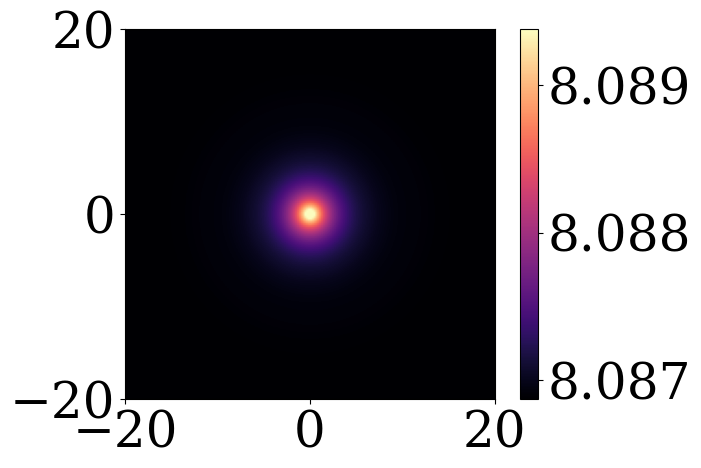

In [81]:
plt.imshow(np.log10(xyprof),extent=[-20,20,-20,20],
            cmap='magma')
    
plt.colorbar()

0
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

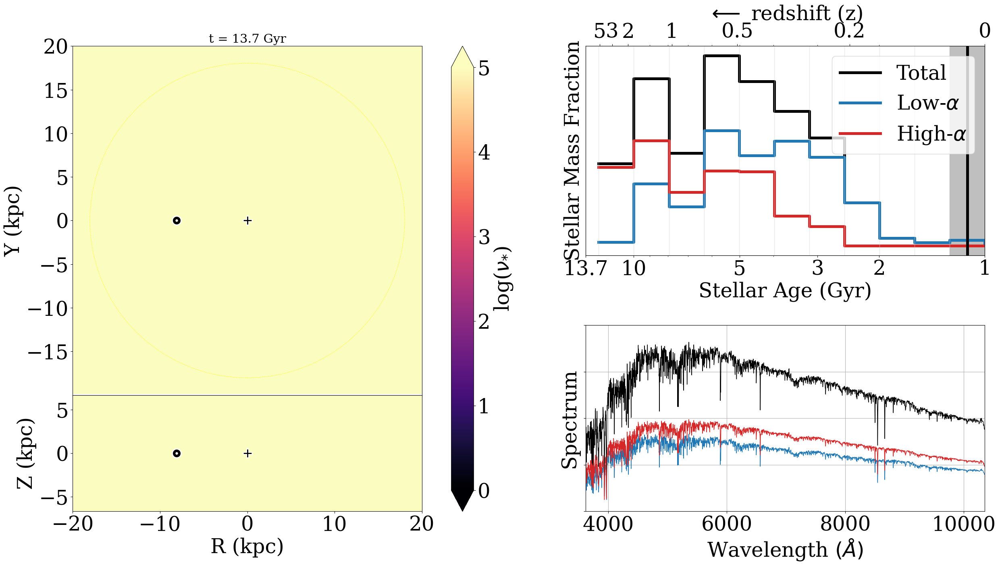

1
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

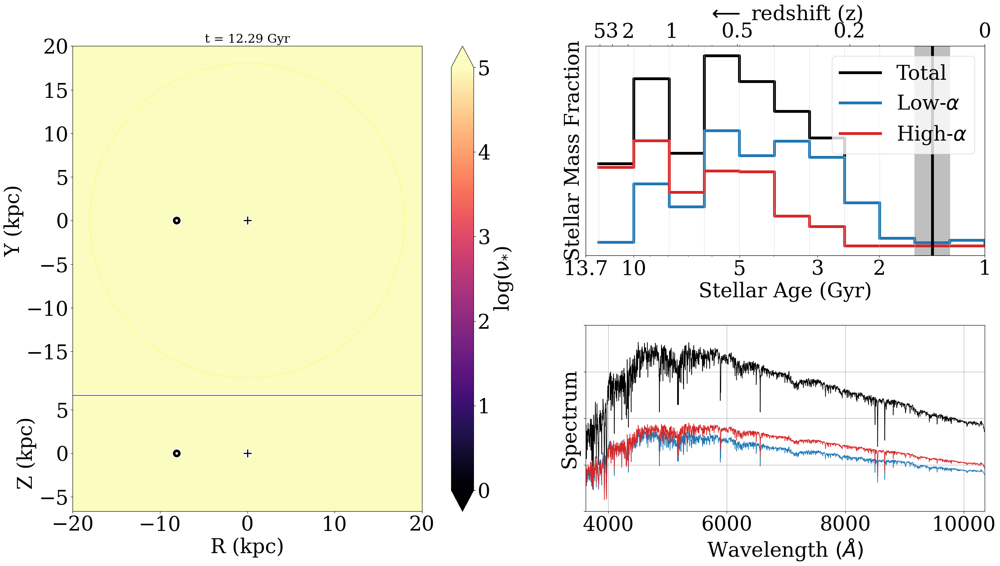

2
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

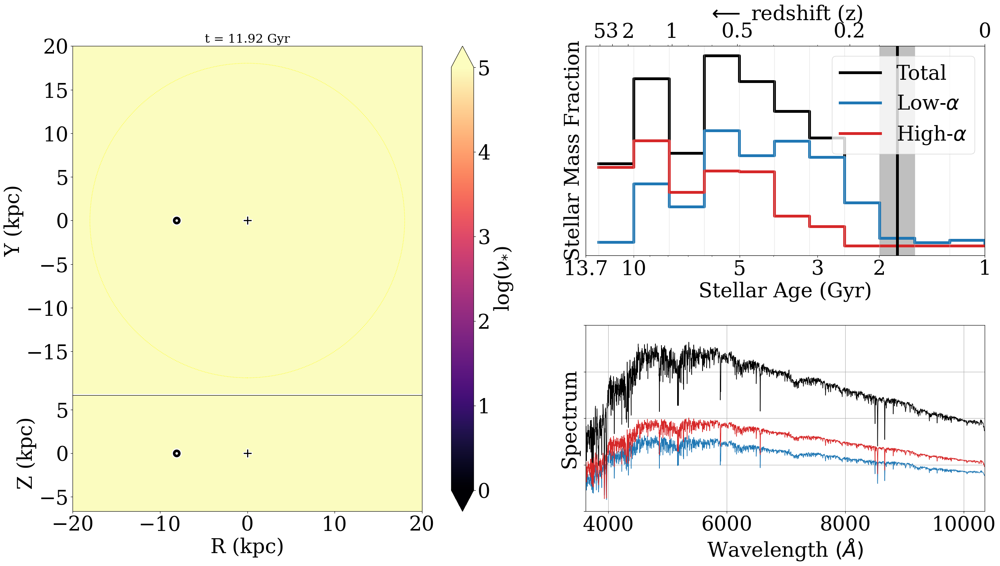

3
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

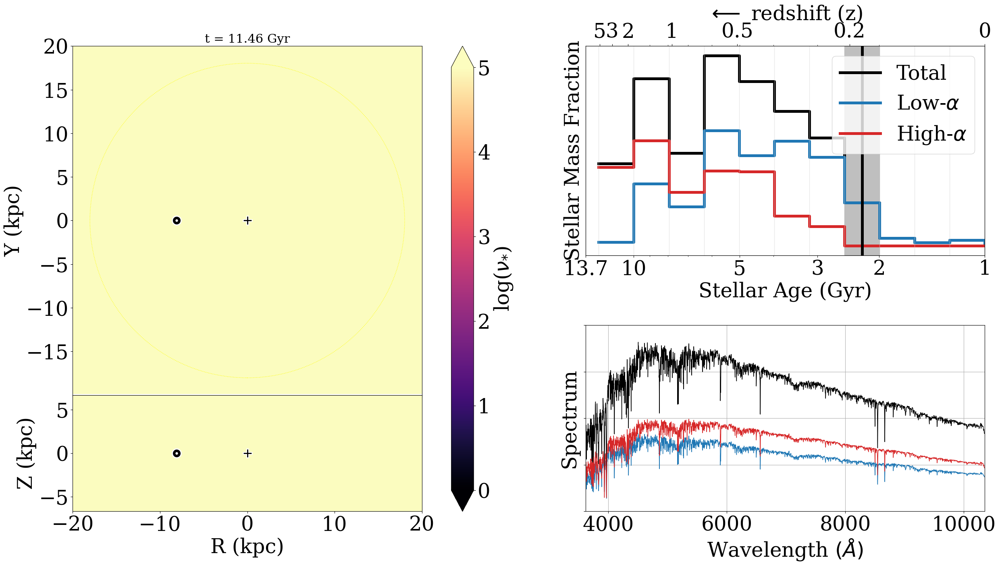

4
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

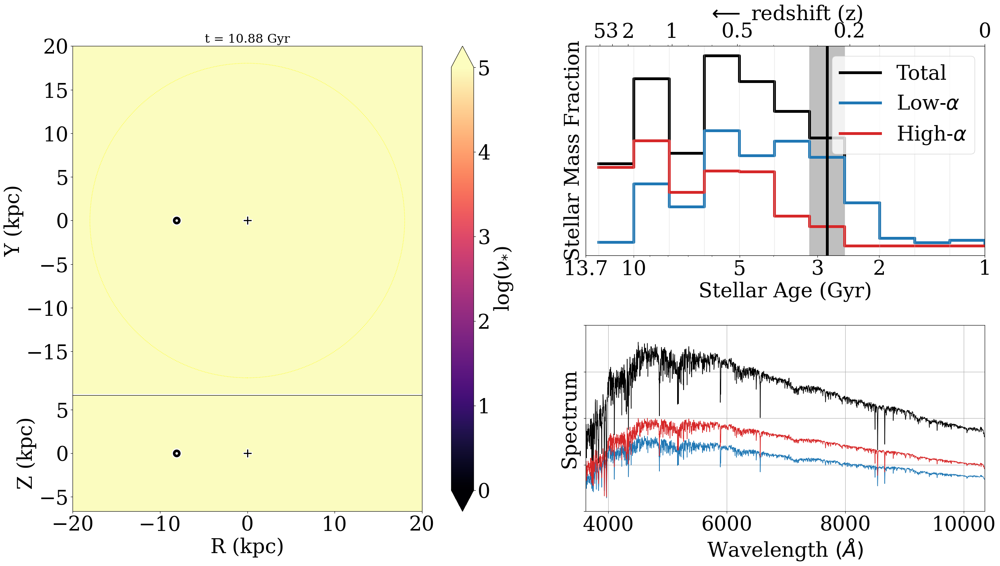

5
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

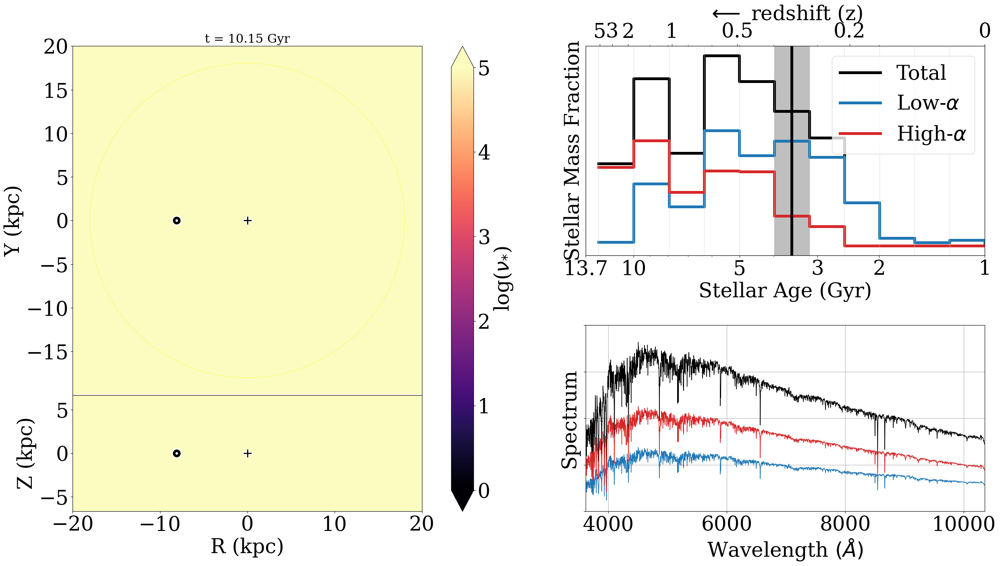

6
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

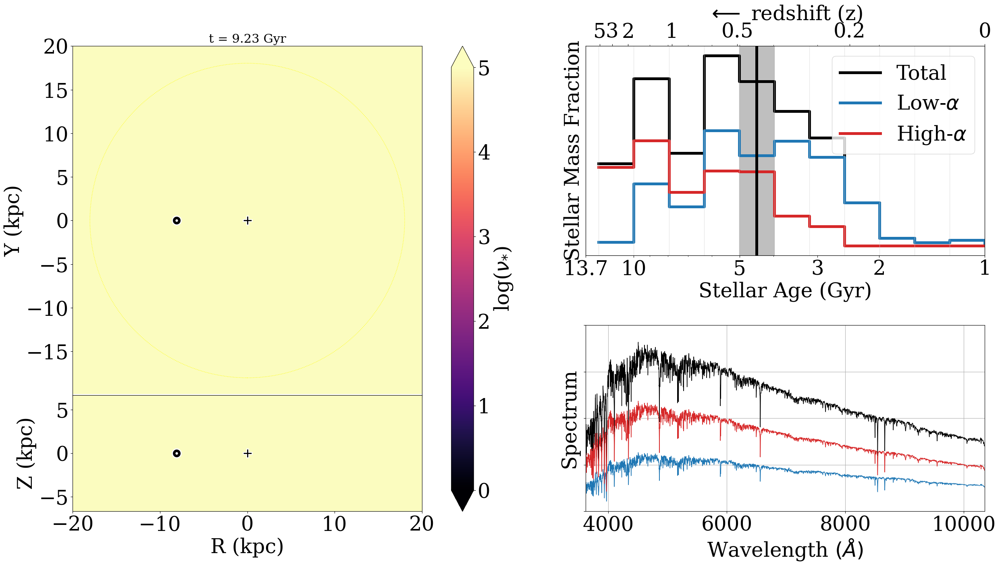

7
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

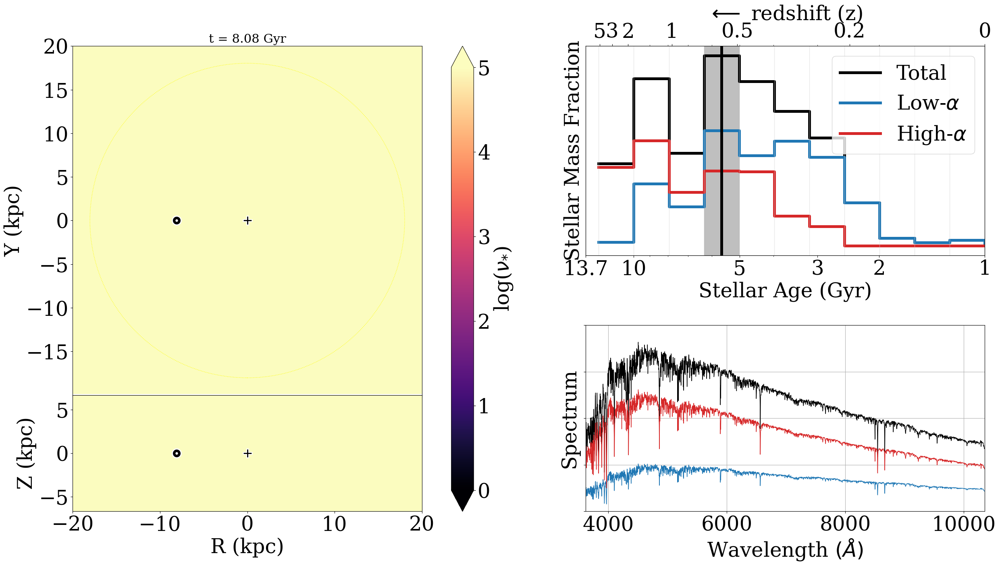

8
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

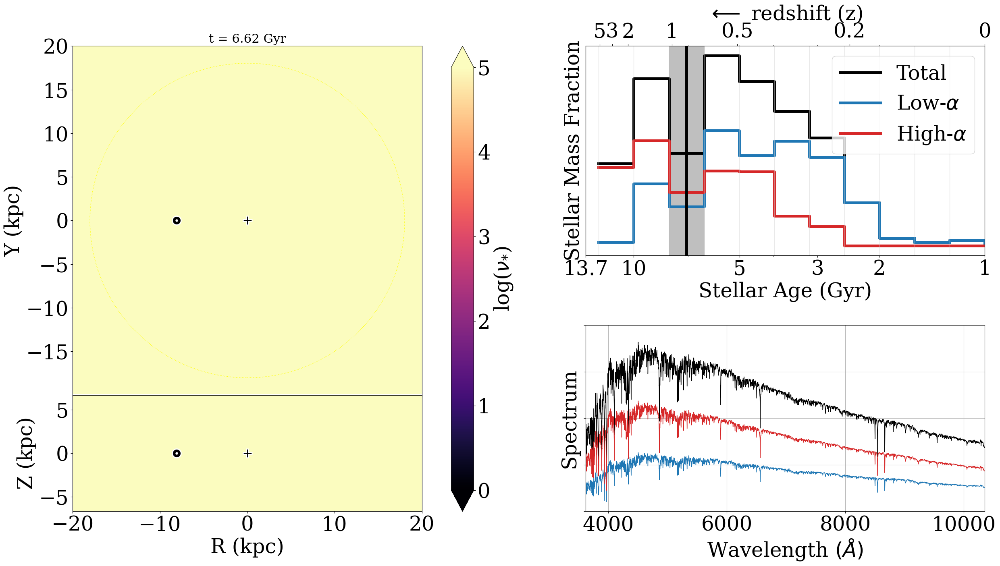

9
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/var

<Figure size 640x480 with 0 Axes>

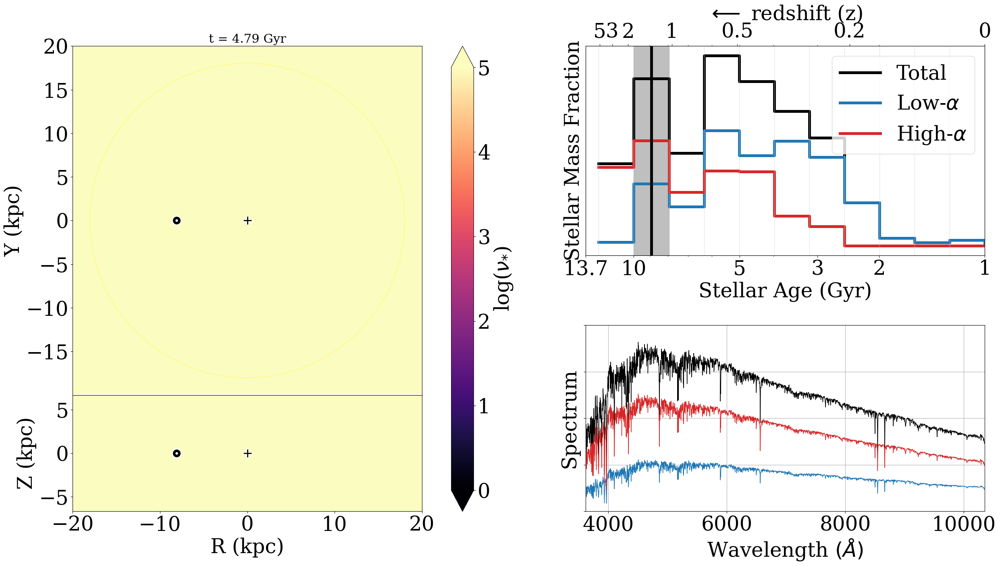

10
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/va

<Figure size 640x480 with 0 Axes>

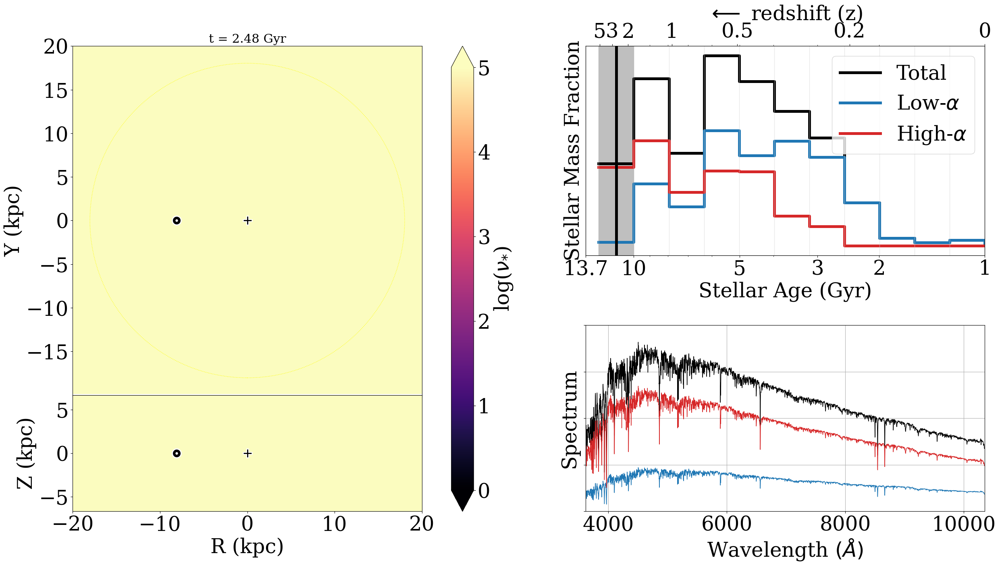

11
/var/folders/pt/4pxym4x563d4rqpwzshf5dkh0001rb/T/ipykernel_54193/3088648471.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  spectrum_ax.set_yticklabels([''])

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:43: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='w',zorder=11,s=300*size,edgecolor='w',label='GC',lw=5*size,snap=False)

/Users/jimig/research/mw_density_imig2024/mw_density/plotting_helpers.py:44: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([0],[0],marker='+',c='k',zorder=12,s=200*size,edgecolor='w',label='GC',lw=2*size,snap=False)

/va

<Figure size 640x480 with 0 Axes>

In [ ]:
for i in range(len(age_bins['center'])):
    print(i)
    current_age = age_bins['center'][i]
    age_window_min = age_bins['min'][i]
    age_window_max = age_bins['max'][i]

    plt.figure(figsize=(30,15))
    
    axis_ratio=(20,35)
    galaxy_ax = plt.subplot2grid(axis_ratio, (0, 0), colspan=15,rowspan=15) #face-on
    galaxy_ax2 = plt.subplot2grid(axis_ratio, (15, 0), colspan=15,rowspan=5) #edge-on
    cax = plt.subplot2grid(axis_ratio, (0, 15), colspan=1,rowspan=20)
    sfh_ax = plt.subplot2grid(axis_ratio, (0, 20), colspan=15,rowspan=9)
    spectrum_ax = plt.subplot2grid(axis_ratio, (12, 20), colspan=15, rowspan=8)

    #========================
    plot_sfh(sfh_ax)
    sfh_ax.axvline(current_age,c='k',lw=5)
    sfh_ax.axvspan(age_window_min,age_window_max,color='gray',alpha=0.5)

    #========================
    spectrum_ax.set_xlabel('Wavelength $(\AA)$')
    spectrum_ax.grid()
    specs = ispec_for_age(current_age)
    max_val = np.max(specs)*1.1
    spectrum_ax.plot(mastar_wls,specs[0]/max_val,c='k')
    spectrum_ax.plot(mastar_wls,specs[1]/max_val,c='tab:blue')
    spectrum_ax.plot(mastar_wls,specs[2]/max_val,c='tab:red')
    spectrum_ax.set_xlim(np.min(mastar_wls),np.max(mastar_wls))
    spectrum_ax.set_ylim(0,1)
    spectrum_ax.set_ylabel('Spectrum')
    spectrum_ax.set_yticklabels([''])

    
    #========================
    #galaxy_ax.set_xlabel('X (kpc)')
    galaxy_ax.set_ylabel('Y (kpc)')
    plotting_helpers.plot_sun_and_GC(ax=galaxy_ax,labels=False)
    galaxy_ax.set_xlim(-20,20)
    galaxy_ax.set_ylim(-20,20)
    mass_prof = mass_img(i)*np.sum(mass_ratio.T[i])
    xyprof = mass_img_r_to_xy(mass_prof)
    
    im=galaxy_ax.imshow(np.log10(xyprof),extent=[-20,20,-20,20],
                  cmap='magma',vmin=0,vmax=5)
    
    plt.colorbar(im,cax=cax,label=r'log($\nu_{*}$)',extend='both')#,orientation='horizontal')

    
    if current_age == age_bins['center'][0]:
        galaxy_ax.set_title('t = 13.7 Gyr')

    else:
        galaxy_ax.set_title('t = {} Gyr'.format(round(13.7-current_age,2)))
        
    galaxy_ax.axhline(-20,c='w',lw=5)
    galaxy_ax.set_xticklabels([''])
    galaxy_ax.set_yticks([-15,-10,-5,0,5,10,15,20])
    
    r_range = np.append(np.linspace(-20,-0.5,90),np.linspace(0.5,20,90))
    r_prof = np.sum(mass_prof,axis=0)

    r_eff = np.polyfit(np.abs(r_range),np.log(r_prof),1)
    r_eff = -1/r_eff[0]
    
    circ = plt.Circle((0, 0), r_eff, facecolor='None',edgecolor='w')
    galaxy_ax.add_patch(circ)

    runsum = 0
    r_half=0
    for ir,r in enumerate(np.abs(r_range)):
        runsum += r_prof[ir]/np.sum(r_prof)
        if (runsum >= 0.95)&(r_half==0):
            r_half = r
    circ = plt.Circle((0, 0), r_half, facecolor='None',edgecolor='yellow',linestyle=':')
    galaxy_ax.add_patch(circ)

    #====================================
    galaxy_ax2.imshow(np.log10(mass_prof),extent=[-20,20,-15,15],
                  cmap='magma',vmin=-2.5,vmax=2.5)
    galaxy_ax2.set_ylabel('Z (kpc)')
    galaxy_ax2.set_xlabel('R (kpc)')
    plotting_helpers.plot_sun_and_GC(ax=galaxy_ax2,labels=False)
    galaxy_ax2.set_ylim(-20,20)

    galaxy_ax2.set_ylim(-40/6,40/6)
    #galaxy_ax2.set_ylim()
    
    #====================================

    plt.subplots_adjust(hspace=0)
    #plt.tight_layout()
    plt.savefig(figure_directory + 'mass_movie/{}.png'.format(12-i),bbox_inches='tight')
    plt.show()
    plt.clf()

In [ ]:
mass_prof.shape

NameError: name 'med_results' is not defined

<Figure size 3000x1700 with 0 Axes>

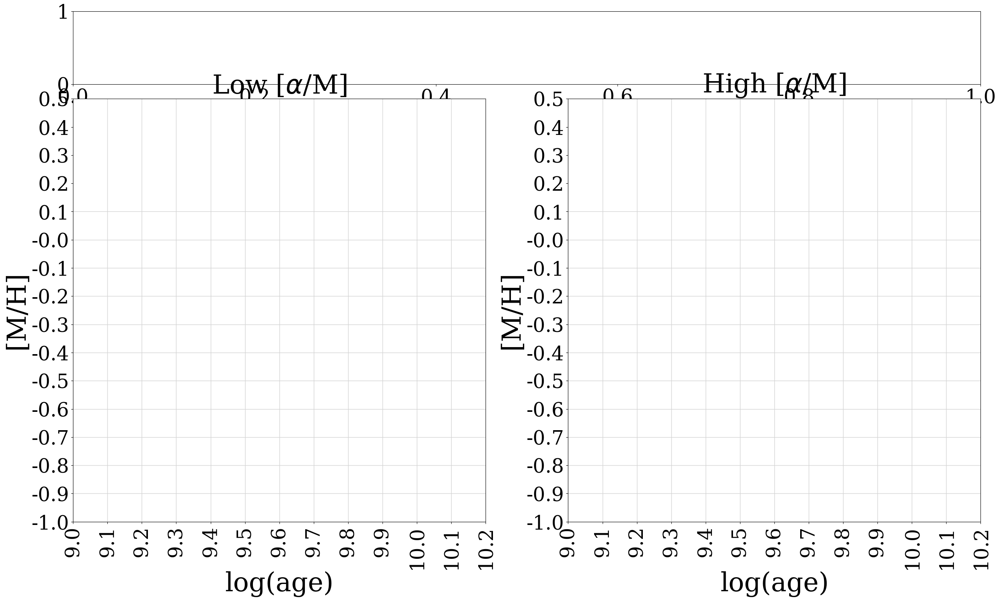

In [44]:
#max results
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'log$(\nu_{\odot})$']
lims = [[-5,5],[0,1.5],[0.1,0.7],[6,15],[0,0.07],[-2.5,-1.5]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]
                     

for i in [-1]:
    plt.figure(figsize=(30,17))
    ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()


    im1=ax1a.imshow(med_results[i][0],origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
    im2=ax1b.imshow(med_results[i][1],origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])
    sum1=np.nansum(10**med_results[i][0])
    sum2= np.nansum(10**med_results[i][1])
    print(sum1,sum2)
    sig1 = np.nansum(10**(med_results[i][0]-0.46))
    sig2 = np.nansum(10**(med_results[i][1]-0.46))

    
    ax1a.set_title(r'Low [$\alpha$/M]')
    ax1b.set_title(r'High [$\alpha$/M]')
    ax1c.set_title(labels[i],fontsize=48)

    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins_center)))
        ax.set_yticks(np.arange(len(feh_bins_center)))
        ax.set_xticklabels([round(a,1) for a in age_bins_center])
        ax.set_yticklabels([round(a,2) for a in feh_bins_center])
        ax.set_ylim(-0.5,len(feh_bins_max)-0.5)
        ax.set_xlim(-0.5,len(age_bins_max)-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i_aa in range(len(age_bins_center)):
            ax.axvline(i_aa-0.5,c='lightgray')
            ax.axhline(i_aa-0.5,c='lightgray')
        

    plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    lowstr = r'Total $\nu_\odot$ = ' + str(round(sum1,2)) + r'$\pm$' + str(round(sig1,2)) + r' kpc$^{-3}$'
    highstr = r'Total $\nu_\odot$ = ' + str(round(sum2,2)) + r'$\pm$'+ str(round(sig2,2)) + r' kpc$^{-3}$'
    txt1=ax1a.text(0,9,lowstr,ha='left',va='top',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])
    txt1=ax1b.text(0,9,highstr,ha='left',va='top',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])

    plt.tight_layout()
    #plt.savefig('paper_figs/param5.png')
    plt.show()

NameError: name 'max_results' is not defined

<Figure size 3000x1700 with 0 Axes>

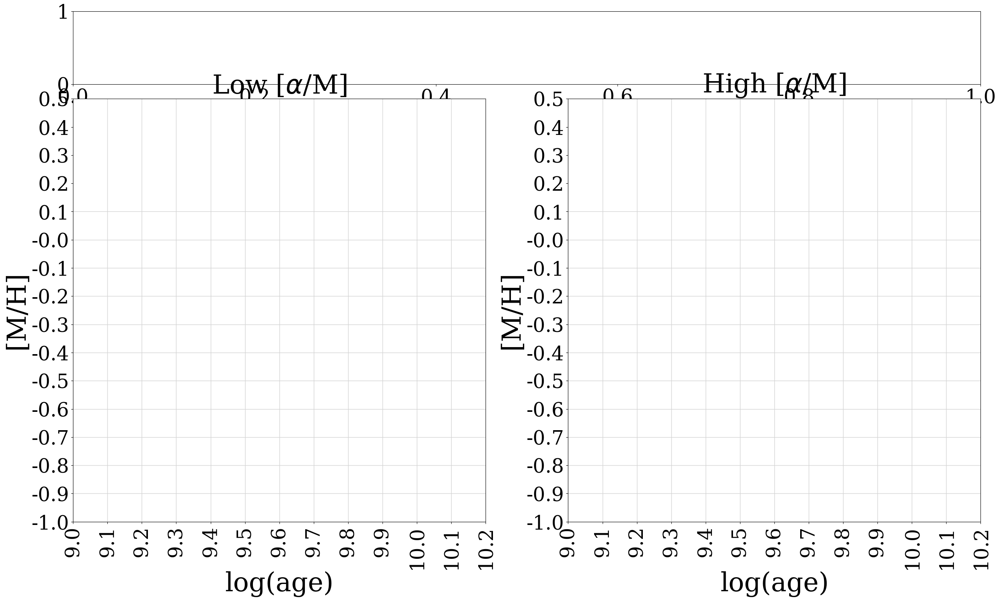

In [46]:
#max results
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'$\nu_0$*mass_ratio']
lims = [[-5,5],[0,1.5],[0.1,0.7],[6,15],[0,0.07],[0,10]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]
                     

for i in [-1]:
    plt.figure(figsize=(30,17))
    ax1a, ax1b, ax1c = plotting_helpers.setup_bin_axes()

    im1=ax1a.imshow((10**max_results[i][0])*mass_ratio,origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
    im2=ax1b.imshow((10**max_results[i][1])*mass_ratio,origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])

    ax1a.set_title(r'Low [$\alpha$/M]')
    ax1b.set_title(r'High [$\alpha$/M]')
    ax1c.set_title(labels[i],fontsize=48)

    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins_center)))
        ax.set_yticks(np.arange(len(feh_bins_center)))
        ax.set_xticklabels([round(a,1) for a in age_bins_center])
        ax.set_yticklabels([round(a,2) for a in feh_bins_center])
        ax.set_ylim(-0.5,len(feh_bins_max)-0.5)
        ax.set_xlim(-0.5,len(age_bins_max)-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i in range(len(age_bins_center)):
            ax.axvline(i-0.5,c='lightgray')
            ax.axhline(i-0.5,c='lightgray')
        

    plt.colorbar(im1,cax=ax1c,orientation='horizontal')

    plt.tight_layout()
    plt.show()

In [47]:
print(coord.Galactocentric.z_sun)

None


In [55]:
N_obs = []
N_model = []
r_array_column = []
r_prof_column = []
r_prof_column_log = []
total_mass_column = []
min_age = []
max_age = []
min_feh = []
max_feh = []

r_samp = np.linspace(1e-30,30,500)
z_samp = np.linspace(1e-30,30,500)
r_profs = np.zeros((len(age_bins['center']),len(mh_bins['center']),2,len(r_samp)))

cntr=0
e_cntr=0
for i_alpha in [0,1]:
    for i_f in range(len(mh_bins['center'])):
            for i_a in range(len(age_bins['center'])):
                min_age.append(round(age_bins['min'][i_a],2))
                max_age.append(round(age_bins['max'][i_a],2))
                min_feh.append(round(mh_bins['min'][i_f],2))
                max_feh.append(round(mh_bins['max'][i_f],2))

                d = density_params[cntr]
                cntr+=1
                test_params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]
                
                if np.isfinite(test_params[0]):
                    r_prof_0 = combined_exp_profile_nonsmoothed_linear(test_params,r_samp,
                                                                (26/1000)*np.ones(len(r_samp)))
                else:
                    r_prof_0 = np.ones(len(r_samp))*np.nan
                   
                
                # Model number counts
                tot_num_r = []
                
                if cnter > 143:
                    e_cntr = 0
                    
                bin_effsel = effsel[e_cntr]
                e_cntr+=1

                effsel_mask = np.isfinite(bin_effsel.flatten())
                bin_effsel_rs = effsel_rs[effsel_mask]
                bin_effsel_zs = effsel_zs[effsel_mask]
                bin_effsel = bin_effsel.flatten()[effsel_mask]

                model_effsel = combined_exp_profile_nonsmoothed_linear(test_params,
                                                                       bin_effsel_rs,
                                                                       bin_effsel_zs)
                model_n = np.nansum(model_effsel*bin_effsel)
                N_model.append(model_n)
                
                # Add radial profile to column
                r_profs[i_a][i_f][i_alpha] = r_prof_0
                r_prof_column.append(r_prof_0)
                r_prof_column_log.append(np.log10(r_prof_0))
                r_array_column.append(r_samp)

                # Count Stars = N_obs
                m = (ages>=age_bins['min'][i_a])&(ages<=age_bins['max'][i_a])
                m = m &(metals>=mh_bins['min'][i_f])&(metals<=mh_bins['max'][i_f])        
                if i_alpha == 0: 
                    #m = m&low_alph_mask
                    m=m&(apogee_sample['ALPHA_BIN']=='LOW')
                else:
                    #m = m&high_alph_mask
                    m=m&(apogee_sample['ALPHA_BIN']=='HIGH')

                N_obs.append(len(m[m]))
                
                print(N_obs[-1],N_model[-1])
                
                data_r_samp = data_rs[m]
                data_z_samp = data_zs[m]
                
    

0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
0 --
9 --
15 --
32 --
183 0.0
348 0.0
400 0.0
270 0.0
168 0.0
126 0.0
97 --
41 --
14 --
30 --
57 --
147 0.0
514 0.0
987 0.0
1183 0.0
1167 0.0
953 0.0
557 0.0
429 0.0
115 0.0
51 --
76 --
190 0.0
403 0.0
959 0.0
1932 0.0
2227 0.0
2277 0.0
2162 0.0
1415 0.0
819 0.0
222 0.0
67 --
198 0.0
390 0.0
641 0.0
1478 0.0
2525 0.0
2747 0.0
2758 0.0
2362 0.0
1544 0.0
798 0.0
183 0.0
55 --
331 0.0
661 0.0
988 0.0
1872 0.0
3024 0.0
2993 0.0
2723 0.0
2424 0.0
1808 0.0
902 0.0
258 0.0
66 --
593 0.0
827 0.0
1285 0.0
2223 0.0
3020 0.0
2762 0.0
2309 0.0
2479 0.0
2235 0.0
1132 0.0
315 0.0
69 --
629 0.0
757 0.0
845 0.0
1608 0.0
2158 0.0
2046 0.0
2019 0.0
2543 0.0
2711 0.0
1497 0.0
424 0.0
74 --
378 0.0
493 0.0
574 0.0
1185 0.0
1777 0.0
1808 0.0
2088 0.0
2898 0.0
3091 0.0
1537 0.0
396 0.0
110 0.0
307 0.0
382 0.0
381 0.0
631 0.0
1219 0.0
1

In [ ]:
# colums to add!
# N-obs, n_model, mass_to_N ...ratio effsel... r bins and r prof
# rename nu...

# Make New Parameters Table, with extra info

In [59]:
from astropy.table import Column

ca1 = Column(density_params['ALPHA_M'], name = 'ALPHA_M',
            description = 'alpha-group of the population')
ca2 = Column(density_params['M_H'], name = 'M_H',
            description = 'Central metallicity of the population', unit = 'dex')

ca3 = Column(density_params['AGE'], name = 'AGE',
            description = 'Central age of the bin', unit = 'Gyr')
ca4 = Column(np.array([round(x,1) for x in np.log10(np.array(density_params['AGE'])*1.0e9)]), name = 'LOG_AGE',
            description = 'Central age of the bin (log)', unit = 'log10(yr)')

ca5 = Column(N_obs, name = 'N_STARS_OBS',
            description = 'Number of stars in the population')

ca6 = Column(min_age, name = 'MIN_AGE',
            description = 'Minimum age of the bin',  unit = 'Gyr')
ca7 = Column(max_age, name = 'MAX_AGE',
            description = 'Maximum age of the bin',  unit = 'Gyr')
ca8 = Column(min_feh, name = 'MIN_M_H',
            description = 'Minimum [M/H] of the bin',  unit = 'dex')
ca9 = Column(max_feh, name = 'MAX_M_H',
            description = 'Maximum [M/H] of the bin',  unit = 'dex')


c1 = Column(np.array(density_params['HR_IN']), name = 'HR_IN',
            description = 'Inner disk scale length', unit = 'kpc')
c1e = Column(np.array(density_params['HR_IN_ERR']), name = 'HR_IN_ERR',
            description = 'Uncertaintiy in inner disk scale length', unit = 'kpc')

c2 = Column(np.array(density_params['HR_OUT']), name = 'HR_OUT',
            description = 'Outer disk scale length', unit = 'kpc')
c2e = Column(np.array(density_params['HR_OUT_ERR']), name = 'HR_OUT_ERR',
            description = 'Uncertaintiy in outer disk scale length', unit = 'kpc')

c3 = Column(np.array(density_params['R_BREAK']), name = 'R_BREAK',
            description = 'Break Radius', unit = 'kpc')
c3e = Column(np.array(density_params['R_BREAK_ERR']), name = 'R_BREAK_ERR',
            description = 'Uncertaintiy in break radius', unit = 'kpc')

c4 = Column(np.array(density_params['H_Z']), name = 'H_Z',
            description = 'Scale height measured at R_Sun', unit = 'kpc')
c4e = Column(np.array(density_params['H_Z_ERR']), name = 'H_Z_ERR',
            description = 'Uncertainty in scale height', unit = 'kpc')

c5 = Column(np.array(density_params['A_FLARE']), name = 'A_FLARE',
            description = 'Linear flaring term', unit = 'None')

c5e = Column(np.array(density_params['A_FLARE_ERR']), name = 'A_FLARE_ERR',
            description = 'Uncertainty in linear flaring term', unit = 'None')

c6 = Column(np.array(density_params['NU_0']), name = 'LOG_10_NU0',
            description = 'Number Density at R_Sun', unit = 'kpc^-3')

c6e = Column(np.array(density_params['NU_0_ERR']), name = 'LOG_10_NU0_ERR',
            description = 'Uncertainty in  number Density at R_Sun', unit = 'kpc^-3')

    
pc2 = Column(r_prof_column, name = 'R_PROF_AT_Z0',
            description = 'Number Density Radial Profile at midplane Z=0', unit = 'kpc^-3')
pc3 = Column(r_prof_column_log, name = 'LOG10_R_PROF_AT_Z0',
            description = 'log10(Number Density) Radial Profile at midplane Z=0', unit = 'log10(kpc^-3)')

pc1 = Column(r_array_column, name = 'R_ARRAY',
            description = 'Radius array corresponding to R_PROF_AT_Z0 profile', unit = 'kpc')


t = Table()

for col in [ca1,ca2,ca3,ca4,ca5,ca6,ca7,ca8,ca9,
            c1,c1e,c2,c2e,c3,c3e,c4,c4e,c5,c5e,c6,c6e,
            pc1,pc2,pc3
           ]:
    t.add_column(col)
    
t.write('density_params_ext.fits',format='fits', overwrite=True)

/Users/jimig/anaconda3/lib/python3.10/site-packages/astropy/io/fits/convenience.py:607: AstropyUserWarning: The unit 'dex' could not be saved in native FITS format and cannot be recovered in reading. It can roundtrip within astropy by using QTable both to write and read back, though one has to enable the unit before reading.
  warnings.warn(warning, AstropyUserWarning)

/Users/jimig/anaconda3/lib/python3.10/site-packages/astropy/units/core.py:2123: UnitsWarning: 'log10(yr)' did not parse as fits unit: At col 0, Unit 'log' not supported by the FITS standard.  If this is meant to be a custom unit, define it with 'u.def_unit'. To have it recognized inside a file reader or other code, enable it with 'u.add_enabled_units'. For details, see https://docs.astropy.org/en/latest/units/combining_and_defining.html
  warnings.warn(msg, UnitsWarning)

/Users/jimig/anaconda3/lib/python3.10/site-packages/astropy/units/core.py:2123: UnitsWarning: 'None' did not parse as fits unit: At col 0, Unit 'None'

In [60]:
i=100
print(density_params['M_H'][i],density_params['LOG_AGE'][i],N_obs[i])

-0.15 9.5 3020


In [ ]:
# Coordinates for Effective Seleciton Function
effsel_glons = np.array([rawsel.glonGlat(x)[0][0] for x in rawsel._locations])
effsel_glats = np.array([rawsel.glonGlat(x)[1][0] for x in rawsel._locations])
distbins = ds*1000

effsel_lons = []
effsel_lats = []
effsel_dist = []

for loc_i in range(len(rawsel._locations)):
    for dist_i in range(len(distbins)):
        effsel_lons.append(effsel_glons[loc_i])
        effsel_lats.append(effsel_glats[loc_i])
        effsel_dist.append(distbins[dist_i])
        
effsel_lons = np.array(effsel_lons)
effsel_lats = np.array(effsel_lats)
effsel_dist = np.array(effsel_dist)

effsel_coords = coord.SkyCoord(l=effsel_lons * u.degree, 
                               b=effsel_lats * u.degree, 
                               distance=effsel_dist * u.pc, frame='galactic')

effsel_coords = effsel_coords.transform_to(coord.Galactocentric)

effsel_xs = effsel_coords.x/1000/u.pc
effsel_ys = effsel_coords.y/1000/u.pc
effsel_zs = effsel_coords.z/1000/u.pc
effsel_rs = np.sqrt((effsel_xs**2.0)+(effsel_ys**2.0))


In [ ]:
i=100
i_a=4
i_f =8
i_alpha=0

m = (ages>=age_bins_min[i_a])&(ages<=age_bins_max[i_a])
m = m &(metals>=feh_bins_min[i_f])&(metals<=feh_bins_max[i_f])        
if i_alpha == 0: 
    m = m&low_alph_mask
else:
    m = m&high_alph_mask
    
data_r_samp = np.copy(data_rs[m])
data_z_samp = np.copy(data_zs[m])

print(density_params['M_H'][i],density_params['LOG_AGE'][i],N_obs[i])
print(N_model[i],np.nanmean(effsel[i]), N_model[i]/np.nanmean(effsel[i]))


d=density_params[i]
test_params = [1.0/d['HR_IN'], 1.0/d['HR_OUT'], d['H_Z'], 
                   d['R_BREAK'], d['A_FLARE'], d['NU_0']]

bin_effsel = effsel[i] 
effsel_mask = (bin_effsel.flatten()!=0)&(np.isfinite(bin_effsel.flatten()))
bin_effsel_rs = effsel_rs[effsel_mask]
bin_effsel_zs = effsel_zs[effsel_mask]
bin_effsel = bin_effsel.flatten()[effsel_mask]


print("=="*50)
print(f"LOG PROB FROM FUNC: {log_probability(test_params,combined_exp_profile_nonsmoothed_linear,data_r_samp,data_z_samp,bin_effsel,bin_effsel_rs,bin_effsel_zs)}")


# WITH DATA
dens_obs = combined_exp_profile_nonsmoothed_linear(test_params, data_r_samp, data_z_samp)
print(f"DENS OBS: {np.nansum(dens_obs)}")

#WITH EFFSEL??
#log_likelihood = np.nansum(log_dens-np.ones(len(log_dens))*effective_volume)

dens_effsell = combined_exp_profile_nonsmoothed_linear(test_params, bin_effsel_rs, bin_effsel_zs)
print(f"DENS EFFSEL: {np.nansum(dens_effsell)}")

effective_volume = np.nansum(dens_effsell*bin_effsel)
print(f"EFFVOL: {effective_volume}")
#print(np.nansum(log_dens_effsell*effective_volume))
print(f"LOG DENS EFFSEL*EFFVOL: {np.nansum(dens_effsell*effective_volume)}")



In [ ]:
plt.hist(data_r_samp.value)
plt.xlabel('r')
#plt.plot(r_array_column[i],r_prof_column[i])
#plt.yscale('log')
plt.show()

In [ ]:
plt.scatter(N_obs, N_model)
plt.show()

In [ ]:
t=np.nansum([10**max_results[-1][0],10**max_results[-1][1]],axis=0)

plt.figure(figsize=(20,20))
plt.imshow(t*mass_ratio,origin='lower')
plt.xticks(np.arange(len(age_bins_center)),[round(a,1) for a in age_bins_center])
plt.yticks(np.arange(len(feh_bins_center)),[round(a,2) for a in feh_bins_center])
plt.ylim(-0.5,len(feh_bins_max)-0.5)
plt.xlim(-0.5,len(age_bins_max)-0.5)
plt.title('total mass')
plt.ylabel('[Fe/H]')
plt.xlabel('Age')
plt.colorbar(label=r'Total stellar mass per giant ($M_{\odot}$)')
plt.show()

hist1=np.nansum(t*mass_ratio,axis=0)
hist2=np.nansum((10**max_results[-1][0])*mass_ratio,axis=0)
hist3=np.nansum((10**max_results[-1][1])*mass_ratio,axis=0)

plt.plot(age_bins_center,hist1,drawstyle='steps-mid',c='k')
plt.plot(age_bins_center,hist2,drawstyle='steps-mid',c='tab:blue')
plt.plot(age_bins_center,hist3,drawstyle='steps-mid',c='tab:red')

plt.show()

In [ ]:
print('MASS?? -> MAX')
lowm = np.nansum((10**max_results[-1][0])*mass_ratio)
highm = np.nansum((10**max_results[-1][1])*mass_ratio)
print(lowm,highm,highm/lowm)


print('MASS?? -> MED')
lowm = np.nansum((10**med_results[-1][0])*mass_ratio)
highm = np.nansum((10**med_results[-1][1])*mass_ratio)
print(lowm,highm,highm/lowm)



print('RAW NUMS')
one = len(low_alph_mask[low_alph_mask])
two = len(low_alph_mask[high_alph_mask])
print(one,two,two/one)

In [ ]:
r_samp = np.linspace(1e-10,20,500)
z_samp = np.linspace(1e-10,5,500)

r_profs = np.zeros((len(age_bins_center),len(feh_bins_center),2,len(r_samp)))

for i_alpha in [0,1]:
    for i_a in range(len(age_bins_center)):
            for i_f in range(len(feh_bins_center)):
                r_profs_z = np.zeros((len(z_samp),len(r_samp)))

                test_params = np.copy(med_results.T[i_a][i_f][i_alpha])
                if np.isfinite(test_params[0]):
                    for i_z,z in enumerate(z_samp):
                        m = combined_exp_profile_nonsmoothed_linear(test_params,r_samp,
                                                                z*np.ones(len(r_samp)))
                        if (np.sum(m)<=1e3)&(np.sum(np.isfinite(m))==len(r_samp)):
                            r_profs_z[i_z] = m#*mass_ratio[i_f][i_a]
                            
                    r_prof = np.trapz(r_profs_z, x=z_samp, axis=0)
                    r_profs[i_a][i_f][i_alpha] = r_prof
                    
tot_r_samp = np.zeros(len(r_samp))
low_r_samp = np.zeros(len(r_samp))
high_r_samp = np.zeros(len(r_samp))

for i_a in range(len(age_bins_center)):
    for i_f in range(len(feh_bins_center)):
        if np.isfinite(r_profs[i_a][i_f][0][0]):
            low_r_samp+=r_profs[i_a][i_f][0]*mass_ratio[i_f][i_a]
            tot_r_samp+=r_profs[i_a][i_f][0]*mass_ratio[i_f][i_a]
        if np.isfinite(r_profs[i_a][i_f][1][0]):
            high_r_samp+=r_profs[i_a][i_f][1]*mass_ratio[i_f][i_a]
            tot_r_samp+=r_profs[i_a][i_f][1]*mass_ratio[i_f][i_a]


In [ ]:
plt.plot(r_samp,tot_r_samp,c='k')
plt.plot(r_samp,low_r_samp,c='tab:blue')
plt.plot(r_samp,high_r_samp,c='tab:red')

pf = np.polyfit(r_samp,np.log(tot_r_samp), 1)
print(-1/pf)

plt.yscale('log')


In [ ]:
SMD = np.ones((2,len(age_bins_center),len(feh_bins_center)))*np.inf
solar_i = np.where(r_samp>=8.3)[0][0]

for i_a in range(len(age_bins_center)):
    for i_f in range(len(feh_bins_center)):
        if np.isfinite(r_profs[i_a][i_f][0][0]):
            SMD[0][i_a][i_f] = r_profs[i_a][i_f][0][solar_i]*mass_ratio[i_f][i_a]
        if np.isfinite(r_profs[i_a][i_f][1][0]):
            SMD[1][i_a][i_f] = r_profs[i_a][i_f][1][solar_i]*mass_ratio[i_f][i_a]

In [ ]:
solar_i = np.where(r_samp>=8.3)[0][0]

#max results
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'$\nu_0$']
lims = [[-5,5],[0,1.5],[0.1,0.7],[6,15],[0,0.07],[-1.5,0.5]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]
                     

for i in [-1]:
    plt.figure(figsize=(20,10))
    ax1a, ax1b, ax1c = setup_bin_axes()

    
    thesum = np.sum(SMD)
    sum1 = np.nansum(SMD[0])
    sum2 = np.nansum(SMD[1])
    sig1 = 0.25*sum1
    sig2 = 0.25*sum2

    print(thesum)
    im1=ax1a.imshow(np.log10(SMD[0].T),origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
    im2=ax1b.imshow(np.log10(SMD[1].T),origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])

    ax1a.set_title(r'Low [$\alpha$/M]')
    ax1b.set_title(r'High [$\alpha$/M]')
    ax1c.set_title('Surface Mass Density $\log(\Sigma(R_\odot))$',fontsize=48)

    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins_center)))
        ax.set_yticks(np.arange(len(feh_bins_center)))
        ax.set_xticklabels([round(a,1) for a in age_bins_center])
        ax.set_yticklabels([round(a,2) for a in feh_bins_center])
        ax.set_ylim(-0.5,len(feh_bins_max)-0.5)
        ax.set_xlim(-0.5,len(age_bins_max)-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i in range(len(age_bins_center)):
            ax.axvline(i-0.5,c='lightgray')
            ax.axhline(i-0.5,c='lightgray')
        

    lowstr = r'Total $\Sigma(R_{\odot})$ = ' + str(round(sum1,2)) + r'$\pm$' + str(round(sig1,2)) + r' $M_\odot$ pc$^{-2}$'
    highstr = r'Total $\Sigma(R_{\odot})$ = ' + str(round(sum2,2)) + r'$\pm$'+ str(round(sig2,2)) + r' $M_\odot$ pc$^{-2}$'
    txt1=ax1a.text(0,10.5,lowstr,ha='left',va='bottom',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])
    txt1=ax1b.text(0,10.5,highstr,ha='left',va='bottom',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])
    plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    plt.tight_layout()
    plt.savefig(figure_directory + 'smd.png')
    plt.show()



In [ ]:
print('Total mass ratio')
print(np.trapz(high_r_samp,x=r_samp)/np.trapz(low_r_samp,x=r_samp))

print('At Sun')
i = np.where(r_samp>8.3)[0][0]
print(high_r_samp[i]/low_r_samp[i])


In [ ]:
totmass_2 = np.ones((2,len(age_bins_center),len(feh_bins_center)))*np.inf

for i_a in range(len(age_bins_center)):
    for i_f in range(len(feh_bins_center)):
        if np.isfinite(r_profs[i_a][i_f][0][0]):
            totmass_2[0][i_a][i_f] = mass_ratio[i_f][i_a]*np.trapz(r_profs[i_a][i_f][0],x=r_samp)
        if np.isfinite(r_profs[i_a][i_f][1][0]):
            totmass_2[1][i_a][i_f] = mass_ratio[i_f][i_a]*np.trapz(r_profs[i_a][i_f][1],x=r_samp)

In [ ]:
#max results
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'$\nu_0$']
lims = [[-5,5],[0,1.5],[0.1,0.7],[6,15],[0,0.07],[0,2]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]
                     

for i in [-1]:
    plt.figure(figsize=(20,10))
    ax1a, ax1b, ax1c = setup_bin_axes()

    
    thesum = np.sum(totmass_2)
    sum1 = np.nansum(totmass_2[0])
    sum2 = np.nansum(totmass_2[1])

    print(thesum)
    im1=ax1a.imshow(np.log10(totmass_2[0].T),origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
    im2=ax1b.imshow(np.log10(totmass_2[1].T),origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])

    ax1a.set_title(r'Low [$\alpha$/M]')
    ax1b.set_title(r'High [$\alpha$/M]')
    ax1c.set_title('Total Mass',fontsize=48)

    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins_center)))
        ax.set_yticks(np.arange(len(feh_bins_center)))
        ax.set_xticklabels([round(a,1) for a in age_bins_center])
        ax.set_yticklabels([round(a,2) for a in feh_bins_center])
        ax.set_ylim(-0.5,len(feh_bins_max)-0.5)
        ax.set_xlim(-0.5,len(age_bins_max)-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i in range(len(age_bins_center)):
            ax.axvline(i-0.5,c='lightgray')
            ax.axhline(i-0.5,c='lightgray')
        
 
    plt.colorbar(im1,cax=ax1c,orientation='horizontal')

    plt.tight_layout()
    plt.show()

In [ ]:
total = np.nansum(totmass_2)
low = np.nansum(totmass_2.T.T[0])
high = np.nansum(totmass_2.T.T[1])

print(total,low,high)
print(low/total)

In [ ]:
#max results
labels = [r'h$_{r,in}$', r'h$_{r,out}$',r'h$_{z,0}$', r'r$_{break}$',r'A$_{flare}$',r'$\nu_0$']
lims = [[-5,5],[0,1.5],[0.1,0.7],[6,15],[0,0.07],[7,9.5]]
#lims = [[-1,1],[0,1.0],[0.1,1.0],[0,15],[0,0.05],[0,10]]

total_mass = 10**11.3822587979

for i in [-1]:
    plt.figure(figsize=(20,10))
    ax1a, ax1b, ax1c = setup_bin_axes()
    
    thesum = np.sum(totmass_2)
    print(thesum)
    tmp1 = totmass_2[0].T/thesum
    tmp2 = totmass_2[1].T/thesum
    for ti in range(len(tmp1)):
        for tj in range(len(tmp2[ti])):
            if tmp1[ti][tj] ==0:
                tmp1[ti][tj] = np.nan
            if tmp2[ti][tj] ==0:
                tmp2[ti][tj] =np.nan
        
    im1=ax1a.imshow(np.log10(tmp1*total_mass),origin='lower',
              vmin=lims[i][0],vmax=lims[i][1])
    im2=ax1b.imshow(np.log10(tmp2*total_mass),origin='lower',
               vmin=lims[i][0],vmax=lims[i][1])

    ax1a.set_title(r'Low [$\alpha$/M]')
    ax1b.set_title(r'High [$\alpha$/M]')
    ax1c.set_title('log($M_*$)',fontsize=48)
    
    sum1=np.nansum(tmp1*total_mass)/1e10
    sum2=np.nansum(tmp2*total_mass)/1e10
    sig1 = 0.47
    sig2 = 0.45

    
    for ax in [ax1a,ax1b]:
        ax.set_xticks(np.arange(len(age_bins_center)))
        ax.set_yticks(np.arange(len(feh_bins_center)))
        ax.set_xticklabels([round(a,1) for a in age_bins_center])
        ax.set_yticklabels([round(a,2) for a in feh_bins_center])
        ax.set_ylim(-0.5,len(feh_bins_max)-0.5)
        ax.set_xlim(-0.5,len(age_bins_max)-0.5)
        ax.set_xlabel('Age (Gyr)')
        ax.set_ylabel('[M/H]')

        for i in range(len(age_bins_center)):
            ax.axvline(i-0.5,c='lightgray')
            ax.axhline(i-0.5,c='lightgray')
        

    plt.colorbar(im1,cax=ax1c,orientation='horizontal')
    lowstr = r'Total $M_{*}$ = ' + str(round(sum1,2)) + r'$\pm$' + str(round(sig1,2)) + r' $\times 10^{10} M_\odot$'
    highstr = r'Total $M_{*}$ = ' + str(round(sum2,2)) + r'$\pm$'+ str(round(sig2,2)) + r' $\times 10^{10} M_\odot$'
    txt1=ax1a.text(0,10.5,lowstr,ha='left',va='bottom',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])
    txt1=ax1b.text(0,10.5,highstr,ha='left',va='bottom',fontsize=36)
    txt1.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])

    plt.tight_layout()
    plt.savefig(figure_directory + 'param_totmass.png',bbox_inches='tight')
    
    plt.show()

In [ ]:
#EFFSEL COORDS
effsel_glons = np.array([rawsel.glonGlat(x)[0][0] for x in rawsel._locations])
effsel_glats = np.array([rawsel.glonGlat(x)[1][0] for x in rawsel._locations])
distbins = ds*1000

effsel_lons = []
effsel_lats = []
effsel_dist = []

for loc_i in range(len(rawsel._locations)):
    for dist_i in range(len(distbins)):
        effsel_lons.append(effsel_glons[loc_i])
        effsel_lats.append(effsel_glats[loc_i])
        effsel_dist.append(distbins[dist_i])
        
effsel_lons = np.array(effsel_lons)
effsel_lats = np.array(effsel_lats)
effsel_dist = np.array(effsel_dist)

effsel_coords = coord.SkyCoord(l=effsel_lons * u.degree, 
                               b=effsel_lats * u.degree, 
                               distance=effsel_dist * u.pc, frame='galactic')

effsel_coords = effsel_coords.transform_to(coord.Galactocentric)

effsel_xs = effsel_coords.x/1000/u.pc
effsel_ys = effsel_coords.y/1000/u.pc
effsel_zs = effsel_coords.z/1000/u.pc
effsel_rs = np.sqrt((effsel_xs**2.0)+(effsel_ys**2.0))

In [ ]:
ncount_distmass_HIGH=np.zeros((len(age_bins_center),len(feh_bins_center)))
ncount_distmass_LOW=np.zeros((len(age_bins_center),len(feh_bins_center)))

ncount_distmass_HIGH_CORRECT=np.zeros((len(age_bins_center),len(feh_bins_center)))
ncount_distmass_LOW_CORRECT=np.zeros((len(age_bins_center),len(feh_bins_center)))

tot = len(age_bins_center)*len(feh_bins_center)

cnter=0
for i in range(len(age_bins_center)):
    for j in range(len(feh_bins_center)):
        print(cnter)
        
        bin_effsel = effsel[cnter]
        #j i iS WRONG. I FORGOT ABOUT FIELDS. THIS IS NOTHING.
        
        m = (ages>=age_bins_min[i])&(ages<=age_bins_max[i])
        m = m &(metals>=feh_bins_min[j])&(metals<=feh_bins_max[j])
        hm = m&high_alph_mask
        lm = m&low_alph_mask
        ncount_distmass_HIGH[i,j] = len(hm[hm])
        ncount_distmass_LOW[i,j] = len(lm[lm])
        
        if len(lm[lm]) != 0.0:
            lowsel = 0
            for iii in range(len(lm[lm])):
                targ_x = data_xs[lm][iii]
                targ_y = data_ys[lm][iii]
                targ_z = data_zs[lm][iii]

                dx = effsel_xs-targ_x
                dy = effsel_ys-targ_y
                dz = effsel_zs-targ_z

                closest_effsel_i=np.argmin(np.sqrt(dx*dx+dy*dy+dz*dz))
                lowsel_tmp=(bin_effsel.flatten()[closest_effsel_i])
                if lowsel_tmp >= (1e-12):
                    lowsel+= 1.0/lowsel_tmp
            ncount_distmass_LOW_CORRECT[i,j]=lowsel

        if len(hm[hm]) != 0.0:
            hsel = 0
            for iii in range(len(hm[hm])):
                targ_x = data_xs[hm][iii]
                targ_y = data_ys[hm][iii]
                targ_z = data_zs[hm][iii]

                dx = effsel_xs-targ_x
                dy = effsel_ys-targ_y
                dz = effsel_zs-targ_z

                closest_effsel_i=np.argmin(np.sqrt(dx*dx+dy*dy+dz*dz))
                hsel_tmp=(bin_effsel.flatten()[closest_effsel_i])
                if hsel_tmp >= (1e-12):
                    hsel+= 1.0/hsel_tmp
            ncount_distmass_HIGH_CORRECT[i,j]=hsel

        
        
        cnter+=1
        #print('{}/{}'.format(cnter,tot))

In [ ]:
low = np.sum(ncount_distmass_LOW_CORRECT*mass_ratio.T)
high = np.sum(ncount_distmass_HIGH_CORRECT*mass_ratio.T)

print(np.log10(low))
print(np.log10(high))
print(np.log10(low+high))
print(high/(low+high))

In [ ]:
(10**10.6751650698)/1e10

In [ ]:
np.log10(5e10)